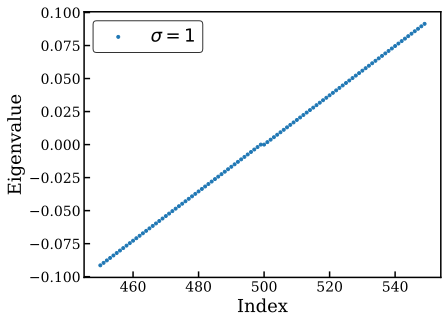

C:\Users\lenovo\AppData\Local\Temp\ipykernel_1200\1326629736.py:148: ComplexWarning: Casting complex values to real discards the imaginary part
  v[i]  = v1[2*i,2*i]+v1[2*i+1,2*i+1]+v2[2*i,2*i]+v2[2*i+1,2*i+1]


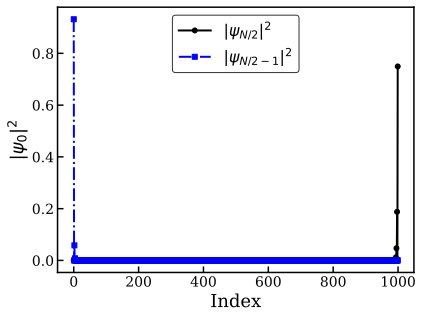

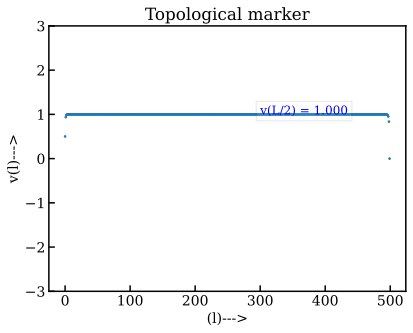

-250.0
0.7494984099608885
0.9318083916224484
topological marker in bulk(sigma=1)) 1.0000000000000013


In [21]:
%config InlineBackend.figure_format = 'svg'

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# Update matplotlib settings for publication-quality figures without LaTeX (to avoid errors)
mpl.rcParams.update({
    'text.usetex': False,         # Disable LaTeX to avoid needing a full installation
    'font.family': 'serif',
    'font.size': 14,
    'axes.linewidth': 1.5,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'lines.linewidth': 2,
    'lines.markersize': 8,
    'legend.frameon': True,
    'legend.edgecolor': 'black',
    'legend.fontsize': 12,
})

# Parameters
L = 1000
sigma =1          # wrapping of space-time
w = 1.0
v_val = 0.5          # hopping amplitude

# Construct SSH Hamiltonian (L x L complex matrix)
SHH = np.zeros((L, L), dtype=complex)
for i in range(L - 1):
    v_i = v_val * ((i + 1) / (L - 1)) ** sigma
    w_i = w * ((i + 1) / (L - 1)) ** sigma
    if i % 2 == 0:
        SHH[i + 1, i] = -v_i
        SHH[i, i + 1] = -v_i
    else:
        SHH[i + 1, i] = -w_i
        SHH[i, i + 1] = -w_i

# Diagonalize the Hamiltonian
eigenvalues, eigenvectors = np.linalg.eigh(SHH)
#plt.scatter(np.arange(len(eigenvalues)), eigenvalues, s=2)


#-----------------------------------------------------------------------------------

# # Filter the eigenvalues and corresponding x-range (indices) to plot only for x = 450 to 550
x_min=450
x_max=550
x_range = np.arange(x_min, x_max)  # x indices from 450 to 550
filtered_eigenvalues = eigenvalues[x_min:x_max]

# # # Plot the filtered data
plt.scatter(x_range, filtered_eigenvalues, s=9, label=f'$\\sigma = {sigma}$')  

plt.xlabel('Index', fontsize= 18)
plt.ylabel('Eigenvalue',fontsize= 18)
plt.legend(fontsize= 18)
#plt.title(f'Topologically nontrivial SSH: v={v_val}, w={w}, ',fontsize= 18)
plt.show()

#--------------------------------------------------------------------------------------------------


# ------------------------------
# Plot probability density for zero energy states:
# Use eigenvectors corresponding to indices L//2 and L//2 - 1.
prob_density  = np.abs(eigenvectors[:, L // 2]) ** 2
prob_density2 = np.abs(eigenvectors[:, L // 2 - 1]) ** 2

plt.figure()
#plt.title("Probability density for zero energy states", fontsize=18)
# plt.plot(np.arange(len(eigenvalues)), prob_density, label=r'$|\psi_{N/2}|^2$')
# plt.plot(np.arange(len(eigenvalues)), prob_density2, label=r'$|\psi_{N/2-1}|^2$')

plt.plot(np.arange(len(eigenvalues)), prob_density, 
         linestyle='-', marker='o', markersize=5, color='black', 
         label=r'$|\psi_{{N/2}}|^2$')
plt.plot(np.arange(len(eigenvalues)), prob_density2, 
         linestyle='-.', marker='s', markersize=5, color='blue', 
         label=r'$|\psi_{{N/2-1}}|^2 $')
plt.xlabel('Index', fontsize= 18)
plt.ylabel(r'$|\psi_{0}|^2 $',fontsize= 18)
plt.legend(fontsize=16)
#plt.xlim(0,10)


# ------------------------------


#------------------------------------------------------------------------------------------------------------




# Number of eigenvectors
num_eigenvectors = len(eigenvalues)

# Number of eigenvectors to include in each matrix (half in each case)
num_eigenvectors_half = num_eigenvectors // 2

# matrix from the first half of the eigenvectors
Um= np.column_stack(eigenvectors[:, :num_eigenvectors_half])

# matrix from the remaining half of the eigenvectors
Up= np.column_stack(eigenvectors[:, num_eigenvectors_half:])

trans_Um = np.transpose(Um)
trans_Up= np.transpose(Up)

Pp= trans_Up@Up
Pm=trans_Um@Um
Q=Pp-Pm
GA=np.zeros((L,L))
GB=np.zeros((L,L))
for i in range(len(eigenvalues)):
    if i % 2 == 0:
      GA[i,i]=1
for i in range(len(eigenvalues)):
    if i % 2 != 0:
      GB[i,i]=1

Qab= GA@Q@GB
Qba= GB@Q@GA
l=np.arange(-abs(L/4), abs(L/4) , 1 )
X= np.zeros((L,L))
X[0,0]=-L/4
for i in range(len(eigenvalues)):
        if i % 2 == 0:
         X[i,i]=-L/4+i/2
         X[i+1,i+1]=X[i,i]
#print(np.shape(GA))
#print(X)

v1=1/2*(Qba@(X@Qab-Qab@X))
v2=1/2*(Qab@(Qba@X-X@Qba))
#print(v1)
#--------------------------------------------
v=np.zeros(int(L/2))
#--------------------------------------- 
for i in range(int(L/2)-1):
    v[i]  = v1[2*i,2*i]+v1[2*i+1,2*i+1]+v2[2*i,2*i]+v2[2*i+1,2*i+1]
#print(v)
plt.figure()
plt.title("Topological marker")
plt.xlabel("(l)--->")
plt.ylabel("v(l)--->")
plt.scatter(np.arange(len(v)),v,s=3)

# Limit the y-axis from -3 to 3
plt.ylim(-3, 3)

# Determine the middle value (v at L/2)
v_middle = v[len(v)//2]  # This is equivalent to v[250] when L = 1000

# Annotate the graph with the v(L/2) value.
# Adjust the x and y coordinates in plt.text as needed.
plt.text(0.6 * len(v), v_middle, f"v(L/2) = {v_middle:.3f}", 
         fontsize=12, color='blue', 
         bbox=dict(facecolor='white', alpha=0.1))

plt.show()
print(X[0,0])
print(max(prob_density))
print(max(prob_density2))
print(f"topological marker in bulk(sigma={sigma}))",v[250])


In [22]:
#  No need now
#  Update matplotlib settings for publication-quality figures without LaTeX (to avoid errors)
mpl.rcParams.update({
    'text.usetex': False,         # Disable LaTeX to avoid needing a full installation
    'font.family': 'serif',
    'font.size': 26,
    'axes.linewidth': 2.5,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 12,
    'ytick.major.size': 12,
    'xtick.major.width': 2.5,
    'ytick.major.width': 2.5,
    'lines.linewidth': 2.5,
    'lines.markersize': 12,
    'legend.frameon': True,
    'legend.edgecolor': 'black',
    'legend.fontsize': 26,
})

plt.rcParams['xtick.labelsize'] = 26  # Change x-axis numbers to size 18
plt.rcParams['ytick.labelsize'] = 26  # Change y-axis numbers to size 18


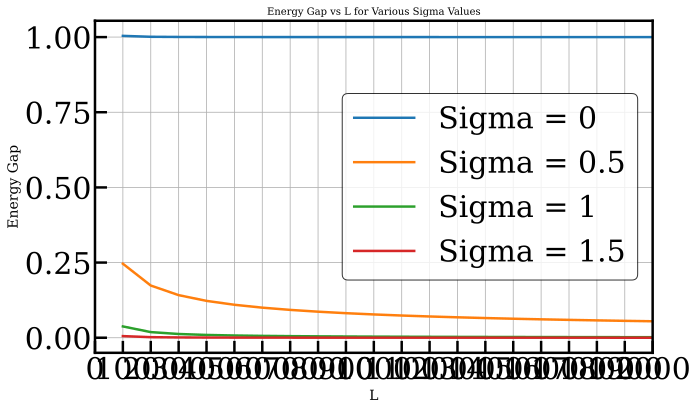

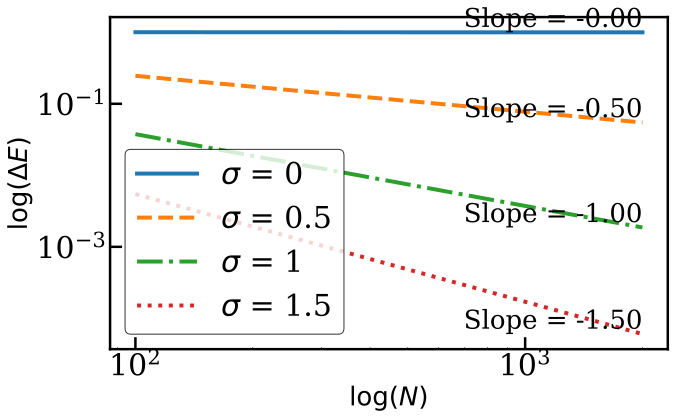

Slopes for each sigma value:
Sigma = 0: Slope = -0.001
Sigma = 0.5: Slope = -0.501
Sigma = 1: Slope = -1.003
Sigma = 1.5: Slope = -1.504


In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Function to create SSH Hamiltonian
def ssh_hamiltonian(L, v, w, sigma):
    SSH = np.zeros((L, L))
    for i in range(L - 1):
        v_i = v * ((i + 1) / (L - 1))**sigma
        w_i = w * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SSH[i + 1, i] = v_i
            SSH[i, i + 1] = v_i
        else:
            SSH[i + 1, i] = w_i
            SSH[i, i + 1] = w_i
    return SSH

# Function to calculate the energy gap for given parameters
def compute_energy_gap_real_space(L, t, dt, sigma):
    v = t + dt
    w = t - dt
    mid_index = L // 2
    SSH = ssh_hamiltonian(L, v, w, sigma)
    eigenvalues, eigenvectors = np.linalg.eigh(SSH)
    energy_gap = eigenvalues[mid_index + 1] - eigenvalues[mid_index - 2]
    return energy_gap

# Define specific sigma values to plot
sigma_values = [ 0,0.5,1, 1.5]  # Sigma values for each curve
L_values = np.arange(100, 2001, 100)  # L from 100 to 2000 with interval 100
dt = -0.25  # Constant delta_t
t = 0.75      # Constant t value

# Plotting
plt.figure(figsize=(10, 6))

# Loop over each sigma value to compute and plot the energy gap vs L
for sigma in sigma_values:
    energy_gaps = [compute_energy_gap_real_space(L, t, dt, sigma) for L in L_values]
    plt.plot(L_values, energy_gaps, label=f'Sigma = {sigma}')  # Plot for each sigma

# Add labels, title, and legend
plt.xlim(0, 2000)
plt.xticks(np.arange(0, 2001, 100))
plt.xlabel('L', fontsize=14)
plt.ylabel('Energy Gap', fontsize=14)
plt.title('Energy Gap vs L for Various Sigma Values', fontsize=10)
plt.legend()
plt.grid(True)
plt.show()

#-------------------------------------------------------------------------------

# # Plotting
# plt.figure(figsize=(10, 6))

# # Loop over each sigma value to compute and plot the energy gap vs L
# for sigma in sigma_values:
#     energy_gaps = [compute_energy_gap_real_space(L, t, dt, sigma) for L in L_values]
#     plt.plot(L_values, energy_gaps, label=f'Sigma = {sigma}')  # Plot for each sigma

# plt.xscale('log')
# plt.yscale('log')
# # plt.xlim(0, 2000)
# # plt.xticks(np.arange(0, 2001, 100))
# plt.xlabel('L (Log Scale)', fontsize=14)
# plt.ylabel('Energy Gap (Log Scale)', fontsize=14)
# plt.title('Energy Gap vs L for Various Sigma Values (Log-Log plot)', fontsize=10)
# plt.legend()
# plt.grid(True)
# plt.show()

#----------------------------------------------------------------------------------------

# Define your list of line styles.
# Common options include solid, dashed, dash-dot, and dotted lines.

# Plotting with slope for each line
plt.figure(figsize=(10, 6))
line_styles = ['-', '--', '-.', ':']
# Dictionary to store slopes for each sigma
slopes = {}

# Loop over each sigma value to compute and plot the energy gap vs L
for i, sigma in enumerate(sigma_values): 
    energy_gaps = [compute_energy_gap_real_space(L, t, dt, sigma) for L in L_values]
    
    # Calculate the slope in log-log space
    log_L = np.log(L_values)
    log_energy_gaps = np.log(energy_gaps)
    slope, intercept = np.polyfit(log_L, log_energy_gaps, 1)  # Linear fit in log-log space
    slopes[sigma] = slope  # Store the slope for each sigma
      # Select a line style from the list: cycle through the list if there are more sigma values than styles.
    style = line_styles[i % len(line_styles)]
    # Plot each line
    plt.plot(L_values, energy_gaps, style,label=f'$\sigma$ = {sigma}', linewidth=4)
    
    # Annotate the slope on the graph at the end of each line
    plt.text(L_values[-1], energy_gaps[-1], f"Slope = {slope:.2f}", 
             fontsize=26, verticalalignment='bottom', horizontalalignment='right')

# Set log scale for both axes
plt.xscale('log')
plt.yscale('log')

# Customize axis labels and title
plt.xlabel('$\log (N)$', fontsize=26)
plt.ylabel('$\log (\Delta E)$', fontsize=26)
#plt.title('Energy Gap vs L for Various Sigma Values (Log-Log plot)', fontsize=18)

# Add legend and grid for better visualization
plt.legend()
#plt.grid(True)

# Show the plot
plt.show()

# Print the calculated slopes
print("Slopes for each sigma value:")
for sigma, slope in slopes.items():
    print(f"Sigma = {sigma}: Slope = {slope:.3f}")


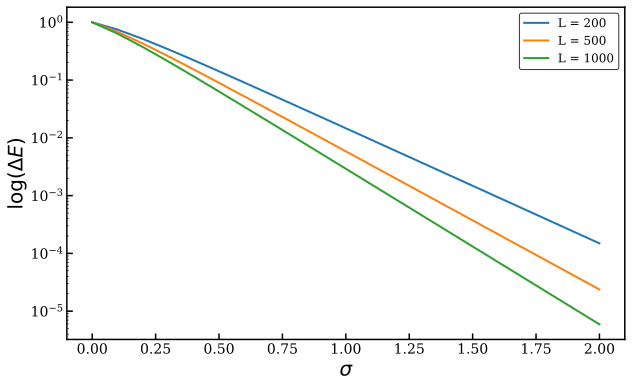

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Function to create SSH Hamiltonian
def ssh_hamiltonian(L, v, w, sigma):
    SSH = np.zeros((L, L))
    for i in range(L - 1):
        v_i = v * ((i + 1) / (L - 1))**sigma
        w_i = w * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SSH[i + 1, i] = v_i
            SSH[i, i + 1] = v_i
        else:
            SSH[i + 1, i] = w_i
            SSH[i, i + 1] = w_i
    return SSH

# Function to calculate the energy gap for given parameters
def compute_energy_gap_real_space(L, t, dt, sigma):
    v = t + dt
    w = t - dt
    mid_index = L // 2
    SSH = ssh_hamiltonian(L, v, w, sigma)
    eigenvalues, eigenvectors = np.linalg.eigh(SSH)
    # Here we assume eigenvalues are sorted; adjust indices if needed.
    energy_gap = eigenvalues[mid_index + 1] - eigenvalues[mid_index - 1]
    return energy_gap

# Define sigma values from 0 to 2 in steps of 0.1
sigma_values = np.arange(0, 2.1, 0.1)
# Fixed L values
L_values = [200,500,1000]
dt = -0.5  # Constant delta_t
t = 1    # Constant t value

plt.figure(figsize=(10, 6))

# Loop over each L value to compute and plot energy gap vs sigma
for L in L_values:
    energy_gaps = [compute_energy_gap_real_space(L, t, dt, sigma) for sigma in sigma_values]
    plt.plot(sigma_values, energy_gaps, label=f'L = {L}')
    plt.legend(fontsize=20)

# Add labels, title, legend, and grid
#plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\sigma$', fontsize=20)
plt.ylabel('$\log (\Delta E)$', fontsize=20)
#plt.title('Energy Gap vs Sigma for Different L values', fontsize=16)
plt.legend()
#plt.grid(True)
plt.show()


In [27]:
%config InlineBackend.figure_format = 'svg'

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# Update matplotlib settings for publication-quality figures without LaTeX (to avoid errors)
mpl.rcParams.update({
    'text.usetex': False,         # Disable LaTeX to avoid needing a full installation
    'font.family': 'serif',
    'font.size': 14,
    'axes.linewidth': 1.5,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'lines.linewidth': 2,
    'lines.markersize': 8,
    'legend.frameon': True,
    'legend.edgecolor': 'black',
    'legend.fontsize': 12,
})

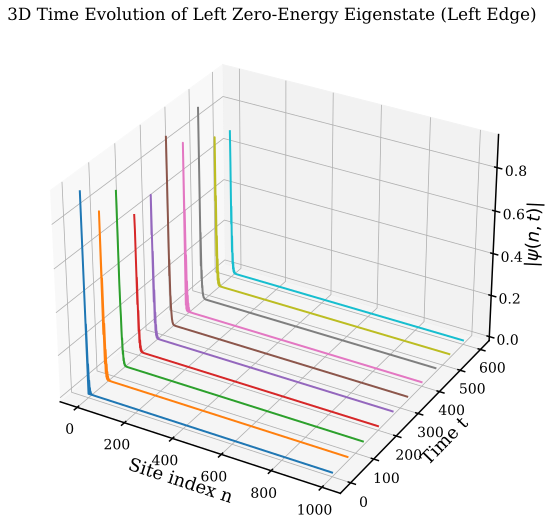

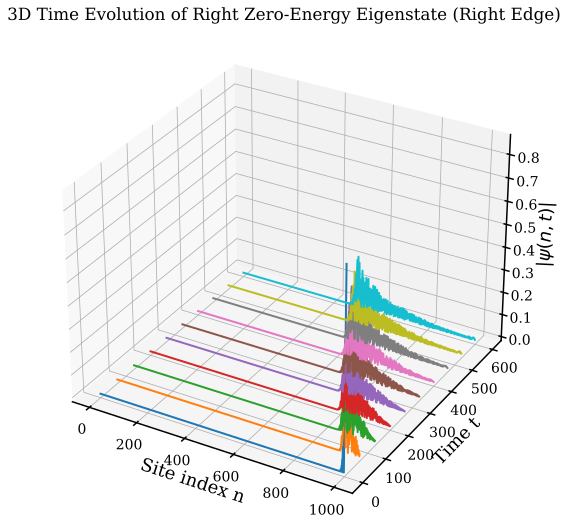

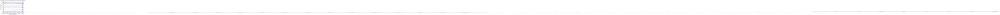

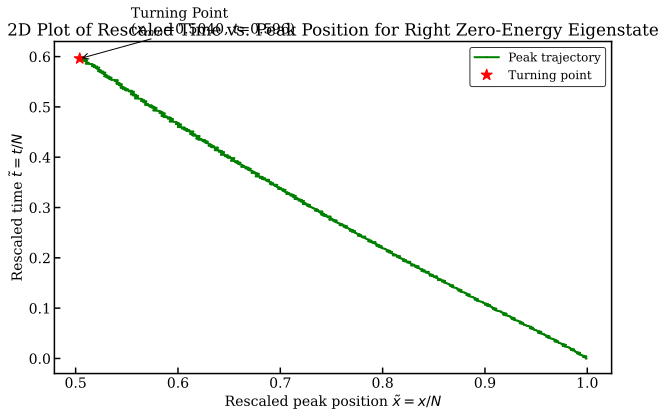

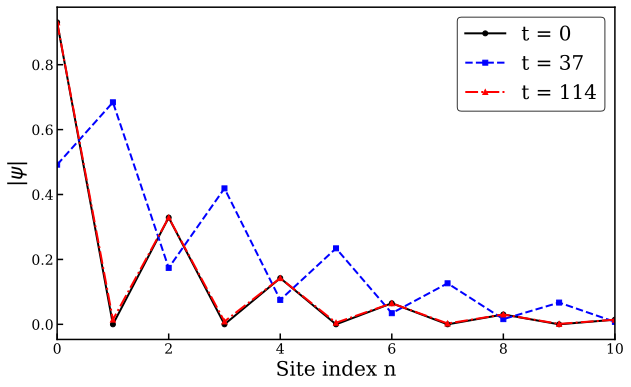

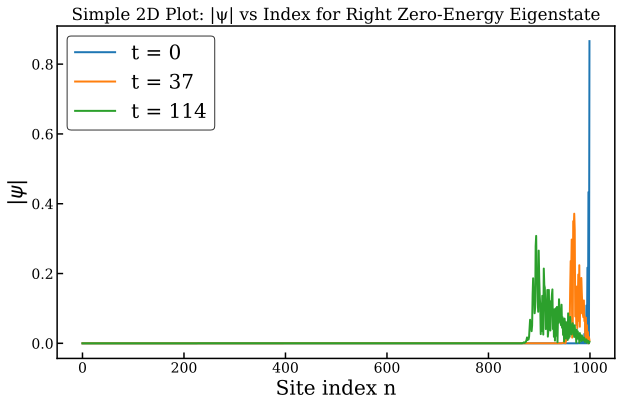

In [34]:
# SSH Time Evolution

import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def build_ssh_hamiltonian(N, v, w, sigma):
    """
    Build the SSH Hamiltonian on a 1D lattice of N sites.
    """
    H = np.zeros((N, N), dtype=complex)
    for i in range(N-1):
        # Scale the hopping amplitudes with position
        v_i = v * ((i + 1) / (N-1))**sigma
        w_i = w * ((i + 1) / (N-1))**sigma
        if i % 2 == 0:
            H[i, i+1] = -v_i
            H[i+1, i] = -v_i
        else:
            H[i, i+1] = -w_i
            H[i+1, i] = -w_i
    return H

def tb_model(N, sigma):
    """
    Build a tight-binding model Hamiltonian for comparison.
    """
    J = 1
    H_tb = np.zeros((N, N), dtype=complex)
    for i in range(N - 1):
        J_i = J * ((i + 1) / (N - 1))**sigma
        H_tb[i, i + 1] = -J_i
        H_tb[i + 1, i] = -J_i
    return H_tb

def kitaev_chain(N, mu, t, delta, sigma):
    """
    Construct the Kitaev chain Hamiltonian.
    """
    A = np.zeros((N, N), dtype=complex)
    B = np.zeros((N, N), dtype=complex)

    for i in range(N):
        A[i, i] = -mu  # on-site energy
        if i < N - 1:
            t_i = -t * ((i + 1) / (N - 1))**sigma
            A[i, i+1] = -t_i
            A[i+1, i] = -t_i
            B[i, i+1] = delta
            B[i+1, i] = -delta

    H_kc = np.block([
        [A,         B],
        [B.conj().T, -A.conj().T]
    ])
    return H_kc

def boosted_dirac_delta(N, n0, p0):
    """
    Create a boosted Dirac delta state.
    """
    psi = np.zeros(N, dtype=complex)
    n0_int = int(n0)
    psi[n0_int] = np.exp(1j * p0 * n0_int)
    return psi

def gaussian_wave_packet(N, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(N)
    psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N, v, w, sigma, mu, t, delta, n0, p0, omega, dt, T, plot_times):
    """
    Evolve the two zero-energy eigenstates under a target SSH Hamiltonian.
    
    The zero-energy eigenstates are extracted from the SSH Hamiltonian built with
    (N, v, w, σ) = (1000, 0.5, 1, 1) and then evolved in time under the SSH Hamiltonian built with
    (N, v, w, σ) = (1000, 1, 0.5, 1).
    """
    # 1) Build the two Hamiltonians:
    # H_extract for eigenstate extraction (using v=0.5, w=1)
    H_extract = build_ssh_hamiltonian(N, 0.5, 1, sigma)
    # H_evolve for time evolution (using v=1, w=0.5)
    H_evolve = build_ssh_hamiltonian(N, 1, 0.5, sigma)
    
    # Other Hamiltonians (for comparison, if needed)
    H_tb = tb_model(N, sigma)
    H_kitaev = kitaev_chain(N, mu, t, delta, sigma)
    
    # 2) Build the time evolution operator U = exp(-i H_evolve dt)
    U = expm(-1j * H_evolve * dt)
    
    # 3) Extract the two zero-energy eigenstates from H_extract.
    eigvals, eigvecs = np.linalg.eigh(H_extract)
    tol = 1e-6
    zero_indices = np.where(np.abs(eigvals) < tol)[0]
    if len(zero_indices) < 2:
        raise ValueError("Expected at least two zero-energy eigenstates, but found less.")
    
    # Get the two candidate eigenstates.
    psi_candidate1 = eigvecs[:, zero_indices[0]]
    psi_candidate2 = eigvecs[:, zero_indices[1]]
    
    # Determine which eigenstate is localized on the left and which on the right.
    positions = np.arange(N)
    peak1 = np.argmax(np.abs(psi_candidate1))
    peak2 = np.argmax(np.abs(psi_candidate2))
    
    if peak1 < peak2:
        psi_left = psi_candidate1  # Localized on the left edge (near index 0)
        psi_right = psi_candidate2  # Localized on the right edge (near index N-1)
    else:
        psi_left = psi_candidate2
        psi_right = psi_candidate1
    
    # 4) Determine the number of time steps and record the initial states.
    t_steps = int(np.round(T / dt))
    psi_left_t = [np.abs(psi_left.copy())]
    psi_right_t = [np.abs(psi_right.copy())]
    
    # 5) Evolve both eigenstates in time using H_evolve.
    for step in range(t_steps):
        psi_left = U @ psi_left
        psi_right = U @ psi_right
        psi_left_t.append(np.abs(psi_left))
        psi_right_t.append(np.abs(psi_right))
    
    # 6) Create 3D plots of the full evolution snapshots for each eigenstate separately.
    times_to_plot = np.linspace(0, t_steps, plot_times, dtype=int)
    positions = np.arange(N)
    
    # 3D plot for the left edge eigenstate.
    fig1 = plt.figure(figsize=(15, 9))
    ax1 = fig1.add_subplot(111, projection='3d')
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_left_t[t_idx]
        ax1.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    ax1.set_xlabel("Site index n", fontsize=18)
    ax1.set_ylabel("Time t", fontsize=18)
    ax1.set_zlabel(r"$|\psi(n,t)|$", fontsize=18)
    ax1.set_title("3D Time Evolution of Left Zero-Energy Eigenstate (Left Edge)")
    plt.show()
    
    # 3D plot for the right edge eigenstate.
    fig2 = plt.figure(figsize=(15, 9))
    ax2 = fig2.add_subplot(111, projection='3d')
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_right_t[t_idx]
        ax2.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    ax2.set_xlabel("Site index n", fontsize=18)
    ax2.set_ylabel("Time t", fontsize=18)
    ax2.set_zlabel(r"$|\psi(n,t)|$", fontsize=18)
    ax2.set_title("3D Time Evolution of Right Zero-Energy Eigenstate (Right Edge)")
    plt.show()
    
    #####################################################################################################
    # 7) For the left eigenstate: Compute the peak positions and rescaled values for the 2D plot.
    peak_positions_left = []
    rescaled_times_left = []
    rescaled_positions_left = []
    for step, psi_abs in enumerate(psi_left_t):
        peak_index = np.argmax(psi_abs)  # peak position at this time step
        peak_positions_left.append(peak_index)
        t_val = step * dt
        rescaled_times_left.append(t_val / N)         # t̃ = t/N
        rescaled_positions_left.append(peak_index / N)  # x̃ = x/N

    turning_index_left = np.argmin(rescaled_positions_left)
    turning_time_left = rescaled_times_left[turning_index_left]
    turning_pos_left = rescaled_positions_left[turning_index_left]

    # 8) Create a 2D plot of rescaled peak position vs. rescaled time for the left eigenstate.
    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions_left, rescaled_times_left, 'o-', color='blue', markersize=1, label="Peak trajectory")
    plt.plot(turning_pos_left, turning_time_left, 'r*', markersize=12, label="Turning point")
    plt.xlabel(r"Rescaled peak position $\tilde{x} = x/N$")
    plt.ylabel(r"Rescaled time $\tilde{t} = t/N$")
    plt.title("2D Plot of Rescaled Time vs. Peak Position for Left Zero-Energy Eigenstate")
    plt.legend()
    plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos_left:.4f}, $t$={turning_time_left:.3f})", 
                 xy=(turning_pos_left, turning_time_left), 
                 xytext=(turning_pos_left+0.05, turning_time_left+0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.show()
    
    # 7 & 8) For the right eigenstate: Compute the peak positions and plot the 2D graph.
    peak_positions_right = []
    rescaled_times_right = []
    rescaled_positions_right = []
    for step, psi_abs in enumerate(psi_right_t):
        peak_index = np.argmax(psi_abs)
        peak_positions_right.append(peak_index)
        t_val = step * dt
        rescaled_times_right.append(t_val / N)
        rescaled_positions_right.append(peak_index / N)

    turning_index_right = np.argmin(rescaled_positions_right)
    turning_time_right = rescaled_times_right[turning_index_right]
    turning_pos_right = rescaled_positions_right[turning_index_right]

    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions_right, rescaled_times_right, 'o-', color='green', markersize=1, label="Peak trajectory")
    plt.plot(turning_pos_right, turning_time_right, 'r*', markersize=12, label="Turning point")
    plt.xlabel(r"Rescaled peak position $\tilde{x} = x/N$")
    plt.ylabel(r"Rescaled time $\tilde{t} = t/N$")
    plt.title("2D Plot of Rescaled Time vs. Peak Position for Right Zero-Energy Eigenstate")
    plt.legend()
    plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos_right:.4f}, $t$={turning_time_right:.3f})", 
                 xy=(turning_pos_right, turning_time_right), 
                 xytext=(turning_pos_right+0.05, turning_time_right+0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.show()
    
    #####################################################################################################
    # 9) Create simpler 2D plots of |ψ| vs. site index for selected time steps.
    #    Selected time indices.
    selected_indices = [0, 37, 114] #time for maxima or minima
    
    # For the left eigenstate.
#     plt.figure(figsize=(10,6))
#     for idx in selected_indices:
#         plt.plot(np.arange(N), psi_left_t[idx], label=f't = {idx}')
#     plt.xlabel("Site index n",fontsize=20)
#     plt.ylabel(r"$|\psi|$",fontsize=20)
#    # plt.title("Simple 2D Plot: |ψ| vs Index for Left Zero-Energy Eigenstate")
#     plt.xlim(0, 10) 
#     plt.legend(fontsize=20)
#     plt.show()

    #####################################################
    plt.figure(figsize=(10,6))

# Define lists for colors, line styles, and markers
    colors = ['k', 'b', 'r', 'g']         # black, blue, red, green
    line_styles = ['-', '--', '-.', ':']   # solid, dashed, dash-dot, dotted
    markers = ['o', 's', '^', 'd']          # circle, square, triangle, diamond

# Loop over the selected indices
    for i, idx in enumerate(selected_indices):
     plt.plot(np.arange(N), psi_left_t[idx],
             label=f't = {idx}',
             color=colors[i % len(colors)],
             linestyle=line_styles[i % len(line_styles)],
             marker=markers[i % len(markers)],
             markersize=5,
             linewidth=2)

    plt.xlabel("Site index n", fontsize=20)
    plt.ylabel(r"$|\psi|$", fontsize=20)
    plt.xlim(0, 10)
    plt.legend(fontsize=20)
    plt.show()



    ###########################################################
    
    # For the right eigenstate.
    plt.figure(figsize=(10,6))
    for idx in selected_indices:
        plt.plot(np.arange(N), psi_right_t[idx], label=f't = {idx}')
    plt.xlabel("Site index n",fontsize=20)
    plt.ylabel(r"$|\psi|$",fontsize=20)
    plt.title("Simple 2D Plot: |ψ| vs Index for Right Zero-Energy Eigenstate")
    plt.legend(fontsize=20)
    plt.show()

if __name__ == "__main__":
    run_time_evolution(
        N=1000,         # Number of lattice sites
        v=1,            # Dummy parameter (not used for extraction/evolution)
        w=0.5,          # Dummy parameter (not used for extraction/evolution)
        sigma=0.5,
        mu=0,
        t=1.6,
        delta=12,
        omega=25,       # Unused now (Gaussian parameter, kept for compatibility)
        n0=750,         # Unused now (Gaussian center, kept for compatibility)
        p0=-1.6*np.pi/2,    # Unused now (Gaussian momentum, kept for compatibility)
        dt=1,           # Time step
        T=1000*0.6,     # Total evolution time
        plot_times=10   # Number of snapshots for 3D plot
    )


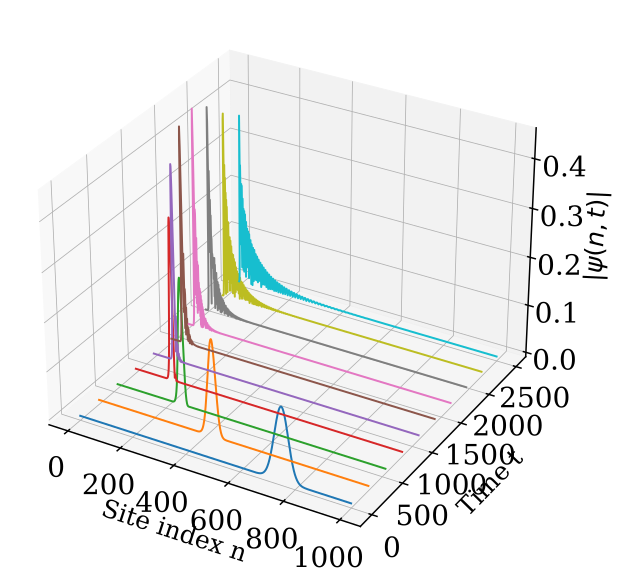

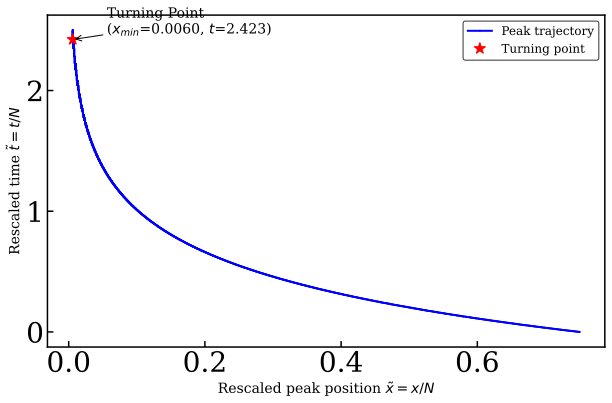

In [4]:
#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def build_ssh_hamiltonian(N, v, w, sigma):
    """
    Build the SSH Hamiltonian on a 1D lattice of N sites.
    """
    H = np.zeros((N, N), dtype=complex)
    for i in range(N-1):
        # Scale the hopping amplitudes with position
        v_i = v * ((i + 1) / (N-1))**sigma
        w_i = w * ((i + 1) / (N-1))**sigma
        if i % 2 == 0:
            H[i, i+1] = -v_i
            H[i+1, i] = -v_i
        else:
            H[i, i+1] = -w_i
            H[i+1, i] = -w_i
    return H

###########################################
# New SSH Hamiltonian with additional hoppings and updated parameters
def SSH(L,c,sigma):
    """
    Construct the SSH Hamiltonian with additional hoppings for a given 
    winding number parameter c and exponent sigma, using updated parameters.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w_val = t - dt    # Note: w = t - dt
        v_val = t + dt    # v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        t = 0.20
        dt = 0.05
        w_val = t - dt
        v_val = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 3:
        t = 0.3
        dt = -0.2
        w_val = t - dt
        v_val = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)
    
    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v_val * ((i + 1) / (L - 1))**sigma
        w_i = w_val * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = -v_i
            SHH[i, i + 1] = -v_i
        else:
            SHH[i + 1, i] = -w_i
            SHH[i, i + 1] = -w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

#############################################


def tb_model(N, sigma):
    """
    Build a tight-binding model Hamiltonian for comparison.
    """
    J = 1
    H_tb = np.zeros((N, N), dtype=complex)
    for i in range(N - 1):
        J_i = J * ((i + 1) / (N - 1))**sigma
        H_tb[i, i + 1] = -J_i
        H_tb[i + 1, i] = -J_i
    return H_tb

def kitaev_chain(N, mu, t, delta, sigma):
    # Construct the N x N matrices A (kinetic part) and B (pairing part)
    A = np.zeros((N, N), dtype=complex)
    B = np.zeros((N, N), dtype=complex)

    for i in range(N):
        A[i, i] = -mu  # on-site energy
        if i < N - 1:
            t_i = -t * ((i + 1) / (N - 1))**sigma
            A[i, i+1] = -t_i
            A[i+1, i] = -t_i
            B[i, i+1] = delta
            B[i+1, i] = -delta

    H_kc = np.block([
        [A,         B],
        [B.conj().T, -A.conj().T]
    ])
    return H_kc

def boosted_dirac_delta(N, n0, p0):
    psi = np.zeros(N, dtype=complex)
    n0_int = int(n0)
    psi[n0_int] = np.exp(1j * p0 * n0_int)
    return psi

def gaussian_wave_packet(N, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(N)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N,L,c, v, w, sigma, mu, t, delta, n0, p0, omega, dt, T, plot_times):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    """
    # 1) Build the Hamiltonians
    H_SSH = build_ssh_hamiltonian(N, v, w, sigma)
    H_extended= SSH(L,c, sigma)
    H_tb = tb_model(N, sigma)
    H_kitaev = kitaev_chain(N, mu, t, delta, sigma)
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_SSH* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(N, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the number of time steps and record the initial state
    t_steps = int(np.round(T / dt))
    psi_t = [np.abs(psi.copy())]
    
    # 5) Evolve the wavefunction in time
    for step in range(t_steps):
        psi = U @ psi
        psi_t.append(np.abs(psi))
    
    # 6) (Optional) Original 3D plot of the full evolution snapshots
    times_to_plot = np.linspace(0, t_steps, plot_times, dtype=int)
    positions = np.arange(N)
    
    fig = plt.figure(figsize=(18, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_t[t_idx]
        ax.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    
    ax.set_xlabel("Site index n", fontsize=25, labelpad=20)
    ax.set_ylabel("Time t", fontsize=25, labelpad=20)
    ax.set_zlabel(r"$|\psi(n,t)|$", fontsize=25, labelpad=20)

    # Adjust tick parameters to increase spacing (pad) between ticks and tick labels
    ax.tick_params(axis='x', which='major', pad=10)
    ax.tick_params(axis='y', which='major', pad=10)
    ax.tick_params(axis='z', which='major', pad=10)
   # ax.set_title(f"3D Time Evolution of Gaussian Packet\n(SSH Hamiltonian: v={v}, w={w}, σ={sigma}, $p_0$={p0}) \n(formula turning point={n0/1000*((np.cos(p0))**(2)+((w/v-1)/(w/v+1))**(2)-(np.cos(p0))**(2)*((w/v-1)/(w/v+1))**(2))**(1/(2*sigma))})")
    plt.show()
    
   
#####################################################################################################

    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []
    for step, psi_abs in enumerate(psi_t):
        peak_index = np.argmax(psi_abs)  # peak position at this time step
        peak_positions.append(peak_index)
        t_val = step * dt
        rescaled_times.append(t_val / N)         # t̃ = t/N
        rescaled_positions.append(peak_index / N)  # x̃ = x/N

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # 8) Create a 2D plot of rescaled peak position vs. rescaled time.
    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions, rescaled_times, 'o-', color='blue', markersize=1, label="Peak trajectory")
    # Mark the turning point with a red star
    plt.plot(turning_pos, turning_time, 'r*', markersize=12, label="Turning point")
    plt.xlabel(r"Rescaled peak position $\tilde{x} = x/N$")
    plt.ylabel(r"Rescaled time $\tilde{t} = t/N$")
    #plt.title(f"2D Plot of Rescaled Time vs. Peak Position of Gaussian Wavepacket($p_0$={p0}),\n(formula turning point={n0/N*((np.cos(p0))**(2)+((w/v-1)/(w/v+1))**(2)-(np.cos(p0))**(2)*((w/v-1)/(w/v+1))**(2))**(1/(2*sigma))})")
    plt.legend()
    #plt.grid(True)
    
    # Optionally add an annotation for clarity
    plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos:.4f}, $t$={turning_time:.3f})", 
                 xy=(turning_pos, turning_time), 
                 xytext=(turning_pos+0.05, turning_time+0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    
    plt.show()
###########################################################################################################################################
if __name__ == "__main__":
    run_time_evolution(
        N=1000,
        L=1000,           # Number of lattice sites
        c=1,               #winding number
        v=1,            # Hopping parameter v
        w=1,            # Hopping parameter w
        sigma=1,
        mu=0,
        t=1.6,
        delta=12,
        omega=25,       # Gaussian width parameter
        n0=750,         # Localization site for the Gaussian
        p0=-1*np.pi/2,    # Momentum boost
        dt=1,         # Time step
        T=2500,         # Total evolution time
        plot_times=10   # Number of snapshots for 3D plot
    )

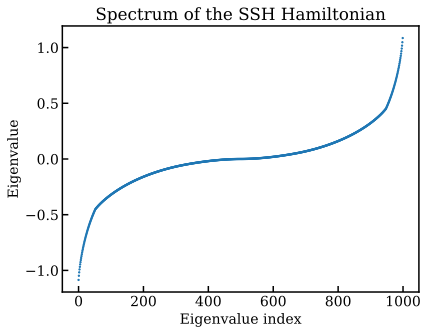

Indices of zero-energy eigenstates: [498 499 500 501]
Zero-energy eigenvalues: [-4.57652298e-18  0.00000000e+00  0.00000000e+00  4.57652298e-18]
Zero-energy state index 498 has a peak probability density of 0.418708012822295
Zero-energy state index 499 has a peak probability density of 1.0
Zero-energy state index 500 has a peak probability density of 1.0
Zero-energy state index 501 has a peak probability density of 0.4187080128223309


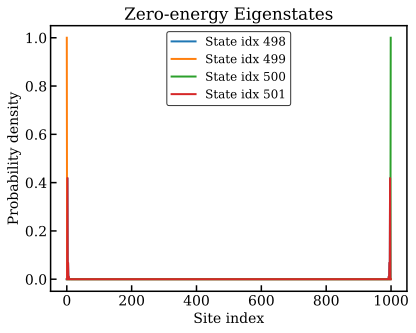

C:\Users\lenovo\AppData\Local\Temp\ipykernel_21564\1380330578.py:206: ComplexWarning: Casting complex values to real discards the imaginary part
  v_topo[i] = (v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +


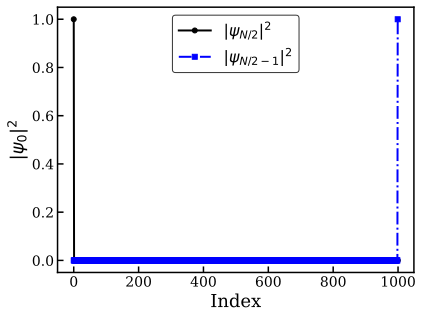

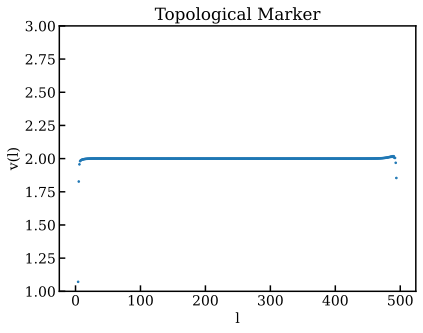

In [61]:
#EXTENDED SSH MODEL
import numpy as np
import matplotlib.pyplot as plt

# Global system size
L = 1000

def SSH(c, sigma):
    """
    Construct the Hamiltonian for the SSH model with additional hoppings
    and given winding number parameter c and exponent sigma.
    """
    if c == 2:
        t = 0.085
        dt = -0.085
        w = t - dt
        v = t + dt
        nu = 0.43
        mu = 0.17
        gamma = 0.37
    elif c == 4:
        # Two possible sets of parameters; here we choose one:
        t = 0.185
        dt = 0.015
        w = t - dt
        v = t + dt
        nu = 0.43
        mu = 0.17
        gamma = 0.37
    elif c == 3:
        t = 0.25
        dt = -0.15
        w = t - dt
        v = t + dt
        nu = 0.28
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)

    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v * ((i + 1) / (L - 1))**sigma
        w_i = w * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = v_i
            SHH[i, i + 1] = v_i
        else:
            SHH[i + 1, i] = w_i
            SHH[i, i + 1] = w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

#------------------------------------------------------------------------------
# Main execution: choose parameters
c = 2           # winding number (choose among 0,1,2,3,4)
sigma = 1.8   # sigma value (wrapping exponent)

# Build Hamiltonian
H = SSH(c, sigma)

# Diagonalize the Hamiltonian
eigenvalues, eigenvectors = np.linalg.eigh(H)

#------------------------------------------------------------------------------
# 1. Plot ALL eigenvalues vs index
plt.figure()
plt.scatter(np.arange(len(eigenvalues)), eigenvalues, s=2)
plt.xlabel("Eigenvalue index")
plt.ylabel("Eigenvalue")
plt.title("Spectrum of the SSH Hamiltonian")
plt.show()

#------------------------------------------------------------------------------
# 2. Identify and plot all zero-energy eigenstates
tol = 1e-6  # tolerance for treating an eigenvalue as zero
zero_indices = np.where(np.abs(eigenvalues) < tol)[0]
print("Indices of zero-energy eigenstates:", zero_indices)
print("Zero-energy eigenvalues:", eigenvalues[zero_indices])

# Plot each zero-energy state (their probability density |ψ|^2)
plt.figure()
for idx in zero_indices:
    probability_density = np.abs(eigenvectors[:, idx])**2
    peak_value = np.max(probability_density)
    print(f"Zero-energy state index {idx} has a peak probability density of {peak_value}")
    plt.plot(np.arange(L), probability_density, lw=2, 
             label=f"State idx {idx}")
plt.xlabel("Site index")
plt.ylabel("Probability density")
plt.title("Zero-energy Eigenstates")
plt.legend()
plt.show()

#------------------------------------------------------------------------------


prob_density  = np.abs(eigenvectors[:, L // 2]) ** 2
prob_density2 = np.abs(eigenvectors[:, L // 2 - 1]) ** 2

plt.figure()
#plt.title("Probability density for zero energy states", fontsize=18)
# plt.plot(np.arange(len(eigenvalues)), prob_density, label=r'$|\psi_{N/2}|^2$')
# plt.plot(np.arange(len(eigenvalues)), prob_density2, label=r'$|\psi_{N/2-1}|^2$')

plt.plot(np.arange(len(eigenvalues)), prob_density2, 
         linestyle='-', marker='o', markersize=5, color='black', 
         label=r'$|\psi_{{N/2}}|^2$')
plt.plot(np.arange(len(eigenvalues)), prob_density, 
         linestyle='-.', marker='s', markersize=5, color='blue', 
         label=r'$|\psi_{{N/2-1}}|^2 $')
plt.xlabel('Index', fontsize= 18)
plt.ylabel(r'$|\psi_{0}|^2 $',fontsize= 18)
plt.legend(fontsize=16)
#plt.xlim(0,10)









#######################################################################################
# 3. Compute and plot the topological marker

# Split the full set of eigenvectors into two halves
num_eigenvectors = len(eigenvalues)
num_eigenvectors_half = num_eigenvectors // 2

# Construct matrices from eigenvectors
Um = np.column_stack(eigenvectors[:, :num_eigenvectors_half])
Up = np.column_stack(eigenvectors[:, num_eigenvectors_half:])

# Compute projectors
Pp = np.dot(Up.T, Up)
Pm = np.dot(Um.T, Um)
Q = Pp - Pm

# Define GA and GB as diagonal matrices (even indices in GA, odd in GB)
GA = np.zeros((L, L))
GB = np.zeros((L, L))
for i in range(L):
    if i % 2 == 0:
        GA[i, i] = 1
    else:
        GB[i, i] = 1

# Off-diagonal blocks of Q
Qab = GA @ Q @ GB
Qba = GB @ Q @ GA

# Define the position-like operator X (diagonal matrix)
X = np.zeros((L, L))
# Set the first element; then for every pair of even-odd indices update X
X[0, 0] = -L/4
for i in range(0, L - 1, 2):
    X[i, i] = -L/4 + i/2
    if i + 1 < L:
        X[i+1, i+1] = X[i, i]

# Compute v1 and v2 as in the provided method
v1 = 0.5 * (Qba @ (X @ Qab - Qab @ X))
v2 = 0.5 * (Qab @ (Qba @ X - X @ Qba))

# Evaluate the topological marker v(l)
v_topo = np.zeros(L // 2)
for i in range(L // 2 - 1):
    v_topo[i] = (v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +
                 v2[2*i, 2*i] + v2[2*i+1, 2*i+1])

plt.figure()
plt.scatter(np.arange(len(v_topo)), v_topo, s=3)
plt.xlabel("l")
plt.ylabel("v(l)")
plt.title("Topological Marker")
plt.ylim(c-1,c+1)
plt.show()


Indices of zero-energy eigenstates: [498 499 500 501]
Zero-energy eigenvalues: [-1.14360479e-16  0.00000000e+00  0.00000000e+00  3.83803439e-17]
Zero-energy state index 498 has a peak probability density of 0.8374160256447815
Zero-energy state index 499 has a peak probability density of 1.0
Zero-energy state index 500 has a peak probability density of 1.0
Zero-energy state index 501 has a peak probability density of 0.8374160256447815


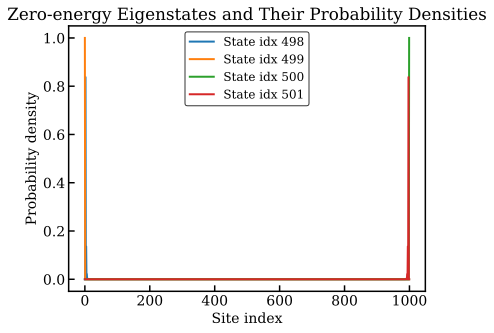

In [54]:
# Identify zero-energy eigenstates with a numerical tolerance
tol = 1e-6  # tolerance for considering an eigenvalue to be zero
zero_indices = np.where(np.abs(eigenvalues) < tol)[0]
print("Indices of zero-energy eigenstates:", zero_indices)
print("Zero-energy eigenvalues:", eigenvalues[zero_indices])

# Plot and print the peak values for each zero-energy eigenstate
plt.figure()
for idx in zero_indices:
    # Compute probability density for the eigenstate
    probability_density = np.abs(eigenvectors[:, idx])**2
    # Find the peak value (maximum of the probability density)
    peak_value = np.max(probability_density)
    print(f"Zero-energy state index {idx} has a peak probability density of {peak_value}")
    
    # Plot the probability density (optional visualization)
    plt.plot(np.arange(L), probability_density, lw=2, label=f"State idx {idx}")
plt.xlabel("Site index")
plt.ylabel("Probability density")
plt.title("Zero-energy Eigenstates and Their Probability Densities")
plt.legend()
plt.show()


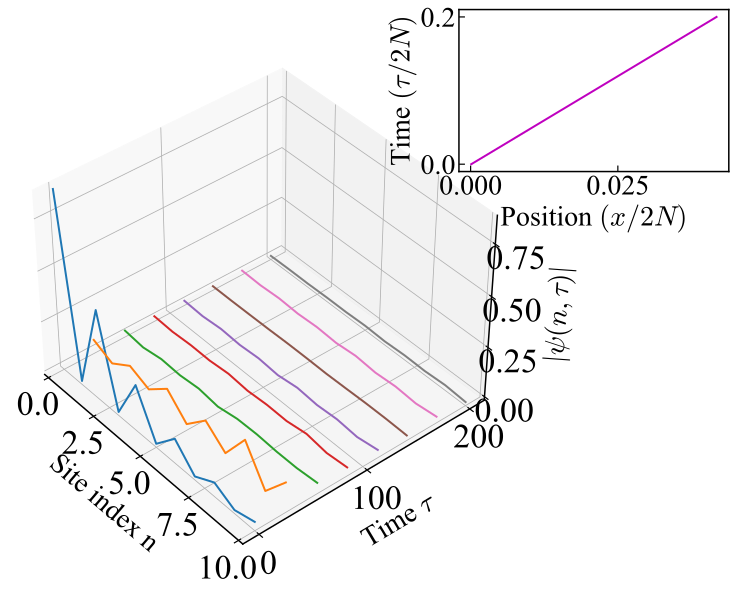

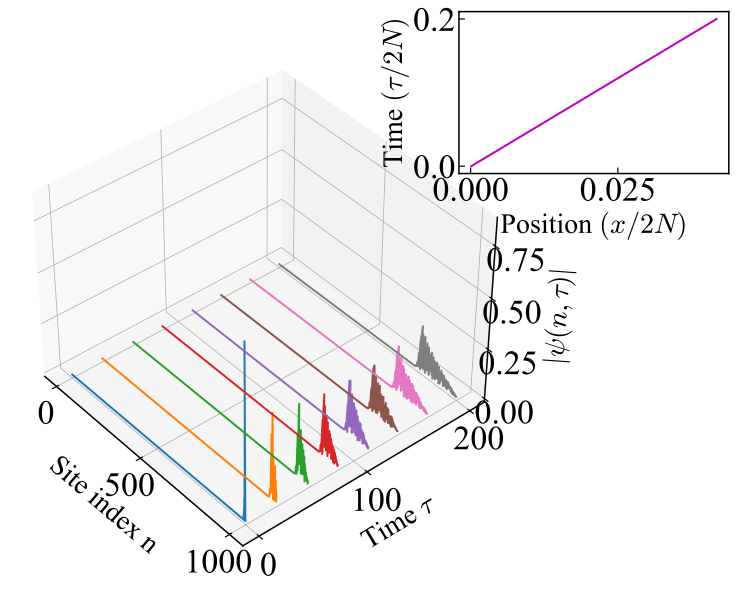

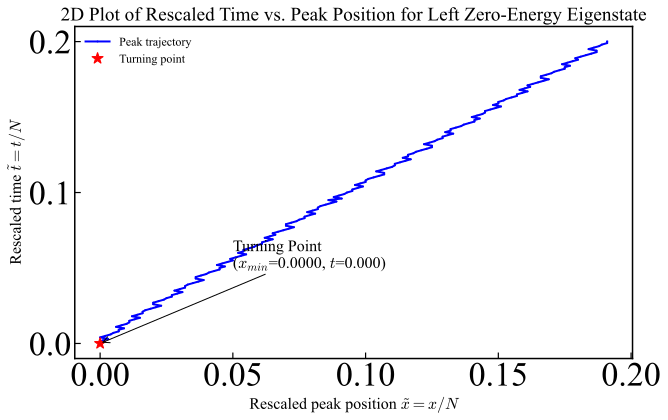

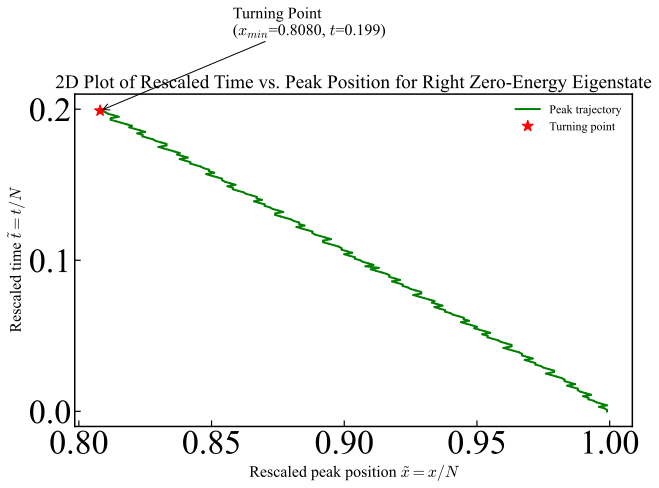

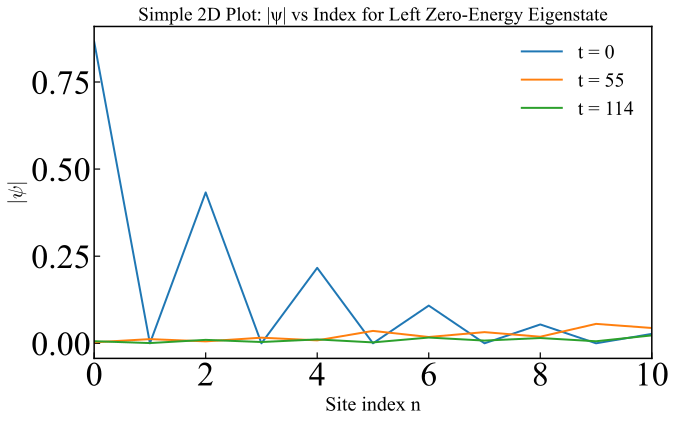

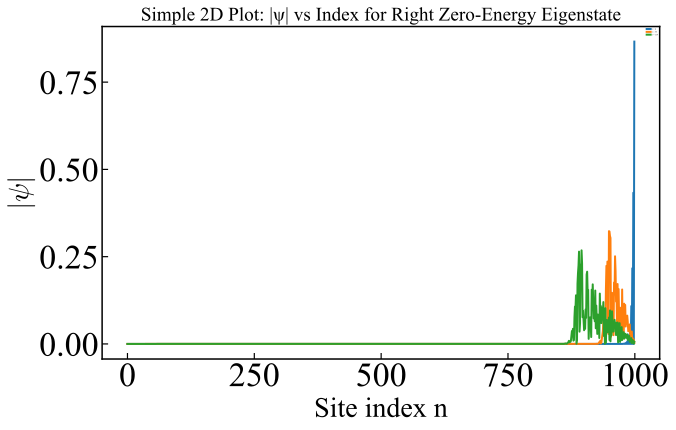

In [ ]:
##Quencging and the semi classical

#fixing the xlimit in left side eigenstate

# SSH Time Evolution

import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit
from scipy.integrate import solve_ivp  # for ODE integration (from 1st code)
from matplotlib.ticker import MaxNLocator

def build_ssh_hamiltonian(N, v, w, sigma):
    """
    Build the SSH Hamiltonian on a 1D lattice of N sites.
    """
    H = np.zeros((N, N), dtype=complex)
    for i in range(N-1):
        # Scale the hopping amplitudes with position
        v_i = v * ((i + 1) / (N-1))**sigma
        w_i = w * ((i + 1) / (N-1))**sigma
        if i % 2 == 0:
            H[i, i+1] = -v_i
            H[i+1, i] = -v_i
        else:
            H[i, i+1] = -w_i
            H[i+1, i] = -w_i
    return H

def tb_model(N, sigma):
    """
    Build a tight-binding model Hamiltonian for comparison.
    """
    J = 1
    H_tb = np.zeros((N, N), dtype=complex)
    for i in range(N - 1):
        J_i = J * ((i + 1) / (N - 1))**sigma
        H_tb[i, i + 1] = -J_i
        H_tb[i + 1, i] = -J_i
    return H_tb

def kitaev_chain(N, mu, t, delta, sigma):
    """
    Construct the Kitaev chain Hamiltonian.
    """
    A = np.zeros((N, N), dtype=complex)
    B = np.zeros((N, N), dtype=complex)

    for i in range(N):
        A[i, i] = -mu  # on-site energy
        if i < N - 1:
            t_i = -t * ((i + 1) / (N - 1))**sigma
            A[i, i+1] = -t_i
            A[i+1, i] = -t_i
            B[i, i+1] = delta
            B[i+1, i] = -delta

    H_kc = np.block([
        [A,         B],
        [B.conj().T, -A.conj().T]
    ])
    return H_kc

def boosted_dirac_delta(N, n0, p0):
    """
    Create a boosted Dirac delta state.
    """
    psi = np.zeros(N, dtype=complex)
    n0_int = int(n0)
    psi[n0_int] = np.exp(1j * p0 * n0_int)
    return psi

def gaussian_wave_packet(N, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(N)
    psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

###############################################################################
# Inset Plot Data from 1st Code: ODE integration for the 2D plot
###############################################################################
v_mod     = 0.5      
w_mod     = 1       
sigma_mod = 0      
x0        = 0.0001 
epsilon   = 1e-8      
p0_mod    = 0.1*np.pi/2 + 0*epsilon 
t_span    = (0, 0.2)
max_step  = 0.001  

def t1_mod(x):
    return v_mod * (x**sigma_mod)
def t2_mod(x):
    return w_mod * (x**sigma_mod)
def dt1_dx_mod(x):
    return v_mod * sigma_mod * (x**(sigma_mod - 1.0))
def dt2_dx_mod(x):
    return w_mod * sigma_mod * (x**(sigma_mod - 1.0))

def modified_ssh_odes(t, y):
    x, p = y
    t1_val = t1_mod(x)
    t2_val = t2_mod(x)
    dt1_val = dt1_dx_mod(x)
    dt2_val = dt2_dx_mod(x)
    epsilon_local = 1e-20
    denom = np.sqrt(t1_val**2 + t2_val**2 + 2*t1_val*t2_val*np.cos(2*p))
    dxdt = 2*(t1_val*t2_val*np.sin(2*p)) / denom
    ddx = (t1_val*dt1_val + t2_val*dt2_val + np.cos(2*p)*(dt1_val*t2_val + t1_val*dt2_val)) / denom
    dpdt = ddx
    return [dxdt, dpdt]

y0 = [x0, p0_mod]
sol = solve_ivp(modified_ssh_odes, t_span, y0, dense_output=True, max_step=max_step)
t_vals = sol.t       # Original time values from ODE solver
x_vals = sol.y[0]
t_vals_mod = t_vals  # Modified time values (divided by 2)

def run_time_evolution(N, v, w, sigma, mu, t, delta, n0, p0, omega, dt, T, plot_times):
    """
    Evolve the two zero-energy eigenstates under a target SSH Hamiltonian.
    
    The zero-energy eigenstates are extracted from the SSH Hamiltonian built with
    (N, v, w, σ) = (1000, 0.5, 1, 1) and then evolved in time under the SSH Hamiltonian built with
    (N, v, w, σ) = (1000, 1, 0.5, 1).
    """
    # 1) Build the two Hamiltonians:
    # H_extract for eigenstate extraction (using v=0.5, w=1)
    H_extract = build_ssh_hamiltonian(N, 0.5, 1, sigma)
    # H_evolve for time evolution (using v=1, w=0.5)
    H_evolve = build_ssh_hamiltonian(N, 1, 0.5, sigma)
    
    # Other Hamiltonians (for comparison, if needed)
    H_tb = tb_model(N, sigma)
    H_kitaev = kitaev_chain(N, mu, t, delta, sigma)
    
    # 2) Build the time evolution operator U = exp(-i H_evolve dt)
    U = expm(-1j * H_evolve * dt)
    
    # 3) Extract the two zero-energy eigenstates from H_extract.
    eigvals, eigvecs = np.linalg.eigh(H_extract)
    tol = 1e-6
    zero_indices = np.where(np.abs(eigvals) < tol)[0]
    if len(zero_indices) < 2:
        raise ValueError("Expected at least two zero-energy eigenstates, but found less.")
    
    # Get the two candidate eigenstates.
    psi_candidate1 = eigvecs[:, zero_indices[0]]
    psi_candidate2 = eigvecs[:, zero_indices[1]]
    
    # Determine which eigenstate is localized on the left and which on the right.
    positions = np.arange(N)
    peak1 = np.argmax(np.abs(psi_candidate1))
    peak2 = np.argmax(np.abs(psi_candidate2))
    
    if peak1 < peak2:
        psi_left = psi_candidate1  # Localized on the left edge (near index 0)
        psi_right = psi_candidate2  # Localized on the right edge (near index N-1)
    else:
        psi_left = psi_candidate2
        psi_right = psi_candidate1
    
    # 4) Determine the number of time steps and record the initial states.
    t_steps = int(np.round(T / dt))
    psi_left_t = [np.abs(psi_left.copy())]
    psi_right_t = [np.abs(psi_right.copy())]
    
    # 5) Evolve both eigenstates in time using H_evolve.
    for step in range(t_steps):
        psi_left = U @ psi_left
        psi_right = U @ psi_right
        psi_left_t.append(np.abs(psi_left))
        psi_right_t.append(np.abs(psi_right))
    
    # 6) Create 3D plots of the full evolution snapshots for each eigenstate separately.
    times_to_plot = np.linspace(0, t_steps, plot_times, dtype=int)
    positions = np.arange(N)
    
    # 3D plot for the left edge eigenstate.
    fig1 = plt.figure(figsize=(15, 9))
    ax1 = fig1.add_subplot(111, projection='3d')
    # Filter the data so that only site indices from 0 to 10 are plotted.
    mask = positions <= 10
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        filtered_positions = positions[mask]
        y_vals = np.full(filtered_positions.shape, time_val)
        filtered_z_vals = psi_left_t[t_idx][mask]
        ax1.plot(filtered_positions, y_vals, filtered_z_vals, label=f"t = {time_val:.1f}")
    ax1.set_xlabel("Site index n", fontsize=28, labelpad=18)
    ax1.set_ylabel(r"Time $\tau$", fontsize=28, labelpad=18)
    ax1.set_zlabel(r"$|\psi(n,\tau)|$", fontsize=28, labelpad=18)
    #ax1.set_title("3D Time Evolution of Left Zero-Energy Eigenstate (Left Edge)")
    # Set the site index range (x-axis) from 0 to 10
    ax1.set_xlim(0, 10)
    ax1.view_init(elev=40, azim=-40)
    
    # Add inset of the 1st code's 2D plot in the top right corner (Left Edge Plot)
    inset_ax1 = fig1.add_axes([0.7, 0.7, 0.25, 0.25])
    inset_ax1.plot(x_vals, t_vals_mod, 'm-') #label="Semiclassical")
    inset_ax1.set_xlabel("Position $(x/2N)$", fontsize=28)
    inset_ax1.set_ylabel(r"Time $(\tau/2N)$", fontsize=28)
    inset_ax1.tick_params(axis='both', which='major', labelsize=28)
    inset_ax1.xaxis.set_major_locator(MaxNLocator(nbins=2))
    #inset_ax1.legend(fontsize=8)
    
    plt.show()
    
    # 3D plot for the right edge eigenstate.
    fig2 = plt.figure(figsize=(15, 9))
    ax2 = fig2.add_subplot(111, projection='3d')
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_right_t[t_idx]
        ax2.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    ax2.set_xlabel("Site index n", fontsize=28, labelpad=18)
    ax2.set_ylabel(r"Time $\tau$", fontsize=28, labelpad=18)
    ax2.set_zlabel(r"$|\psi(n,\tau)|$", fontsize=28, labelpad=18)
    #inset_ax2.legend(fontsize=8)
    ax2.view_init(elev=40, azim=-40)
    #ax2.set_title("3D Time Evolution of Right Zero-Energy Eigenstate (Right Edge)")
    
    # Add inset of the 1st code's 2D plot in the top right corner (Right Edge Plot)
    inset_ax2 = fig2.add_axes([0.7, 0.7, 0.25, 0.25])
    inset_ax2.plot(x_vals, t_vals_mod, 'm-') #label="Semiclassical ODEs")
    inset_ax2.set_xlabel("Position $(x/2N)$", fontsize=28)
    inset_ax2.set_ylabel(r"Time $(\tau/2N)$", fontsize=28)
    inset_ax1.tick_params(axis='both', which='major', labelsize=28)
    
    plt.show()
    
    #####################################################################################################
    # 7) For the left eigenstate: Compute the peak positions and rescaled values for the 2D plot.
    peak_positions_left = []
    rescaled_times_left = []
    rescaled_positions_left = []
    for step, psi_abs in enumerate(psi_left_t):
        peak_index = np.argmax(psi_abs)  # peak position at this time step
        peak_positions_left.append(peak_index)
        t_val = step * dt
        rescaled_times_left.append(t_val / N)         # t̃ = t/N
        rescaled_positions_left.append(peak_index / N)  # x̃ = x/N

    turning_index_left = np.argmin(rescaled_positions_left)
    turning_time_left = rescaled_times_left[turning_index_left]
    turning_pos_left = rescaled_positions_left[turning_index_left]

    # 8) Create a 2D plot of rescaled peak position vs. rescaled time for the left eigenstate.
    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions_left, rescaled_times_left, 'o-', color='blue', markersize=1, label="Peak trajectory")
    plt.plot(turning_pos_left, turning_time_left, 'r*', markersize=12, label="Turning point")
    plt.xlabel(r"Rescaled peak position $\tilde{x} = x/N$")
    plt.ylabel(r"Rescaled time $\tilde{t} = t/N$")
    plt.title("2D Plot of Rescaled Time vs. Peak Position for Left Zero-Energy Eigenstate")
    plt.legend()
    plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos_left:.4f}, $t$={turning_time_left:.3f})", 
                 xy=(turning_pos_left, turning_time_left), 
                 xytext=(turning_pos_left+0.05, turning_time_left+0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.show()
    
    # 7 & 8) For the right eigenstate: Compute the peak positions and plot the 2D graph.
    peak_positions_right = []
    rescaled_times_right = []
    rescaled_positions_right = []
    for step, psi_abs in enumerate(psi_right_t):
        peak_index = np.argmax(psi_abs)
        peak_positions_right.append(peak_index)
        t_val = step * dt
        rescaled_times_right.append(t_val / N)
        rescaled_positions_right.append(peak_index / N)

    turning_index_right = np.argmin(rescaled_positions_right)
    turning_time_right = rescaled_times_right[turning_index_right]
    turning_pos_right = rescaled_positions_right[turning_index_right]

    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions_right, rescaled_times_right, 'o-', color='green', markersize=1, label="Peak trajectory")
    plt.plot(turning_pos_right, turning_time_right, 'r*', markersize=12, label="Turning point")
    plt.xlabel(r"Rescaled peak position $\tilde{x} = x/N$")
    plt.ylabel(r"Rescaled time $\tilde{t} = t/N$")
    plt.title("2D Plot of Rescaled Time vs. Peak Position for Right Zero-Energy Eigenstate")
    plt.legend()
    plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos_right:.4f}, $t$={turning_time_right:.3f})", 
                 xy=(turning_pos_right, turning_time_right), 
                 xytext=(turning_pos_right+0.05, turning_time_right+0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.show()
    
    #####################################################################################################
    # 9) Create simpler 2D plots of |ψ| vs. site index for selected time steps.
    #    Selected time indices.
    selected_indices = [0, 55, 114] #time for maxima or minima
    
    # For the left eigenstate.
    plt.figure(figsize=(10,6))
    for idx in selected_indices:
        plt.plot(np.arange(N), psi_left_t[idx], label=f't = {idx}')
    plt.xlabel("Site index n",fontsize=20)
    plt.ylabel(r"$|\psi|$",fontsize=20)
    plt.title("Simple 2D Plot: |ψ| vs Index for Left Zero-Energy Eigenstate")
    plt.xlim(0, 10) 
    plt.legend(fontsize=20)
    plt.show()
    
    # For the right eigenstate.
    plt.figure(figsize=(10,6))
    for idx in selected_indices:
        plt.plot(np.arange(N), psi_right_t[idx], label=f't = {idx}')
    plt.xlabel("Site index n",fontsize=28)
    plt.ylabel(r"$|\psi|$",fontsize=28)
    plt.title("Simple 2D Plot: |ψ| vs Index for Right Zero-Energy Eigenstate")
    plt.legend(fontsize=2)
    plt.show()

if __name__ == "__main__":
    run_time_evolution(
        N=1000,         # Number of lattice sites
        v=1,            # Dummy parameter (not used for extraction/evolution)
        w=0.5,          # Dummy parameter (not used for extraction/evolution)
        sigma=0,
        mu=0,
        t=1.6,
        delta=12,
        omega=25,       # Unused now (Gaussian parameter, kept for compatibility)
        n0=750,         # Unused now (Gaussian center, kept for compatibility)
        p0=-1.6*np.pi/2,    # Unused now (Gaussian momentum, kept for compatibility)
        dt=1,           # Time step
        T=200,     # Total evolution time
        plot_times=8   # Number of snapshots for 3D plot
    )


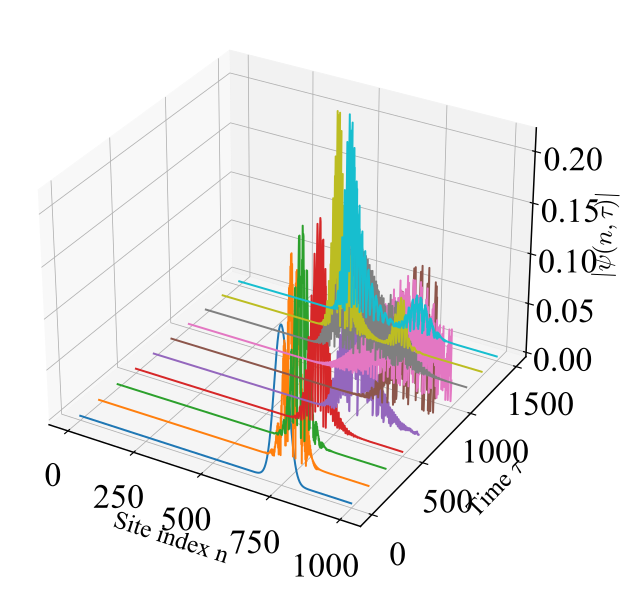

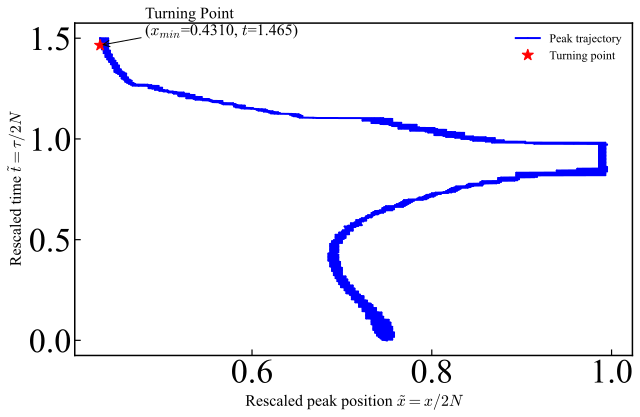

In [89]:
#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def build_ssh_hamiltonian(N, v, w, sigma):
    """
    Build the SSH Hamiltonian on a 1D lattice of N sites.
    """
    H = np.zeros((N, N), dtype=complex)
    for i in range(N-1):
        # Scale the hopping amplitudes with position
        v_i = v * ((i + 1) / (N-1))**sigma
        w_i = w * ((i + 1) / (N-1))**sigma
        if i % 2 == 0:
            H[i, i+1] = -v_i
            H[i+1, i] = -v_i
        else:
            H[i, i+1] = -w_i
            H[i+1, i] = -w_i
    return H

###########################################
# New SSH Hamiltonian with additional hoppings and updated parameters
def SSH(L,c,sigma):
    """
    Construct the SSH Hamiltonian with additional hoppings for a given 
    winding number parameter c and exponent sigma, using updated parameters.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w_val = t - dt    # Note: w = t - dt
        v_val = t + dt    # v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        t = 0.20
        dt = 0.05
        w_val = t - dt
        v_val = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 4:
        w_val = 0.17
        v_val = 0.064
        nu = 0.43
        mu = 0.17
        gamma = 0.37
    elif c == 3:
        t = 0.3
        dt = -0.2
        w_val = t - dt
        v_val = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)
    
    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v_val * ((i + 1) / (L - 1))**sigma
        w_i = w_val * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = -v_i
            SHH[i, i + 1] = -v_i
        else:
            SHH[i + 1, i] = -w_i
            SHH[i, i + 1] = -w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

#############################################


def tb_model(N, sigma):
    """
    Build a tight-binding model Hamiltonian for comparison.
    """
    J = 1
    H_tb = np.zeros((N, N), dtype=complex)
    for i in range(N - 1):
        J_i = J * ((i + 1) / (N - 1))**sigma
        H_tb[i, i + 1] = -J_i
        H_tb[i + 1, i] = -J_i
    return H_tb

def kitaev_chain(N, mu, t, delta, sigma):
    # Construct the N x N matrices A (kinetic part) and B (pairing part)
    A = np.zeros((N, N), dtype=complex)
    B = np.zeros((N, N), dtype=complex)

    for i in range(N):
        A[i, i] = -mu  # on-site energy
        if i < N - 1:
            t_i = -t * ((i + 1) / (N - 1))**sigma
            A[i, i+1] = -t_i
            A[i+1, i] = -t_i
            B[i, i+1] = delta
            B[i+1, i] = -delta

    H_kc = np.block([
        [A,         B],
        [B.conj().T, -A.conj().T]
    ])
    return H_kc

def boosted_dirac_delta(N, n0, p0):
    psi = np.zeros(N, dtype=complex)
    n0_int = int(n0)
    psi[n0_int] = np.exp(1j * p0 * n0_int)
    return psi

def gaussian_wave_packet(N, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(N)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N,L,c, v, w, sigma, mu, t, delta, n0, p0, omega, dt, T, plot_times):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    """
    # 1) Build the Hamiltonians
    H_SSH = build_ssh_hamiltonian(N, v, w, sigma)
    H_extended= SSH(L,c, sigma)
    H_tb = tb_model(N, sigma)
    H_kitaev = kitaev_chain(N, mu, t, delta, sigma)
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_extended* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(N, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the number of time steps and record the initial state
    t_steps = int(np.round(T / dt))
    psi_t = [np.abs(psi.copy())]
    
    # 5) Evolve the wavefunction in time
    for step in range(t_steps):
        psi = U @ psi
        psi_t.append(np.abs(psi))
    
    # 6) (Optional) Original 3D plot of the full evolution snapshots
    times_to_plot = np.linspace(0, t_steps, plot_times, dtype=int)
    positions = np.arange(N)
    
    fig = plt.figure(figsize=(18, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_t[t_idx]
        ax.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    
    ax.set_xlabel("Site index n", fontsize=25, labelpad=25)
    ax.set_ylabel(r"Time $\tau$", fontsize=25, labelpad=25)
    ax.set_zlabel(r"$|\psi(n,\tau)|$", fontsize=25, labelpad=25)

    # Adjust tick parameters to increase spacing (pad) between ticks and tick labels
    ax.tick_params(axis='x', which='major', pad=15)
    ax.tick_params(axis='y', which='major', pad=15)
    ax.tick_params(axis='z', which='major', pad=15)
   # ax.set_title(f"3D Time Evolution of Gaussian Packet\n(SSH Hamiltonian: v={v}, w={w}, σ={sigma}, $p_0$={p0}) \n(formula turning point={n0/1000*((np.cos(p0))**(2)+((w/v-1)/(w/v+1))**(2)-(np.cos(p0))**(2)*((w/v-1)/(w/v+1))**(2))**(1/(2*sigma))})")
    plt.show()
    
   
#####################################################################################################

    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []
    for step, psi_abs in enumerate(psi_t):
        peak_index = np.argmax(psi_abs)  # peak position at this time step
        peak_positions.append(peak_index)
        t_val = step * dt
        rescaled_times.append(t_val / N)         # t̃ = t/N
        rescaled_positions.append(peak_index / N)  # x̃ = x/N

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # 8) Create a 2D plot of rescaled peak position vs. rescaled time.
    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions, rescaled_times, 'o-', color='blue', markersize=1, label="Peak trajectory")
    # Mark the turning point with a red star
    plt.plot(turning_pos, turning_time, 'r*', markersize=12, label="Turning point")
    plt.xlabel(r"Rescaled peak position $\tilde{x} = x/2N$")
    plt.ylabel(r"Rescaled time $\tilde{t} = \tau/2N$")
    #plt.title(f"2D Plot of Rescaled Time vs. Peak Position of Gaussian Wavepacket($p_0$={p0}),\n(formula turning point={n0/N*((np.cos(p0))**(2)+((w/v-1)/(w/v+1))**(2)-(np.cos(p0))**(2)*((w/v-1)/(w/v+1))**(2))**(1/(2*sigma))})")
    plt.legend()
    #plt.grid(True)
    
    # Optionally add an annotation for clarity
    plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos:.4f}, $t$={turning_time:.3f})", 
                 xy=(turning_pos, turning_time), 
                 xytext=(turning_pos+0.05, turning_time+0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    
    plt.show()
###########################################################################################################################################
if __name__ == "__main__":
    run_time_evolution(
        N=1000,
        L=1000,           # Number of lattice sites
        c=4,               #winding number
        v=1,            # Hopping parameter v
        w=1.9,            # Hopping parameter w
        sigma=1,
        mu=0,
        t=1.6,
        delta=12,
        omega=25,       # Gaussian width parameter
        n0=750,         # Localization site for the Gaussian
        p0=-1*np.pi/2,    # Momentum boost
        dt=1,         # Time step
        T=1500,         # Total evolution time
        plot_times=10   # Number of snapshots for 3D plot
    )

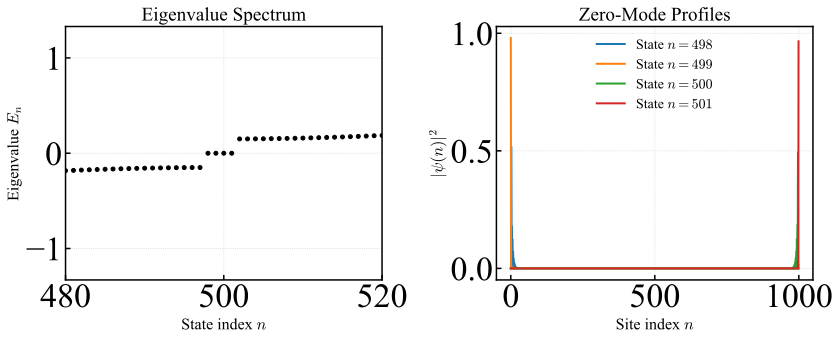

In [39]:
#WINNDING NUMBER TRANSITION

import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------
# 1) Phys. Rev. B style settings
# --------------------------------------------------
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 16,
    'axes.linewidth': 1.5,
    'xtick.direction': 'in',  'ytick.direction': 'in',
    'xtick.major.size': 5,    'ytick.major.size': 5,
    'xtick.minor.size': 3,    'ytick.minor.size': 3,
    'xtick.major.width': 1.5, 'ytick.major.width': 1.5,
    'xtick.minor.width': 1.0, 'ytick.minor.width': 1.0,
    'figure.figsize': (12, 5),
    'legend.frameon': False,
})

# --------------------------------------------------
# 2) SSH Hamiltonian (as given)
# --------------------------------------------------
def SSH(L, c, sigma):
    if c == 2:
        v, w, nu, mu, gamma = 0, 0.17, 0.43, 0.17, 0.37
    elif c == 4:
        v, w, nu, mu, gamma = 0.2, 0.17, 0.43, 0.17, 0.37
    elif c == 3:
        v, w, nu, mu, gamma = 0.1, 0.5, 0.35, 0.6, 0.0
    elif c == 1:
        v, w, nu, mu, gamma = 0.5, 1, 0.0, 0.0, 0.0
    else:  # c == 0
        v,w, nu, mu, gamma = 1, 0.5, 0.0, 0.0, 0.0

    w_val = w
    v_val = v

    H = np.zeros((L, L), dtype=complex)
    # NN hoppings
    for i in range(L-1):
        v_i = v_val * ((i+1)/(L-1))**sigma
        w_i = w_val * ((i+1)/(L-1))**sigma
        hop = -v_i if i%2==0 else -w_i
        H[i, i+1] = H[i+1, i] = hop

    # further‐neighbor hoppings (ν, μ, γ)
    for dist, amp in [(3, nu), (5, mu), (7, gamma)]:
        for i in range(L-dist):
            if i%2 != 0:
                val = amp * ((i+1)/(L-1))**sigma
                H[i, i+dist] = H[i+dist, i] = val

    return H

# --------------------------------------------------
# 3) Build & diagonalize
# --------------------------------------------------
L, c, sigma = 1000, 3, 0
H = SSH(L, c, sigma)
eigs, vecs = np.linalg.eigh(H)

# --------------------------------------------------
# 4) Identify zero modes (|E| < tol)
# --------------------------------------------------
tol = 1e-6
zero_idxs = np.where(np.abs(eigs) < tol)[0]

# --------------------------------------------------
# 5) Plotting
# --------------------------------------------------
fig, (ax1, ax2) = plt.subplots(1, 2)

# 5a) Eigenvalue spectrum
ax1.plot(np.arange(L), eigs, 'ok', markersize=4)
ax1.set_xlabel('State index $n$')
ax1.set_ylabel('Eigenvalue $E_n$')
ax1.set_title('Eigenvalue Spectrum')
ax1.grid(True, linestyle=':', linewidth=0.8, alpha=0.6)
ax1.set_xlim(L//2-20, L//2+20) 

# 5b) Zero‐energy eigenstate profiles
for j, idx in enumerate(zero_idxs):
    psi = vecs[:, idx]
    ax2.plot(
        np.arange(L),
        np.abs(psi)**2,
        linewidth=2,
        label=f'State $n={idx}$'
    )
ax2.set_xlabel('Site index $n$')
ax2.set_ylabel(r'$|\psi(n)|^2$')
ax2.set_title('Zero‐Mode Profiles')
ax2.legend(fontsize=14, loc='best')
ax2.grid(True, linestyle=':', linewidth=0.8, alpha=0.6)

fig.tight_layout()
plt.show()


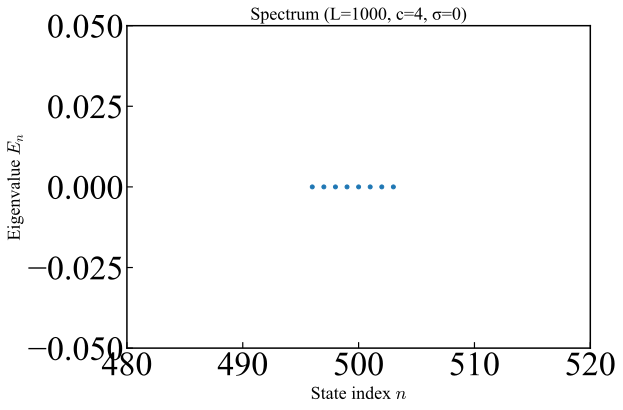

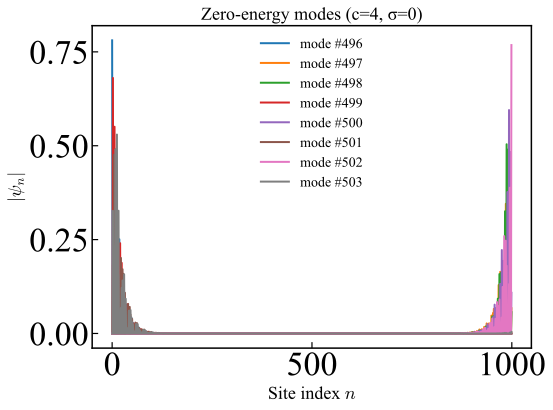

C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\473711167.py:175: ComplexWarning: Casting complex values to real discards the imaginary part
  v[i]  = v1[2*i,2*i]+v1[2*i+1,2*i+1]+v2[2*i,2*i]+v2[2*i+1,2*i+1]


(1.5, 4.5)

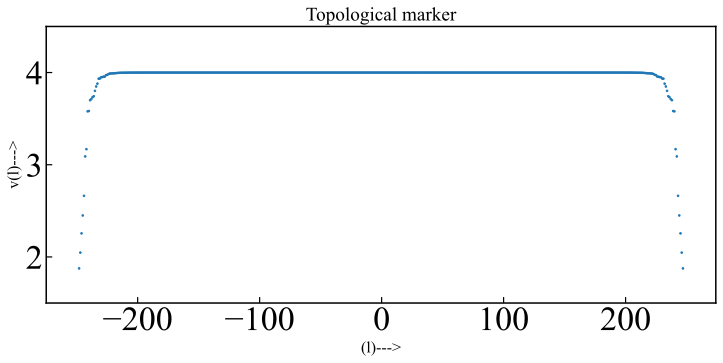

In [91]:
import numpy as np
import matplotlib.pyplot as plt

# ──────────────────────────────────────────────────────────────────────────────
# Your SSH Hamiltonian factory (exactly as you gave it)
def SSH(L,c, sigma):
    """
    Construct the Hamiltonian for the SSH model with additional hoppings,
    for a given winding number parameter c and exponent sigma.
    """
    if c == 2:
        w = 0.17
        v = 0
        nu = 0.43
        mu = 0.17
        gamma = 0.37
    elif c == 4:
        w = 0.15
        v = 0.25
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 3:
        t = 0.3
        dt = -0.2
        w = t - dt
        v = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)

    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v * ((i + 1) / (L - 1))**sigma
        w_i = w * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = v_i
            SHH[i, i + 1] = v_i
        else:
            SHH[i + 1, i] = w_i
            SHH[i, i + 1] = w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

# ──────────────────────────────────────────────────────────────────────────────
# # Publication‑quality styling (Phys. Rev. B)
# plt.rcParams['font.family']        = 'Times New Roman'
# plt.rcParams['font.size']          = 16
# plt.rcParams['axes.linewidth']     = 1.5
# plt.rcParams['xtick.major.width']  = 1.2
# plt.rcParams['ytick.major.width']  = 1.2
# plt.rcParams['xtick.major.size']   = 6
# plt.rcParams['ytick.major.size']   = 6

# ──────────────────────────────────────────────────────────────────────────────
# Parameters & Diagonalization
L, c, sigma = 1000, 4, 0   # you can change c∈{0,1,2,3,4} and sigma
H = SSH(L, c, sigma)
vals, vecs = np.linalg.eigh(H)  # Hermitian diag

# ──────────────────────────────────────────────────────────────────────────────
# 1) Plot full eigenspectrum
fig1 = plt.figure(figsize=(8,6))
plt.plot(np.arange(L), vals, 'o', markersize=4)
plt.xlabel('State index $n$',   fontsize=18)
plt.ylabel('Eigenvalue $E_n$',  fontsize=18)
plt.title(f'Spectrum (L={L}, c={c}, σ={sigma})', fontsize=18)
plt.tight_layout()
plt.xlim(L//2-20,L//2+20)
plt.ylim(-.05,.05)
plt.show()

# ──────────────────────────────────────────────────────────────────────────────
# 2) Plot zero‑energy eigenstates
tol = 1e-6
zero_inds = np.where(np.abs(vals) < tol)[0]

fig2 = plt.figure(figsize=(8,6))
for idx in zero_inds:
    psi = vecs[:, idx]
    plt.plot(np.arange(L), np.abs(psi), 
             label=f'mode #{idx}', linewidth=2)

plt.xlabel('Site index $n$',        fontsize=18)
plt.ylabel(r'$|\psi_n|$',           fontsize=18)
plt.title(f'Zero‑energy modes (c={c}, σ={sigma})', fontsize=18)
plt.legend(fontsize=14, loc='best', frameon=False)
plt.tight_layout()
plt.show()

# Number of eigenvectors
num_eigenvectors = len(vals)

# Number of eigenvectors to include in each matrix (half in each case)
num_eigenvectors_half = num_eigenvectors // 2

# matrix from the first half of the eigenvectors
Um= np.column_stack(vecs[:, :num_eigenvectors_half])

# matrix from the remaining half of the eigenvectors
Up= np.column_stack(vecs[:, num_eigenvectors_half:])

trans_Um = np.transpose(Um)
trans_Up= np.transpose(Up)

Pp= trans_Up@Up
Pm=trans_Um@Um
Q=Pp-Pm
GA=np.zeros((L,L))
GB=np.zeros((L,L))
for i in range(len(eigenvalues)):
    if i % 2 == 0:
      GA[i,i]=1
for i in range(len(eigenvalues)):
    if i % 2 != 0:
      GB[i,i]=1

Qab= GA@Q@GB
Qba= GB@Q@GA
l=np.arange(-abs(L/4), abs(L/4) , 1 )
X= np.zeros((L,L))
X[0,0]=-L/4
for i in range(len(eigenvalues)):
        if i % 2 == 0:
         X[i,i]=-L/4+i/2
         X[i+1,i+1]=X[i,i]
#print(np.shape(GA))
#print(X)

v1=1/2*(Qba@(X@Qab-Qab@X))
v2=1/2*(Qab@(Qba@X-X@Qba))
#print(v1)
#--------------------------------------------
v=np.zeros(int(L/2))
#--------------------------------------- 
for i in range(int(L/2)-1):
    v[i]  = v1[2*i,2*i]+v1[2*i+1,2*i+1]+v2[2*i,2*i]+v2[2*i+1,2*i+1]
#print(v)
plt.figure()
plt.title("Topological marker")
plt.xlabel("(l)--->")
plt.ylabel("v(l)--->")
plt.scatter(l,v,s=3)
plt.ylim(1.5,4.5)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\1424345342.py:149: ComplexWarning: Casting complex values to real discards the imaginary part
  v_topo[i] = (v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +


<Figure size 800x600 with 0 Axes>

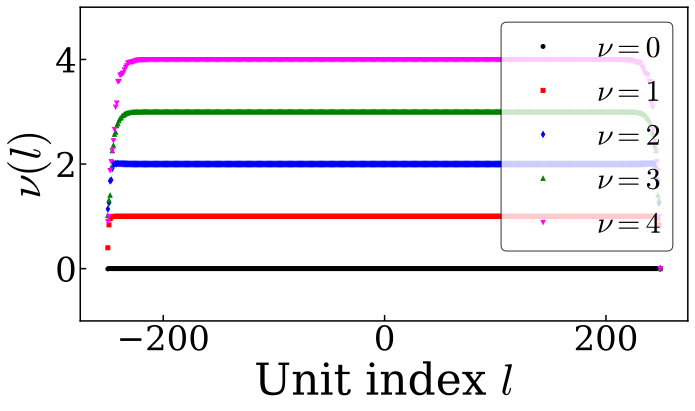

<Figure size 800x600 with 0 Axes>

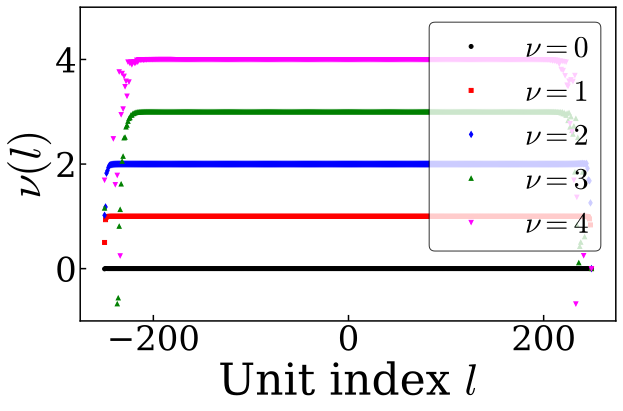

In [24]:
#WINDING NUMBER WITH LTM FOR EXTENDED SSH


# Extended SSH MODEL with topological marker plots for multiple parameters
import numpy as np
import matplotlib.pyplot as plt

# For publication-quality plots (e.g., Physical Review B), you may use a clear font and set figure size/resolution
plt.rcParams.update({
    'font.size': 16,
    'figure.figsize': (8, 6),
    'axes.linewidth': 1.5,
    'mathtext.fontset': 'cm',
    'font.family': 'serif'
})

# Global system size
L = 1000

def SSH(c, sigma):
    """
    Construct the Hamiltonian for the SSH model with additional hoppings,
    for a given winding number parameter c and exponent sigma.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w = t - dt
        v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        # Two possible sets of parameters; here we choose one:
        t = 0.20
        dt = 0.05
        w = t - dt
        v = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 3:
        t = 0.3
        dt = -0.2
        w = t - dt
        v = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)

    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v * ((i + 1) / (L - 1))**sigma
        w_i = w * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = v_i
            SHH[i, i + 1] = v_i
        else:
            SHH[i + 1, i] = w_i
            SHH[i, i + 1] = w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

def compute_topological_marker(c, sigma):
    """
    Compute the topological marker v(l) for the SSH model given parameters c and sigma.
    """
    # Build Hamiltonian and diagonalize it
    H = SSH(c, sigma)
    eigenvalues, eigenvectors = np.linalg.eigh(H)
    num_eigenvectors = len(eigenvalues)
    num_eigenvectors_half = num_eigenvectors // 2

    # Construct matrices with eigenvectors (projecting into two halves)
    Um = np.column_stack(eigenvectors[:, :num_eigenvectors_half])
    Up = np.column_stack(eigenvectors[:, num_eigenvectors_half:])

    # Compute projectors
    Pp = np.dot(Up.T, Up)
    Pm = np.dot(Um.T, Um)
    Q = Pp - Pm

    # Define GA and GB as diagonal matrices with ones on even and odd indices respectively
    GA = np.zeros((L, L))
    GB = np.zeros((L, L))
    for i in range(L):
        if i % 2 == 0:
            GA[i, i] = 1
        else:
            GB[i, i] = 1

    # Off-diagonal blocks of Q
    Qab = GA @ Q @ GB
    Qba = GB @ Q @ GA

    # Define the position-like operator X
    X = np.zeros((L, L))
    X[0, 0] = -L / 4
    for i in range(0, L - 1, 2):
        X[i, i] = -L / 4 + i / 2
        if i + 1 < L:
            X[i + 1, i + 1] = X[i, i]

    # Compute operators v1 and v2
    v1 = 0.5 * (Qba @ (X @ Qab - Qab @ X))
    v2 = 0.5 * (Qab @ (Qba @ X - X @ Qba))

    # Evaluate the topological marker v(l)
    v_topo = np.zeros(L // 2)
    for i in range(L // 2 - 1):
        v_topo[i] = (v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +
                     v2[2*i, 2*i] + v2[2*i+1, 2*i+1])
    return v_topo

# Define the parameters for which to compute the marker
sigma_vals = [0, 1]   # Two sigma values: 0 and 1
c_vals = [0, 1, 2, 3, 4]  # Five c values

# Define a dictionary for distinct plotting styles for each c value.
plot_styles = {
    0: {'linestyle': '',  'marker': 'o', 'color': 'black',   'label': fr'$\nu=0$'},
    1: {'linestyle': '', 'marker': 's', 'color': 'red',     'label': fr'$\nu=1$'},
    2: {'linestyle': '', 'marker': 'd', 'color': 'blue',    'label': fr'$\nu=2$'},
    3: {'linestyle': '',  'marker': '^', 'color': 'green',   'label': fr'$\nu=3$'},
    4: {'linestyle': '',  'marker': 'v', 'color': 'magenta', 'label': fr'$\nu=4$'},
}

# Loop over the sigma values and plot the topological marker for each c value on one figure per sigma.
for sigma in sigma_vals:
    plt.figure()
    plt.figure(figsize=(10, 6))
    for c in c_vals:
        v_topo = compute_topological_marker(c, sigma)
        x_axis = np.arange(len(v_topo))
        style = plot_styles[c]
        plt.plot(l, v_topo, linestyle=style['linestyle'],
                 marker=style['marker'], markersize=4,
                 color=style['color'], label=style['label'], linewidth=1.0)
    plt.xlabel(fr"Unit index $l$", fontsize=44)
    plt.ylabel(fr"$\nu(l)$", fontsize=44)
    #plt.title(r"Topological Marker for $\sigma = %d$" % sigma)
    plt.legend(loc='upper right', fontsize=30)
    plt.tight_layout()
    plt.ylim(-1,5)
    plt.show()



Sigma = 0
  c = 0: Average = 0.0002, Variance = 0.0026
  c = 1: Average = 0.9973, Variance = 0.0159
  c = 2: Average = 1.9970, Variance = 0.2687
  c = 3: Average = 2.9980, Variance = 0.1541
  c = 4: Average = 4.0101, Variance = 0.4500


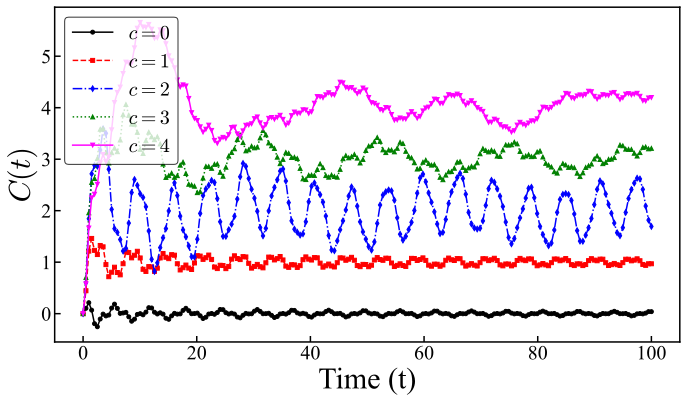


Sigma = 1
  c = 0: Average = 0.0058, Variance = 0.0332
  c = 1: Average = 1.0027, Variance = 0.0468
  c = 2: Average = 1.9652, Variance = 0.5014
  c = 3: Average = 2.9903, Variance = 0.3332
  c = 4: Average = 4.0045, Variance = 0.9715


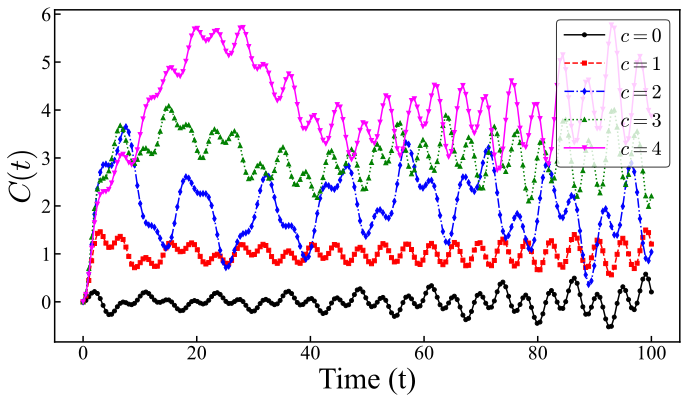

In [ ]:
#Extended SSH MCD Marker

import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import expm

# Set publication-quality parameters
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

# Global system size (you can adjust this as needed)
L = 1000

# ----------------------------------------------------------------------
# New SSH Hamiltonian with additional hoppings and updated parameters
def SSH(c, sigma):
    """
    Construct the SSH Hamiltonian with additional hoppings for a given 
    winding number parameter c and exponent sigma, using updated parameters.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w_val = t - dt    # Note: w = t - dt
        v_val = t + dt    # v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        t = 0.20
        dt = 0.05
        w_val = t - dt
        v_val = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 3:
        t = 0.3
        dt = -0.2
        w_val = t - dt
        v_val = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)
    
    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v_val * ((i + 1) / (L - 1))**sigma
        w_i = w_val * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = v_i
            SHH[i, i + 1] = v_i
        else:
            SHH[i + 1, i] = w_i
            SHH[i, i + 1] = w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

# ----------------------------------------------------------------------
# Function to compute the Mean Chiral Displacement (MCD) marker
def compute_MCD_marker(c, sigma, L):
    """
    Compute the Mean Chiral Displacement (MCD) marker for the SSH model 
    with additional hoppings using the Hamiltonian from SSH(c, sigma).
    
    Returns:
      time_range: 1D numpy array of time values.
      f_values: 1D array with the computed f(t) at each time.
      average: Average value of f(t) over the time range.
      fluctuation: Variance of f(t) over the time range.
    """
    # Build the Hamiltonian for given c and sigma
    H = SSH(c, sigma)
    
    # Construct the position operator X.
    # We follow the method where we set the (0,0) element and then, for every pair of sites,
    # assign X[i,i] = -L/4 + i/2.
    X = np.zeros((L, L))
    X[0, 0] = -L / 4
    for i in range(0, L - 1, 2):
        X[i, i] = -L / 4 + i / 2
        if i + 1 < L:
            X[i + 1, i + 1] = -L / 4 + i / 2

    # Construct the chiral operator G = GA - GB based on the site indices.
    GA = np.zeros((L, L))
    GB = np.zeros((L, L))
    for i in range(L):
        if i % 2 == 0:
            GA[i, i] = 1
        else:
            GB[i, i] = 1
    G = GA - GB
    mid_matrix = G @ X

    # Set the initial state as a delta localized at the center
    psi = np.zeros(L, dtype=complex)
    psi[L // 2] = 1

    # Define time evolution: |psi(t)> = exp(-i H t)|psi>
    time_range = np.linspace(0, 100, 200)
    f_values = []
    for t in time_range:
        U = expm(-1j * H * t)
        psi_t = U.dot(psi)
        # MCD: f(t) = 2 * <psi(t)| mid_matrix |psi(t)>
        f_t = 2 * np.real(np.vdot(psi_t, mid_matrix.dot(psi_t)))
        f_values.append(f_t)
    f_values = np.array(f_values)
    average = np.mean(f_values)
    fluctuation = np.var(f_values)
    return time_range, f_values, average, fluctuation

# ----------------------------------------------------------------------
# Plotting the MCD marker for all c values and for sigma = 0 and sigma = 1.
sigma_vals = [0, 1]
c_vals = [0, 1, 2, 3, 4]

# Define distinct plotting styles for the five c values
plot_styles = {
    0: {'linestyle': '-',  'marker': 'o', 'color': 'black',   'label': r'$c=0$'},
    1: {'linestyle': '--', 'marker': 's', 'color': 'red',     'label': r'$c=1$'},
    2: {'linestyle': '-.', 'marker': 'd', 'color': 'blue',    'label': r'$c=2$'},
    3: {'linestyle': ':',  'marker': '^', 'color': 'green',   'label': r'$c=3$'},
    4: {'linestyle': '-',  'marker': 'v', 'color': 'magenta', 'label': r'$c=4$'},
}

# Loop over the sigma values and plot the MCD curves for each c value
for sigma in sigma_vals:
    plt.figure(figsize=(10, 6))
    print(f"\nSigma = {sigma}")
    for c in c_vals:
        time_range, f_values, avg, var = compute_MCD_marker(c, sigma, L)
        style = plot_styles[c]
        plt.plot(time_range, f_values,
                 linestyle=style['linestyle'],
                 marker=style['marker'],
                 markersize=4,
                 color=style['color'],
                 linewidth=1.5,
                 label=style['label'])
        # Optionally print the average and fluctuation for each c
        print(f"  c = {c}: Average = {avg:.4f}, Variance = {var:.4f}")
    plt.xlabel('Time (t)', fontsize=40)
    plt.ylabel(r'$C(t)$', fontsize=40)
    #plt.title(r'Mean Chiral Displacement for $\sigma = %d$' % sigma, fontsize=20)
    plt.legend(fontsize=30, loc='best')
    plt.tight_layout()
    plt.show()


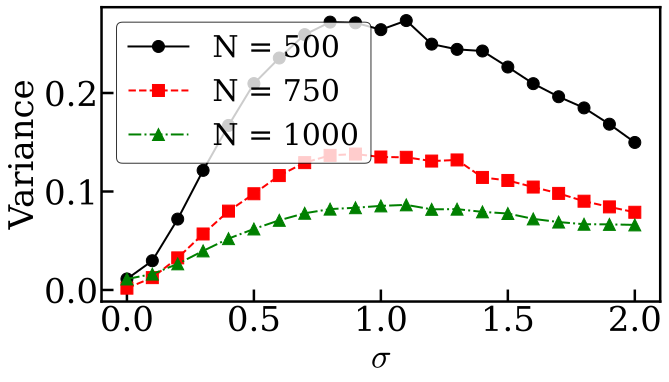

In [68]:
#stored data MCD fluctuation Calculation
import numpy as np
import matplotlib.pyplot as plt

# Sigma values from 0 to 2 with an interval of 0.1
sigma_values = np.arange(0, 2.1, 0.1)

# Variance data for each N value
variance_500 = [0.011180284397897365, 0.02970482686689524, 0.07198653922757406, 0.12143780330554245, 0.167057275016002, 0.2095712945812267, 0.23552966924109664, 0.2592633154715479, 0.2719695279465319, 0.2712569213498527, 0.264289270240683, 0.2735308357841481, 0.24962110090371648, 0.24429499048573086, 0.2426360916054456, 0.2263704974684527, 0.20948623554803208, 0.19621378835719858, 0.18486557072496856, 0.16832643845402287, 0.14978564520443294]
variance_750 = [0.0018523313517400904, 0.012543193188410878, 0.032600117321201626, 0.05686273130422383, 0.08007570477666133, 0.09770446247865212, 0.1161580923617848, 0.12930102546216493, 0.13669187955185674, 0.13800635306684128, 0.13501516300737648, 0.13471086125798162, 0.1308963677154636, 0.13202502449846557, 0.11427124734406656, 0.11119636619228676, 0.10451047604599797, 0.0980551007388868, 0.0901386906887188, 0.0843580606262639, 0.07889587865069422]
variance_1000 = [0.011180284397897455, 0.01612713372433923, 0.026536625747762995, 0.03969702655384952, 0.052155828292086676, 0.06196478219583009, 0.07076312509549464, 0.07789134703543234, 0.0821136877518156, 0.08350864778300243, 0.08538118411687429, 0.08641612575029695, 0.08188303287555021, 0.08208043775188843, 0.07930931669069423, 0.07763927660947817, 0.07219011673288303, 0.06898432700845623, 0.06676903329755197, 0.06660907643693681, 0.06609261233896693]

# Define different line styles and markers for each N value
line_styles = ['-', '--', '-.']
markers = ['o', 's', '^']

# Create the plot with the specified figure size
plt.figure(figsize=(10, 6))

plt.plot(sigma_values, variance_500, linestyle=line_styles[0], marker=markers[0],
         color='black', linewidth=2, label='N = 500')
plt.plot(sigma_values, variance_750, linestyle=line_styles[1], marker=markers[1],
         color='red', linewidth=2, label='N = 750')
plt.plot(sigma_values, variance_1000, linestyle=line_styles[2], marker=markers[2],
         color='green', linewidth=2, label='N = 1000')

# Label formatting following a typical Physical Review B style
plt.xlabel(r'$\sigma$', fontsize=34)
plt.ylabel('Variance', fontsize=34)
plt.legend(fontsize=30, loc='best')
plt.tight_layout()
plt.show()


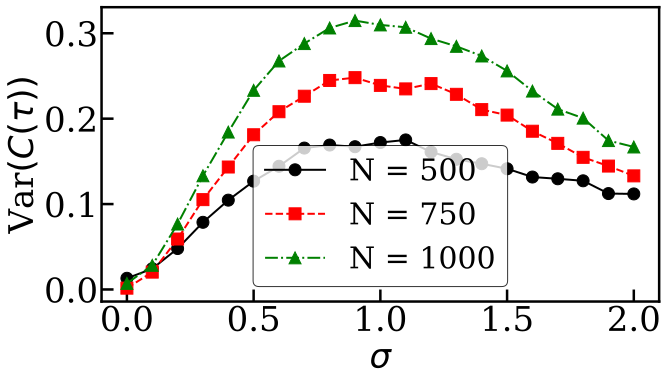

In [20]:
#STORED MCD FLUCTUATION  DATA TIME TILL N/4



#stored data MCD fluctuation Calculation
import numpy as np
import matplotlib.pyplot as plt

# Sigma values from 0 to 2 with an interval of 0.1
sigma_values = np.arange(0, 2.1, 0.1)

# Variance data for each N value
variance_500 = [0.013098802277465314, 0.02432679520890212, 0.04792935784609722, 0.07864537616334025, 0.10458865697370921, 0.1268374332082447, 0.1442724164981608, 0.165557644363737, 0.1691131331966023, 0.16717235627931343, 0.17206031343626743, 0.17511783786696458, 0.1610102726415274, 0.15246226575311198, 0.1472385007369305, 0.14134932066912653, 0.13164930518547713, 0.12961595388099742, 0.1272419242113636, 0.11230843734474286, 0.11188210074730548]
variance_750 = [0.0015464391162312392, 0.02032311419301687, 0.059075912043846615, 0.1052032275404426, 0.1433856230991028, 0.18115891964945496, 0.20813276182063134, 0.2262786698363107, 0.2447348577961118, 0.24802489546070633, 0.23895992255951823, 0.23484622824294304, 0.24106472242855687, 0.22850205896234707, 0.21059087406873186, 0.20417896483516962, 0.1852939237458895, 0.17107717098979916, 0.1547220799394734, 0.14449886507659318, 0.13301407404874838]
variance_1000 = [0.007150430978281637, 0.028302456309043638, 0.07663772790389865, 0.13316398372463698, 0.18430267633446454, 0.2331696514217207, 0.2675684508394271, 0.28794638093055974, 0.30618599575388755, 0.314847258836617, 0.3097520985301401, 0.307018829554062, 0.2937743172173055, 0.28469680863680685, 0.27340133209137224, 0.2559166176151059, 0.23233543028587988, 0.21118930992646404, 0.2006163525094822, 0.1743686221748919, 0.16687753651498316]

# Define different line styles and markers for each N value
line_styles = ['-', '--', '-.']
markers = ['o', 's', '^']

# Create the plot with the specified figure size
plt.figure(figsize=(10, 6))

plt.plot(sigma_values, variance_500, linestyle=line_styles[0], marker=markers[0],
         color='black', linewidth=2, label='N = 500')
plt.plot(sigma_values, variance_750, linestyle=line_styles[1], marker=markers[1],
         color='red', linewidth=2, label='N = 750')
plt.plot(sigma_values, variance_1000, linestyle=line_styles[2], marker=markers[2],
         color='green', linewidth=2, label='N = 1000')

# Label formatting following a typical Physical Review B style
plt.xlabel(r'$\sigma$', fontsize=34)
plt.ylabel(rf'Var$(C(\tau))$', fontsize=34)
plt.legend(fontsize=30, loc='best')
plt.tight_layout()
plt.show()




Sigma = 0
  c = 0: Average = 0.0001, Variance = 0.0019
  c = 1: Average = 0.9983, Variance = 0.0112
  c = 2: Average = 1.9988, Variance = 0.2234
  c = 3: Average = 2.9975, Variance = 0.1090
  c = 4: Average = 3.9824, Variance = 0.3301


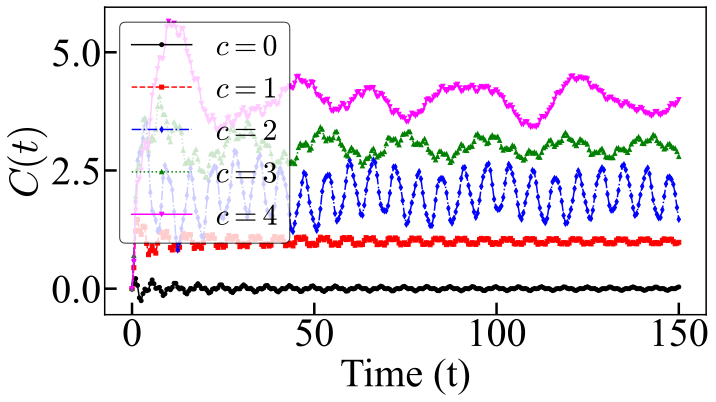


Sigma = 1
  c = 0: Average = 0.0045, Variance = 0.0815
  c = 1: Average = 1.0043, Variance = 0.0854
  c = 2: Average = 2.0209, Variance = 0.5753
  c = 3: Average = 3.0113, Variance = 0.4434
  c = 4: Average = 4.0085, Variance = 1.0546


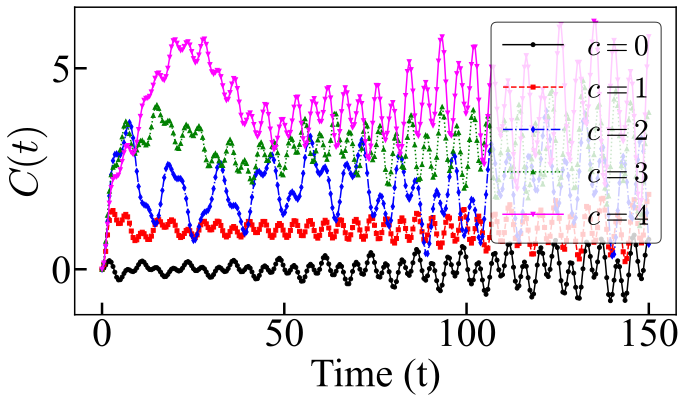


All results cached in `results`:

{0: {0: {'average': 5.6488134993056364e-05,
         'f_values': array([ 0.00000000e+00,  1.03643486e-01,  2.12949532e-01,  6.95327332e-02,
       -1.93135724e-01, -2.54913877e-01, -1.05864290e-01, -8.66155183e-03,
       -4.36601376e-02, -2.86388050e-02,  1.06235103e-01,  1.85324725e-01,
        1.04921275e-01,  6.30912244e-03,  1.24048185e-02,  2.65023053e-02,
       -5.81239882e-02, -1.46045641e-01, -1.09973964e-01, -1.66911898e-02,
        1.13171199e-03, -2.25051058e-02,  2.65922663e-02,  1.14138495e-01,
        1.12849734e-01,  3.14056114e-02, -6.36530034e-03,  1.57298594e-02,
       -5.87058355e-03, -8.52588886e-02, -1.11188247e-01, -4.71962109e-02,
        5.34655625e-03, -7.75576643e-03, -6.38627437e-03,  5.90052910e-02,
        1.04420533e-01,  6.17953461e-02,  8.47669616e-04,  3.93132610e-04,
        1.17848803e-02, -3.60990455e-02, -9.29528217e-02, -7.34112505e-02,
       -1.10366128e-02,  4.78232786e-03, -1.19192209e-02,  1.74444870e-02,


In [23]:
#stored data MCD calculation for extended model

# Extended SSH MCD Marker

import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import expm
import pprint   # for pretty-printing the results dict

# Set publication-quality parameters
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

# Global system size (you can adjust this as needed)
L = 1000

# ----------------------------------------------------------------------
# New SSH Hamiltonian with additional hoppings and updated parameters
def SSH(c, sigma):
    """
    Construct the SSH Hamiltonian with additional hoppings for a given 
    winding number parameter c and exponent sigma, using updated parameters.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w_val = t - dt    # Note: w = t - dt
        v_val = t + dt    # v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        t = 0.20
        dt = 0.05
        w_val = t - dt
        v_val = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 3:
        t = 0.3
        dt = -0.2
        w_val = t - dt
        v_val = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)
    
    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v_val * ((i + 1) / (L - 1))**sigma
        w_i = w_val * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = v_i
            SHH[i, i + 1] = v_i
        else:
            SHH[i + 1, i] = w_i
            SHH[i, i + 1] = w_i

    # Next-nearest and further neighbor hoppings
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

# ----------------------------------------------------------------------
# Function to compute the Mean Chiral Displacement (MCD) marker
def compute_MCD_marker(c, sigma, L):
    """
    Compute the MCD marker for the SSH model with additional hoppings using SSH(c, sigma).
    Returns:
      time_range: 1D numpy array of time values.
      f_values: 1D array with f(t) at each time.
      average: Average of f over time.
      fluctuation: Variance of f over time.
    """
    H = SSH(c, sigma)
    X = np.zeros((L, L))
    X[0,0] = -L/4
    for i in range(0, L - 1, 2):
        X[i, i] = -L / 4 + i / 2
        if i + 1 < L:
            X[i + 1, i + 1] = -L / 4 + i / 2

    GA = np.zeros((L, L))
    GB = np.zeros((L, L))
    for i in range(L):
        if i % 2 == 0:
            GA[i, i] = 1
        else:
            GB[i, i] = 1
    G = GA - GB
    mid_matrix = G @ X

    psi = np.zeros(L, dtype=complex)
    psi[L // 2] = 1
    time_range = np.linspace(0, 150, 300)
    f_values = []
    for t in time_range:
        U = expm(-1j * H * t)
        psi_t = U.dot(psi)
        f_t = 2 * np.real(np.vdot(psi_t, mid_matrix.dot(psi_t)))
        f_values.append(f_t)
    f_values = np.array(f_values)
    average = np.mean(f_values)
    fluctuation = np.var(f_values)
    return time_range, f_values, average, fluctuation

# ----------------------------------------------------------------------
# NEW: prepare a results cache
results = {}

# Plotting the MCD marker for all c values and for sigma = 0 and sigma = 1.
sigma_vals = [0, 1]
c_vals = [0, 1, 2, 3, 4]

# Define distinct plotting styles
plot_styles = {
    0: {'linestyle': '-',  'marker': 'o', 'color': 'black',   'label': r'$c=0$'},
    1: {'linestyle': '--', 'marker': 's', 'color': 'red',     'label': r'$c=1$'},
    2: {'linestyle': '-.', 'marker': 'd', 'color': 'blue',    'label': r'$c=2$'},
    3: {'linestyle': ':',  'marker': '^', 'color': 'green',   'label': r'$c=3$'},
    4: {'linestyle': '-',  'marker': 'v', 'color': 'magenta', 'label': r'$c=4$'},
}

for sigma in sigma_vals:
    results[sigma] = {}
    plt.figure(figsize=(10, 6))
    print(f"\nSigma = {sigma}")
    for c in c_vals:
        # compute and cache
        time_range, f_values, avg, var = compute_MCD_marker(c, sigma, L)
        results[sigma][c] = {
            'time_range': time_range,
            'f_values':   f_values,
            'average':    avg,
            'variance':   var
        }
        # plotting (unchanged)
        style = plot_styles[c]
        plt.plot(time_range, f_values,
                 linestyle=style['linestyle'],
                 marker=style['marker'],
                 markersize=4,
                 color=style['color'],
                 linewidth=1.5,
                 label=style['label'])
        # print stats
        print(f"  c = {c}: Average = {avg:.4f}, Variance = {var:.4f}")
    plt.xlabel('Time (t)', fontsize=40)
    plt.ylabel(r'$C(t)$', fontsize=40)
    plt.legend(fontsize=30, loc='best')
    plt.tight_layout()
    plt.show()

# ----------------------------------------------------------------------
# At the end: pretty-print the entire results dict
print("\nAll results cached in `results`:\n")
pprint.pprint(results)


In [25]:
import pickle
with open('mcd_results.pkl', 'wb') as f:
    pickle.dump(results, f)


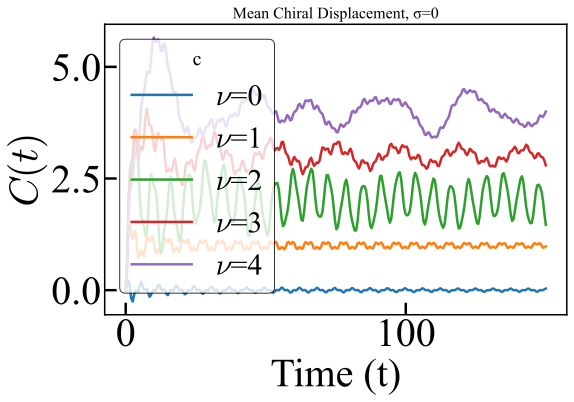

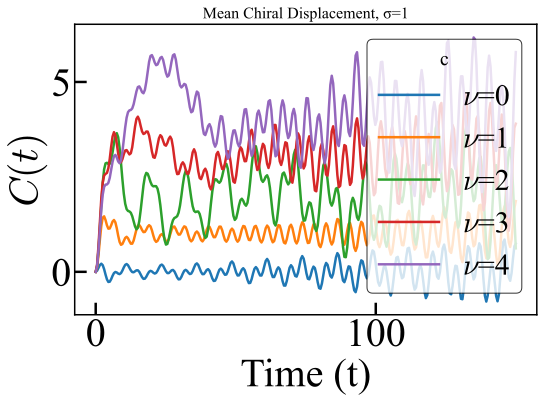

In [27]:
import pickle
import matplotlib.pyplot as plt

# 1) Load your cached data:
with open('mcd_results.pkl', 'rb') as f:
    results = pickle.load(f)

# 2) Loop over sigma and plot each c on the same axes
for sigma, c_data in results.items():
    plt.figure(figsize=(8,6))
    for c, data in sorted(c_data.items()):
        t = data['time_range']
        C = data['f_values']
        plt.plot(t, C, label=fr'$\nu$={c}')
    plt.title(f'Mean Chiral Displacement, σ={sigma}', fontsize=16)
    plt.xlabel('Time (t)', fontsize=40)
    plt.ylabel(r'$C(t)$', fontsize=40)
    plt.legend(title='c', fontsize=30)
    plt.tight_layout()
    plt.show()


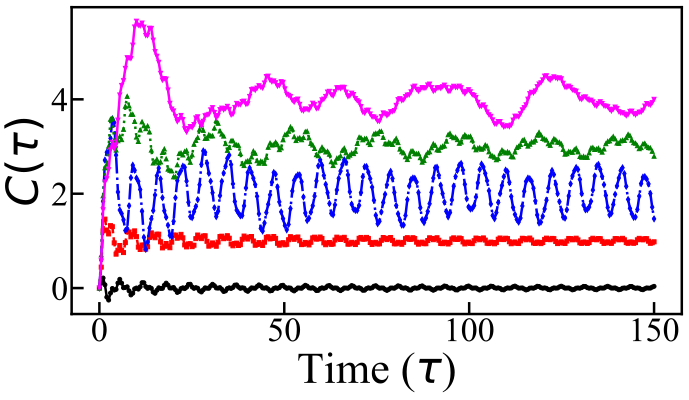

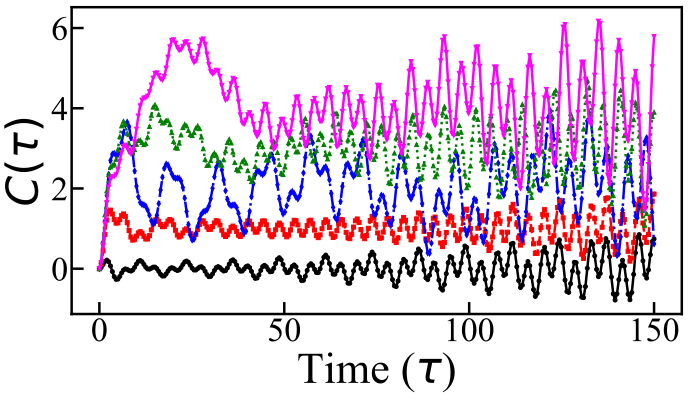

In [21]:
import pickle
import matplotlib.pyplot as plt

# 1) Set publication-quality parameters
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size']   = 20

# 2) Load your cached data (skip if `results` already in memory)
with open('mcd_results.pkl', 'rb') as f:
    results = pickle.load(f)

# 3) Define the same plotting styles you used before
plot_styles = {
    0: {'linestyle': '-',  'marker': 'o', 'color': 'black',   'label': r'$c=0$'},
    1: {'linestyle': '--', 'marker': 's', 'color': 'red',     'label': r'$c=1$'},
    2: {'linestyle': '-.', 'marker': 'd', 'color': 'blue',    'label': r'$c=2$'},
    3: {'linestyle': ':',  'marker': '^', 'color': 'green',   'label': r'$c=3$'},
    4: {'linestyle': '-',  'marker': 'v', 'color': 'magenta', 'label': r'$c=4$'},
}

# 4) Loop over sigma and plot
for sigma in sorted(results.keys()):
    plt.figure(figsize=(10, 6))
    for c in sorted(results[sigma].keys()):
        data = results[sigma][c]
        plt.plot(
            data['time_range'], data['f_values'],
            linestyle = plot_styles[c]['linestyle'],
            marker    = plot_styles[c]['marker'],
            markersize= 4,
            color     = plot_styles[c]['color'],
            linewidth = 2.5,
            label     = plot_styles[c]['label']
        )
    plt.xlabel(r'Time ($\tau$)', fontsize=44)
    plt.ylabel(r'$C(\tau)$', fontsize=44)
    #plt.legend(fontsize=30, loc='best')
    plt.tight_layout()
    plt.show()


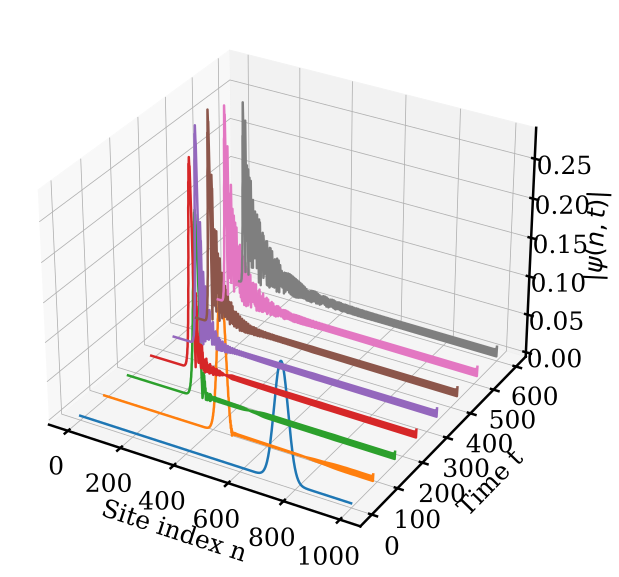

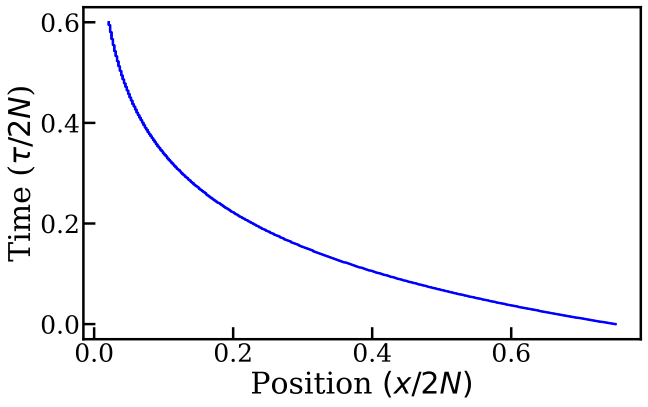

In [ ]:
#EXTENDED SSH DQPT

#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit



######################################################################################

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1

def build_extended_ssh(N, t_a, t_b, t_c, t_d, sigma,
                       periodic=False, dtype=np.complex128):
    dim = 2 * N
    H = np.zeros((dim, dim), dtype=dtype)
    for n in range(N):
        # intracell
        ta_i = t_a * ((n + 1) / (dim - 1)) ** sigma
        H[idx_A(n), idx_B(n)] = ta_i
        H[idx_B(n), idx_A(n)] = np.conj(ta_i)
        # A_n – B_{n-1}
        if n > 0 or periodic:
            m = (n - 1) % N
            tb_i = t_b * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tb_i
            H[idx_B(m), idx_A(n)] = np.conj(tb_i)
        # A_n – B_{n+1}
        if n < N - 1 or periodic:
            m = (n + 1) % N
            tc_i = t_c * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tc_i
            H[idx_B(m), idx_A(n)] = np.conj(tc_i)
        # A_n – B_{n-2}
        if n > 1 or periodic:
            m = (n - 2) % N
            td_i = t_d * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = td_i
            H[idx_B(m), idx_A(n)] = np.conj(td_i)
    return H


######################################################################################
def build_ssh_hamiltonian(N, v, w, sigma):
    """
    Build the SSH Hamiltonian on a 1D lattice of N sites.
    """
    H = np.zeros((N, N), dtype=complex)
    for i in range(N-1):
        # Scale the hopping amplitudes with position
        v_i = v * ((i + 1) / (N-1))**sigma
        w_i = w * ((i + 1) / (N-1))**sigma
        if i % 2 == 0:
            H[i, i+1] = -v_i
            H[i+1, i] = -v_i
        else:
            H[i, i+1] = -w_i
            H[i+1, i] = -w_i
    return H

###########################################
# New SSH Hamiltonian with additional hoppings and updated parameters
def SSH(L,c,sigma):
    """
    Construct the SSH Hamiltonian with additional hoppings for a given 
    winding number parameter c and exponent sigma, using updated parameters.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w_val = t - dt    # Note: w = t - dt
        v_val = t + dt    # v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        t = 0.20
        dt = 0.05
        w_val = t - dt
        v_val = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 3:
        t = 0.3
        dt = -0.2
        w_val = t - dt
        v_val = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w_val = t - dt
        v_val = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)
    
    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v_val * ((i + 1) / (L - 1))**sigma
        w_i = w_val * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = -v_i
            SHH[i, i + 1] = -v_i
        else:
            SHH[i + 1, i] = -w_i
            SHH[i, i + 1] = -w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

#############################################


def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N,L, n0, p0, omega, dt, T, plot_times):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    """
    # 1) Build the Hamiltonians
    H_dqpt=  build_extended_ssh(
    N,
    t_a=2,
    t_b=1,
    t_c=-1,
    t_d=-2,
    sigma=1,
    
    periodic=False)
    #H_SSH = build_ssh_hamiltonian(N, v, w, sigma)
    #H_extended= SSH(L,c, sigma)
    #H_tb = tb_model(N, sigma)
    #H_kitaev = kitaev_chain(N, mu, t, delta, sigma)
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_dqpt* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(L, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the number of time steps and record the initial state
    t_steps = int(np.round(T / dt))
    psi_t = [np.abs(psi.copy())]
    
    # 5) Evolve the wavefunction in time
    for step in range(t_steps):
        psi = U @ psi
        psi_t.append(np.abs(psi))
    
    # 6) (Optional) Original 3D plot of the full evolution snapshots
    times_to_plot = np.linspace(0, t_steps, plot_times, dtype=int)
    positions = np.arange(L)
    
    fig = plt.figure(figsize=(18, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_t[t_idx]
        ax.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    
    ax.set_xlabel("Site index n", fontsize=30, labelpad=25)
    ax.set_ylabel("Time t", fontsize=30, labelpad=25)
    ax.set_zlabel(r"$|\psi(n,t)|$", fontsize=30, labelpad=25)

    # Adjust tick parameters to increase spacing (pad) between ticks and tick labels
    ax.tick_params(axis='x', which='major', pad=10)
    ax.tick_params(axis='y', which='major', pad=10)
    ax.tick_params(axis='z', which='major', pad=10)
   # ax.set_title(f"3D Time Evolution of Gaussian Packet\n(SSH Hamiltonian: v={v}, w={w}, σ={sigma}, $p_0$={p0}) \n(formula turning point={n0/1000*((np.cos(p0))**(2)+((w/v-1)/(w/v+1))**(2)-(np.cos(p0))**(2)*((w/v-1)/(w/v+1))**(2))**(1/(2*sigma))})")
    plt.show()
    
   
#####################################################################################################

    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []
    for step, psi_abs in enumerate(psi_t):
        peak_index = np.argmax(psi_abs)  # peak position at this time step
        peak_positions.append(peak_index)
        t_val = step * dt
        rescaled_times.append(t_val /L)         # t̃ = t/N
        rescaled_positions.append(peak_index / L)  # x̃ = x/N

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # 8) Create a 2D plot of rescaled peak position vs. rescaled time.
    plt.figure(figsize=(10, 6))
    plt.plot(rescaled_positions, rescaled_times, 'o-', color='blue', markersize=1)
    # Mark the turning point with a red star
    #plt.plot(turning_pos, turning_time, 'r*', markersize=12)
    plt.xlabel(r"Position $(x/2N)$")
    plt.ylabel(r"Time ($\tau/2N$)")
    #plt.title(f"2D Plot of Rescaled Time vs. Peak Position of Gaussian Wavepacket($p_0$={p0}),\n(formula turning point={n0/N*((np.cos(p0))**(2)+((w/v-1)/(w/v+1))**(2)-(np.cos(p0))**(2)*((w/v-1)/(w/v+1))**(2))**(1/(2*sigma))})")
    #plt.legend()
    #plt.grid(True)
    
    # Optionally add an annotation for clarity
    # plt.annotate(f"Turning Point\n($x_{{min}}$={turning_pos:.4f}, $t$={turning_time:.3f})", 
    #              xy=(turning_pos, turning_time), 
    #              xytext=(turning_pos+0.05, turning_time+0.05),
    #              arrowprops=dict(facecolor='black', arrowstyle='->'))
    
    plt.show()
###########################################################################################################################################
if __name__ == "__main__":
    run_time_evolution(
        N=500,
        L=1000,           # Number of lattice sites
        omega=25,       # Gaussian width parameter
        n0=750,         # Localization site for the Gaussian
        p0=0.5*np.pi,    # Momentum boost
        dt=1,         # Time step
        T=600,         # Total evolution time
        plot_times=8   # Number of snapshots for 3D plot
    )

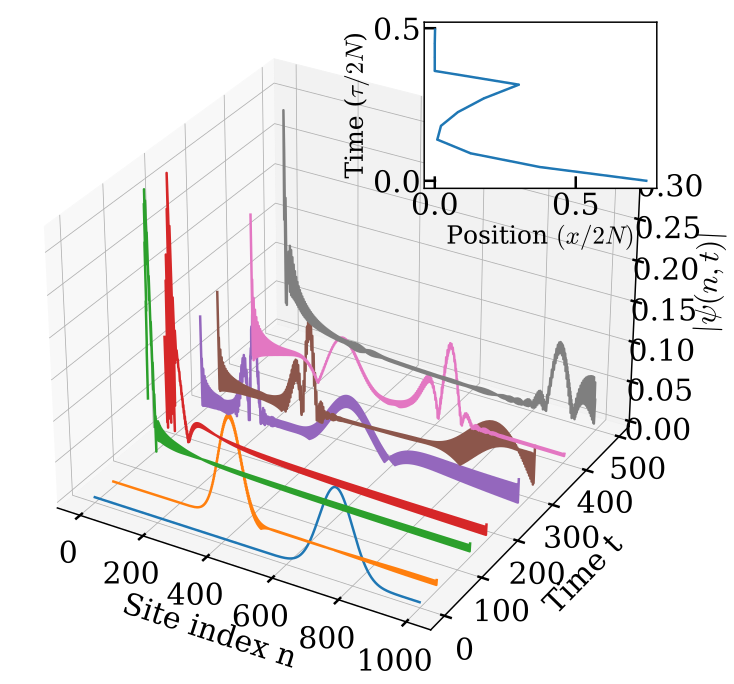

In [84]:
import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes  # Inset axes


######################################################################################

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1

def build_extended_ssh(N, t_a, t_b, t_c, t_d, sigma,
                       periodic=False, dtype=np.complex128):
    dim = 2 * N
    H = np.zeros((dim, dim), dtype=dtype)
    for n in range(N):
        # intracell
        ta_i = t_a * ((n + 1) / (dim - 1)) ** sigma
        H[idx_A(n), idx_B(n)] = ta_i
        H[idx_B(n), idx_A(n)] = np.conj(ta_i)
        # A_n – B_{n-1}
        if n > 0 or periodic:
            m = (n - 1) % N
            tb_i = t_b * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tb_i
            H[idx_B(m), idx_A(n)] = np.conj(tb_i)
        # A_n – B_{n+1}
        if n < N - 1 or periodic:
            m = (n + 1) % N
            tc_i = t_c * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tc_i
            H[idx_B(m), idx_A(n)] = np.conj(tc_i)
        # A_n – B_{n-2}
        if n > 1 or periodic:
            m = (n - 2) % N
            td_i = t_d * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = td_i
            H[idx_B(m), idx_A(n)] = np.conj(td_i)
    return H


######################################################################################
def build_ssh_hamiltonian(N, v, w, sigma):
    """
    Build the SSH Hamiltonian on a 1D lattice of N sites.
    """
    H = np.zeros((N, N), dtype=complex)
    for i in range(N-1):
        # Scale the hopping amplitudes with position
        v_i = v * ((i + 1) / (N-1))**sigma
        w_i = w * ((i + 1) / (N-1))**sigma
        if i % 2 == 0:
            H[i, i+1] = -v_i
            H[i+1, i] = -v_i
        else:
            H[i, i+1] = -w_i
            H[i+1, i] = -w_i
    return H

###########################################
# New SSH Hamiltonian with additional hoppings and updated parameters
...  # [Remaining SSH function and gaussian_wave_packet unchanged]

#############################################

def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    psi /= np.linalg.norm(psi)
    return psi

# Time evolution and plotting with inset

def run_time_evolution(N, L, n0, p0, omega, dt, T, plot_times):
    # Build Hamiltonian and time evolution operator
    H_dqpt = build_extended_ssh(N, t_a=3, t_b=1, t_c=-1, t_d=-3, sigma=0.5, periodic=False)
    U = expm(-1j * H_dqpt * dt)

    # Initial wavefunction
    psi = gaussian_wave_packet(L, n0, p0, omega)

    # Time evolution
    t_steps = int(np.round(T / dt))
    psi_t = [np.abs(psi.copy())]
    for _ in range(t_steps):
        psi = U @ psi
        psi_t.append(np.abs(psi))

    # Original 3D plot
    times_to_plot = np.linspace(0, t_steps, plot_times, dtype=int)
    positions = np.arange(L)
    fig = plt.figure(figsize=(20,12))
    ax = fig.add_subplot(111, projection='3d')
    for t_idx in times_to_plot:
        time_val = t_idx * dt
        y_vals = np.full(positions.shape, time_val)
        z_vals = psi_t[t_idx]
        ax.plot(positions, y_vals, z_vals, label=f"t = {time_val:.1f}")
    ax.set_xlabel("Site index n", fontsize=30, labelpad=25)
    ax.set_ylabel("Time t", fontsize=30, labelpad=25)
    ax.set_zlabel(r"$|\psi(n,t)|$", fontsize=30, labelpad=25)
    ax.tick_params(axis='x', which='major', pad=10)
    ax.tick_params(axis='y', which='major', pad=10)
    ax.tick_params(axis='z', which='major', pad=10)

    # Compute peak positions and rescaled values for inset
    peak_positions, rescaled_times, rescaled_positions = [], [], []
    for step, psi_abs in enumerate(psi_t):
        peak_index = np.argmax(psi_abs)
        peak_positions.append(peak_index)
        t_val = step * dt
        rescaled_times.append(t_val / L)
        rescaled_positions.append(peak_index / L)

    # Inset: 2D plot of rescaled peak position vs. rescaled time

    ax_inset = inset_axes(ax, width="35%", height="25%", loc='upper right')
    ax_inset.plot(rescaled_positions, rescaled_times, 'o-', markersize=1)
    ax_inset.set_xlabel(r"Position $(x/2N)$", fontsize=25)
    ax_inset.set_ylabel(r"Time ($\tau/2N$)", fontsize=25)

    plt.show()

if __name__ == "__main__":
    run_time_evolution(
        N=500,
        L=1000,
        omega=50,
        n0=750,
        p0=0.5*np.pi,
        dt=45,
        T=500,
        plot_times=8
    )


C:\Users\lenovo\AppData\Local\Temp\ipykernel_9948\1759394071.py:189: ComplexWarning: Casting complex values to real discards the imaginary part
  v_topo[i] = (v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +


<Figure size 800x600 with 0 Axes>

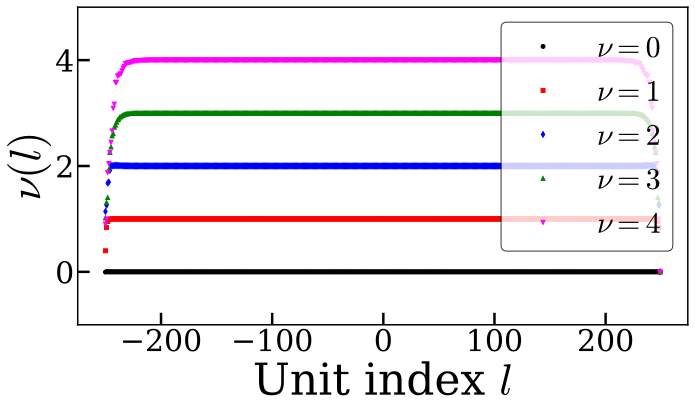

<Figure size 800x600 with 0 Axes>

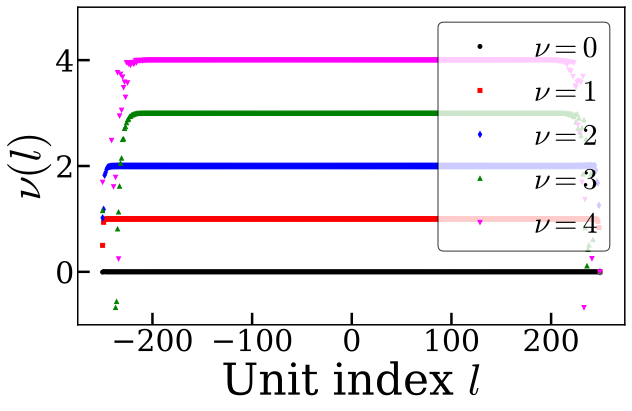

In [53]:
#WINDING NUMBER WITH LTM FOR EXTENDED SSH DQPT


# Extended SSH MODEL with topological marker plots for multiple parameters
import numpy as np
import matplotlib.pyplot as plt

# For publication-quality plots (e.g., Physical Review B), you may use a clear font and set figure size/resolution
plt.rcParams.update({
    'font.size': 16,
    'figure.figsize': (8, 6),
    'axes.linewidth': 1.5,
    'mathtext.fontset': 'cm',
    'font.family': 'serif'
})

# Global system size
L = 1000
N=500
######################################################################################

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1

def build_extended_ssh(N, t_a, t_b, t_c, t_d, sigma,
                       periodic=False, dtype=np.complex128):
    dim = 2 * N
    H = np.zeros((dim, dim), dtype=dtype)
    for n in range(N):
        # intracell
        ta_i = t_a * ((n + 1) / (dim - 1)) ** sigma
        H[idx_A(n), idx_B(n)] = ta_i
        H[idx_B(n), idx_A(n)] = np.conj(ta_i)
        # A_n – B_{n-1}
        if n > 0 or periodic:
            m = (n - 1) % N
            tb_i = t_b * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tb_i
            H[idx_B(m), idx_A(n)] = np.conj(tb_i)
        # A_n – B_{n+1}
        if n < N - 1 or periodic:
            m = (n + 1) % N
            tc_i = t_c * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tc_i
            H[idx_B(m), idx_A(n)] = np.conj(tc_i)
        # A_n – B_{n-2}
        if n > 1 or periodic:
            m = (n - 2) % N
            td_i = t_d * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = td_i
            H[idx_B(m), idx_A(n)] = np.conj(td_i)
    return H


######################################################################################

def SSH(c, sigma):
    """
    Construct the Hamiltonian for the SSH model with additional hoppings,
    for a given winding number parameter c and exponent sigma.
    """
    if c == 2:
        t = 0.1
        dt = -0.1
        w = t - dt
        v = t + dt
        nu = 0.5
        mu = 0.2
        gamma = 0.4
    elif c == 4:
        # Two possible sets of parameters; here we choose one:
        t = 0.20
        dt = 0.05
        w = t - dt
        v = t + dt
        nu = 0.50
        mu = 0.20
        gamma = 0.40
    elif c == 3:
        t = 0.3
        dt = -0.2
        w = t - dt
        v = t + dt
        nu = 0.35
        mu = 0.6
        gamma = 0
    elif c == 1:
        t = 0.75
        dt = -0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0
    elif c == 0:
        t = 0.75
        dt = 0.25
        w = t - dt
        v = t + dt
        nu = 0
        mu = 0
        gamma = 0

    # Build the Hamiltonian matrix SHH (LxL complex matrix)
    SHH = np.zeros((L, L), dtype=complex)

    # Nearest-neighbor hopping
    for i in range(L - 1):
        v_i = v * ((i + 1) / (L - 1))**sigma
        w_i = w * ((i + 1) / (L - 1))**sigma
        if i % 2 == 0:
            SHH[i + 1, i] = v_i
            SHH[i, i + 1] = v_i
        else:
            SHH[i + 1, i] = w_i
            SHH[i, i + 1] = w_i

    # Next-nearest and further neighbor hoppings:
    for i in range(L - 3):
        nu_i = nu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 3, i] = nu_i
            SHH[i, i + 3] = nu_i

    for i in range(L - 5):
        mu_i = mu * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 5, i] = mu_i
            SHH[i, i + 5] = mu_i

    for i in range(L - 7):
        gamma_i = gamma * ((i + 1) / (L - 1))**sigma
        if i % 2 != 0:
            SHH[i + 7, i] = gamma_i
            SHH[i, i + 7] = gamma_i

    return SHH

def compute_topological_marker(c, sigma):
    """
    Compute the topological marker v(l) for the SSH model given parameters c and sigma.
    """
    # Build Hamiltonian and diagonalize it
    H = SSH(c, sigma)
    eigenvalues, eigenvectors = np.linalg.eigh(H)
    num_eigenvectors = len(eigenvalues)
    num_eigenvectors_half = num_eigenvectors // 2

    # Construct matrices with eigenvectors (projecting into two halves)
    Um = np.column_stack(eigenvectors[:, :num_eigenvectors_half])
    Up = np.column_stack(eigenvectors[:, num_eigenvectors_half:])

    # Compute projectors
    Pp = np.dot(Up.T, Up)
    Pm = np.dot(Um.T, Um)
    Q = Pp - Pm

    # Define GA and GB as diagonal matrices with ones on even and odd indices respectively
    GA = np.zeros((L, L))
    GB = np.zeros((L, L))
    for i in range(L):
        if i % 2 == 0:
            GA[i, i] = 1
        else:
            GB[i, i] = 1

    # Off-diagonal blocks of Q
    Qab = GA @ Q @ GB
    Qba = GB @ Q @ GA

    # Define the position-like operator X
    X = np.zeros((L, L))
    X[0, 0] = -L / 4
    for i in range(0, L - 1, 2):
        X[i, i] = -L / 4 + i / 2
        if i + 1 < L:
            X[i + 1, i + 1] = X[i, i]

    # Compute operators v1 and v2
    v1 = 0.5 * (Qba @ (X @ Qab - Qab @ X))
    v2 = 0.5 * (Qab @ (Qba @ X - X @ Qba))

    # Evaluate the topological marker v(l)
    v_topo = np.zeros(L // 2)
    for i in range(L // 2 - 1):
        v_topo[i] = (v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +
                     v2[2*i, 2*i] + v2[2*i+1, 2*i+1])
    return v_topo

# Define the parameters for which to compute the marker
sigma_vals = [0, 1]   # Two sigma values: 0 and 1
c_vals = [0, 1, 2, 3, 4]  # Five c values

# Define a dictionary for distinct plotting styles for each c value.
plot_styles = {
    0: {'linestyle': '',  'marker': 'o', 'color': 'black',   'label': fr'$\nu=0$'},
    1: {'linestyle': '', 'marker': 's', 'color': 'red',     'label': fr'$\nu=1$'},
    2: {'linestyle': '', 'marker': 'd', 'color': 'blue',    'label': fr'$\nu=2$'},
    3: {'linestyle': '',  'marker': '^', 'color': 'green',   'label': fr'$\nu=3$'},
    4: {'linestyle': '',  'marker': 'v', 'color': 'magenta', 'label': fr'$\nu=4$'},
}

# Loop over the sigma values and plot the topological marker for each c value on one figure per sigma.
for sigma in sigma_vals:
    plt.figure()
    plt.figure(figsize=(10, 6))
    for c in c_vals:
        v_topo = compute_topological_marker(c, sigma)
        x_axis = np.arange(len(v_topo))
        style = plot_styles[c]
        plt.plot(l, v_topo, linestyle=style['linestyle'],
                 marker=style['marker'], markersize=4,
                 color=style['color'], label=style['label'], linewidth=1.0)
    plt.xlabel(fr"Unit index $l$", fontsize=44)
    plt.ylabel(fr"$\nu(l)$", fontsize=44)
    #plt.title(r"Topological Marker for $\sigma = %d$" % sigma)
    plt.legend(loc='upper right', fontsize=30)
    plt.tight_layout()
    plt.ylim(-1,5)
    plt.show()


C:\Users\lenovo\AppData\Local\Temp\ipykernel_9948\1713975787.py:113: ComplexWarning: Casting complex values to real discards the imaginary part
  v_topo[i] = (


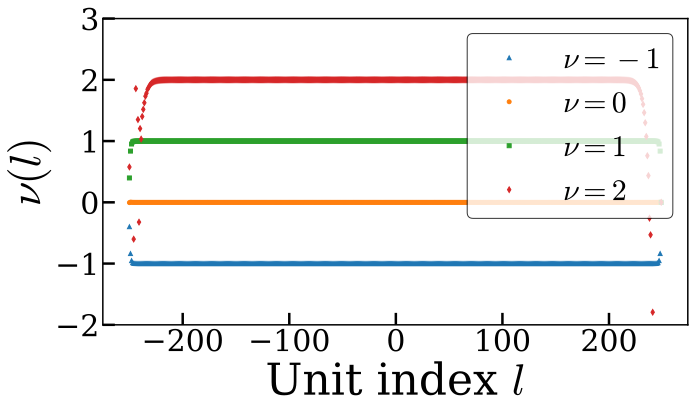

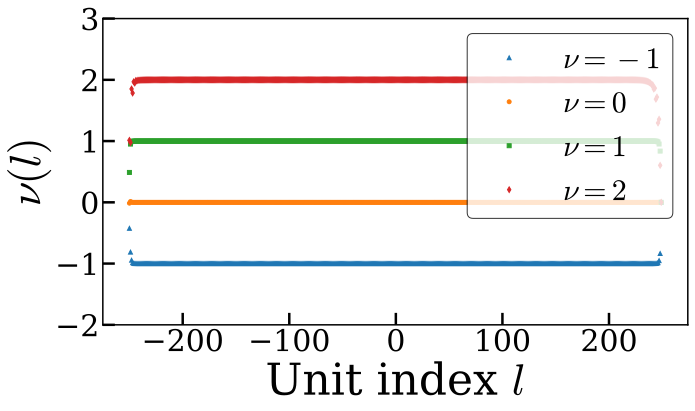

In [57]:
#WINDING NUMBER WITH LTM FOR EXTENDED SSH DQPT

# Extended SSH MODEL with topological marker plots for multiple parameters
import numpy as np
import matplotlib.pyplot as plt

# For publication-quality plots (e.g., Physical Review B), you may use a clear font and set figure size/resolution
plt.rcParams.update({
    'font.size': 16,
    'figure.figsize': (8, 6),
    'axes.linewidth': 1.5,
    'mathtext.fontset': 'cm',
    'font.family': 'serif'
})

# Global system sizes
dim_global = 1000  # overall Hamiltonian dimension
double_sites = dim_global // 2  # half indices

######################################################################################

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1

def build_extended_ssh(N, t_a, t_b, t_c, t_d, sigma,
                       periodic=False, dtype=np.complex128):
    dim = 2 * N
    H = np.zeros((dim, dim), dtype=dtype)
    for n in range(N):
        # intracell
        ta_i = t_a * ((n + 1) / (dim - 1)) ** sigma
        H[idx_A(n), idx_B(n)] = ta_i
        H[idx_B(n), idx_A(n)] = np.conj(ta_i)
        # A_n – B_{n-1}
        if n > 0 or periodic:
            m = (n - 1) % N
            tb_i = t_b * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tb_i
            H[idx_B(m), idx_A(n)] = np.conj(tb_i)
        # A_n – B_{n+1}
        if n < N - 1 or periodic:
            m = (n + 1) % N
            tc_i = t_c * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = tc_i
            H[idx_B(m), idx_A(n)] = np.conj(tc_i)
        # A_n – B_{n-2}
        if n > 1 or periodic:
            m = (n - 2) % N
            td_i = t_d * ((n + 1) / (dim - 1)) ** sigma
            H[idx_A(n), idx_B(m)] = td_i
            H[idx_B(m), idx_A(n)] = np.conj(td_i)
    return H

######################################################################################

def compute_topological_marker(c, sigma):
    """
    Compute the local topological marker v(l) using build_extended_ssh.
    """
    # Map winding number c to hopping parameters (t1, t2, t3, t4)
    if c == 1:
        t1, t2, t3, t4 = 0.5, 1, 0, 0
    elif c == 2:
        t1, t2, t3, t4 = 2, 1, -1, -3
    elif c == 0:
        t1, t2, t3, t4 = 1, 0.5, 0, 0
    elif c == -1:
        t1, t2, t3, t4 = 0.5, 0, 1, 0
    else:
        raise ValueError(f"Unsupported winding number c={c}")

    # Build Hamiltonian and diagonalize
    H = build_extended_ssh(double_sites, t1, t2, t3, t4, sigma)
    eigenvalues, eigenvectors = np.linalg.eigh(H)
    dim = H.shape[0]
    half = dim // 2

    # Construct projectors
    Um = eigenvectors[:, :half]
    Up = eigenvectors[:, half:]
    Pp = Up @ Up.T
    Pm = Um @ Um.T
    Q = Pp - Pm

    # Define GA, GB, and position operator X dynamically
    GA = np.zeros((dim, dim))
    GB = np.zeros((dim, dim))
    for i in range(dim):
        if i % 2 == 0:
            GA[i, i] = 1
        else:
            GB[i, i] = 1
    X = np.zeros((dim, dim))
    X[0, 0] = -dim / 4
    for i in range(0, dim - 1, 2):
        X[i, i] = -dim / 4 + i / 2
        X[i + 1, i + 1] = X[i, i]

    # Compute off-diagonal blocks of Q
    Qab = GA @ Q @ GB
    Qba = GB @ Q @ GA

    # Compute v1, v2
    v1 = 0.5 * (Qba @ (X @ Qab - Qab @ X))
    v2 = 0.5 * (Qab @ (Qba @ X - X @ Qba))

    # Evaluate the local topological marker v(l)
    v_topo = np.zeros(half)
    for i in range(half - 1):
        v_topo[i] = (
            v1[2*i, 2*i] + v1[2*i+1, 2*i+1] +
            v2[2*i,   2*i] + v2[2*i+1, 2*i+1]
        )
    return v_topo

# Plotting
sigma_vals = [0, 1]
c_vals = [-1,0,1,2]
plot_styles = {
    0: {'linestyle':'', 'marker':'o', 'label':r'$\nu=0$'},
    1: {'linestyle':'', 'marker':'s', 'label':r'$\nu=1$'},
    2: {'linestyle':'', 'marker':'d', 'label':r'$\nu=2$'},
    -1: {'linestyle':'', 'marker':'^','label':r'$\nu=-1$'}
}
for sigma in sigma_vals:
    plt.figure(figsize=(10, 6))
    for c in c_vals:
        v_topo = compute_topological_marker(c, sigma)
        x = np.arange(len(v_topo))
        style = plot_styles[c]
        plt.plot(
            l, v_topo,
            linestyle=style['linestyle'],
            marker=style['marker'],
            markersize=4,
            label=style['label'],
            linewidth=1.0
        )
    plt.xlabel(r"Unit index $l$", fontsize=44)
    plt.ylabel(r"$\nu(l)$", fontsize=44)
    plt.legend(loc='upper right', fontsize=30)
    plt.ylim(-2, 3)
    plt.tight_layout()
    plt.show()


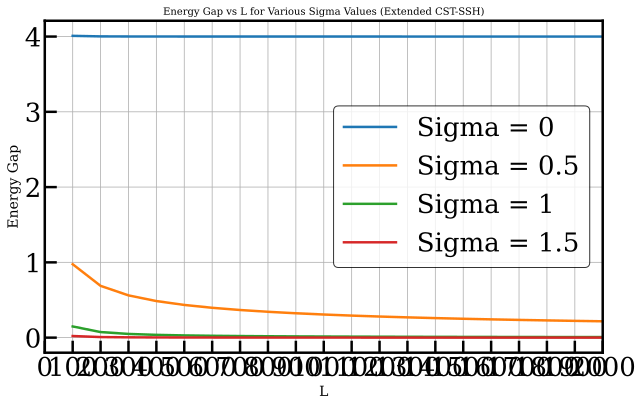

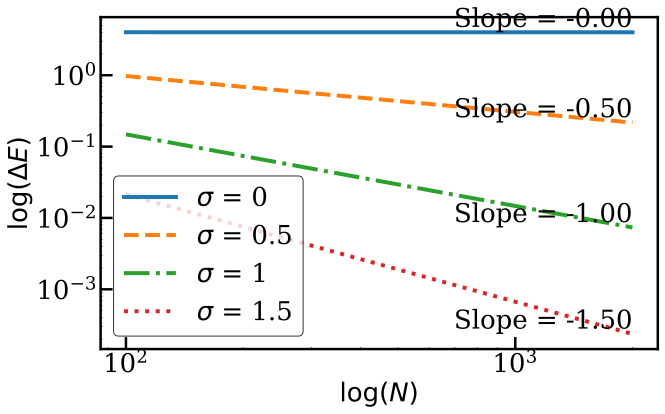

Slopes for each sigma value:
Sigma = 0: Slope = -0.000
Sigma = 0.5: Slope = -0.501
Sigma = 1: Slope = -1.003
Sigma = 1.5: Slope = -1.504


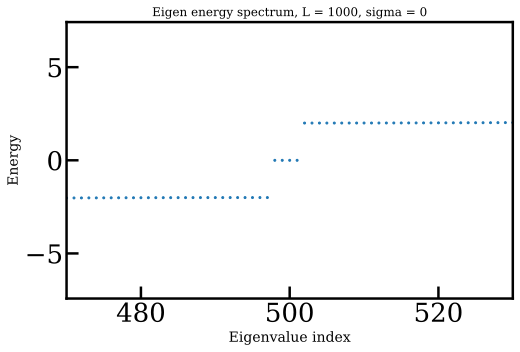

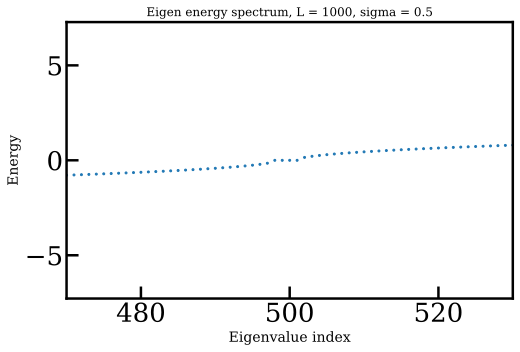

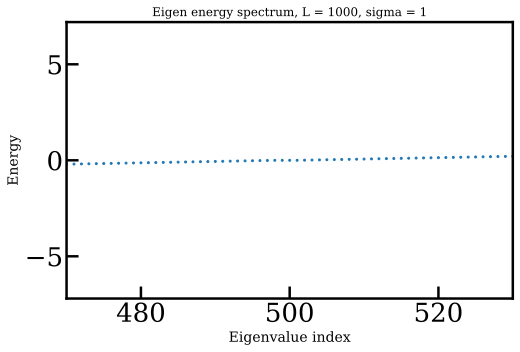

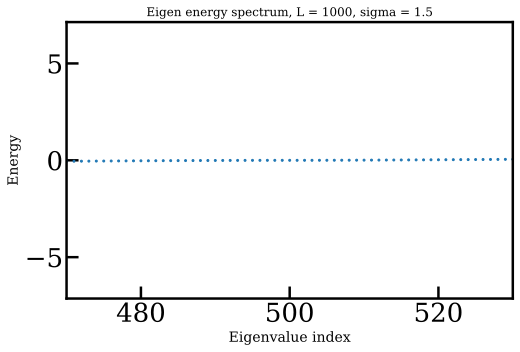

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 0. Indexing and extended CST-SSH Hamiltonian
# ============================================================

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1

def build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma,
                             periodic=False, dtype=np.complex128):
    """
    H_ext = sum_n [ t1(n) A_n^† B_n  + t2(n) B_n^† A_{n+1}
                  + t3(n) A_n^† B_{n+1} + t4(n) B_n^† A_{n+2} + h.c. ]
    with
        t1(n)=t1 * ((2n-1)/(2N-1))^sigma
        t2(n)=t2 * ((2n  )/(2N-1))^sigma
        t3(n)=t3 * ((2n-1)/(2N-1))^sigma
        t4(n)=t4 * ((2n  )/(2N-1))^sigma,
    where n = 1..N in the formula, but here we index n=0..N-1.
    """
    dim = 2 * N
    H = np.zeros((dim, dim), dtype=dtype)

    denom = 2 * N - 1
    for n in range(N):
        # map to paper's n -> (n+1)
        num_odd  = 2 * (n + 1) - 1   # 2n-1
        num_even = 2 * (n + 1)       # 2n

        t1n = t_a * (num_odd / denom)**sigma
        t2n = t_b * (num_even / denom)**sigma
        t3n = t_c * (num_odd  / denom)**sigma
        t4n = t_d * (num_even / denom)**sigma

        # 1) intracell:  A_n <-> B_n
        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        # 2) intercell (right, NN):  B_n <-> A_{n+1}
        if n < N - 1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        # 3) other NN (right):  A_n <-> B_{n+1}
        if n < N - 1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        # 4) next–next:  B_n <-> A_{n+2}
        if n < N - 2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H

# ============================================================
# 1. Energy gap computation in real space
# ============================================================

def compute_energy_gap_real_space(L, t, dt, sigma):
    """
    Compute the energy gap around zero for the extended CST-SSH chain.

    L = total sites = 2N  (must be even)

    For now we use fixed hoppings:
        t_a =  2   (intracell-like)
        t_b =  1   (intercell-like)
        t_c = -1   (second leg)
        t_d = -4   (longer-range leg)

    Gap is defined as:
        energy_gap = eigenvalues[mid_index + k1] - eigenvalues[mid_index - k2]
    You will manually adjust k1, k2 depending on how many zero modes you see.
    """
    assert L % 2 == 0, "L must be even (2 sites per unit cell)."
    N = L // 2

    # Fixed hoppings you chose (t, dt are ignored here)
    t_a = 2
    t_b = 1
    t_c = -1
    t_d = -4

    H = build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma, periodic=False)

    eigenvalues, eigenvectors = np.linalg.eigh(H)
    mid_index = L // 2

    # ---- manual offsets for gap definition ----
    # Change k1 and k2 after you inspect the spectrum and count zero modes.
    k1 = 2
    k2 = 3

    energy_gap = eigenvalues[mid_index + k1] - eigenvalues[mid_index - k2]
    return energy_gap

# ============================================================
# 2. Parameters and Energy gap vs L plots
# ============================================================

# Define specific sigma values to plot
sigma_values = [0, 0.5, 1, 1.5]  # Sigma values for each curve
L_values = np.arange(100, 2001, 100)  # L from 100 to 2000 with interval 100
dt = -0.25  # kept for interface compatibility (not used inside)
t = 0.75    # kept for interface compatibility (not used inside)

# ---------------- Linear plot: gap vs L ----------------
plt.figure(figsize=(10, 6))

for sigma in sigma_values:
    energy_gaps = [compute_energy_gap_real_space(L, t, dt, sigma) for L in L_values]
    plt.plot(L_values, energy_gaps, label=f'Sigma = {sigma}')

plt.xlim(0, 2000)
plt.xticks(np.arange(0, 2001, 100))
plt.xlabel('L', fontsize=14)
plt.ylabel('Energy Gap', fontsize=14)
plt.title('Energy Gap vs L for Various Sigma Values (Extended CST-SSH)', fontsize=10)
plt.legend()
plt.grid(True)
plt.show()

# -------------------------------------------------------
# Log-log plot with fitted slopes
# -------------------------------------------------------

plt.figure(figsize=(10, 6))
line_styles = ['-', '--', '-.', ':']
slopes = {}

for i, sigma in enumerate(sigma_values):
    energy_gaps = [compute_energy_gap_real_space(L, t, dt, sigma) for L in L_values]

    log_L = np.log(L_values)
    log_energy_gaps = np.log(energy_gaps)
    slope, intercept = np.polyfit(log_L, log_energy_gaps, 1)
    slopes[sigma] = slope

    style = line_styles[i % len(line_styles)]
    plt.plot(L_values, energy_gaps, style, label=f'$\sigma$ = {sigma}', linewidth=4)

    plt.text(L_values[-1], energy_gaps[-1], f"Slope = {slope:.2f}",
             fontsize=26, verticalalignment='bottom', horizontalalignment='right')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\log (N)$', fontsize=26)
plt.ylabel('$\log (\Delta E)$', fontsize=26)
plt.legend()
plt.show()

print("Slopes for each sigma value:")
for sigma, slope in slopes.items():
    print(f"Sigma = {sigma}: Slope = {slope:.3f}")

# ============================================================
# 3. Eigen energy spectrum plots for inspection of zero modes
# ============================================================

L_spec = 1000  # choose one representative size (must be even)
N_spec = L_spec // 2

for sigma in sigma_values:
    # same hoppings as in compute_energy_gap_real_space
    t_a = 2
    t_b = 1
    t_c = -1
    t_d = -4

    H_spec = build_extended_ssh_exact(N_spec, t_a, t_b, t_c, t_d, sigma, periodic=False)
    eigenvalues_spec, _ = np.linalg.eigh(H_spec)

    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(L_spec), eigenvalues_spec, '.', markersize=4)
    # plt.axhline(0.0, color='k', linewidth=1)
    plt.xlabel('Eigenvalue index', fontsize=14)
    plt.ylabel('Energy', fontsize=14)
    plt.title(f'Eigen energy spectrum, L = {L_spec}, sigma = {sigma}', fontsize=12)
    # plt.grid(True)
    plt.xlim(470,530)
    plt.show()


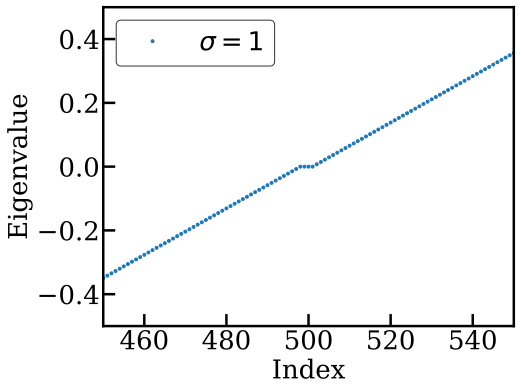

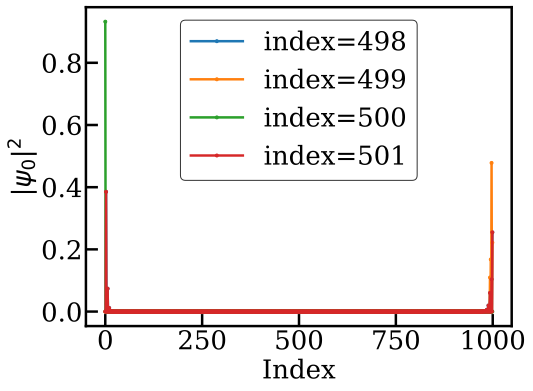

In [34]:
import numpy as np
import matplotlib.pyplot as plt

def idx_A(n): return 2 * n
def idx_B(n): return 2 * n + 1

def build_extended_cst_ssh(N, t1, t2, t3, t4, sigma, periodic=False, dtype=np.complex128):
    dim = 2 * N
    H = np.zeros((dim, dim), dtype=dtype)
    denom = 2 * N - 1

    for n in range(N):
        num_odd  = 2 * (n + 1) - 1
        num_even = 2 * (n + 1)

        t1n = t1 * (num_odd  / denom) ** sigma
        t2n = t2 * (num_even / denom) ** sigma
        t3n = t3 * (num_odd  / denom) ** sigma
        t4n = t4 * (num_even / denom) ** sigma

        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        if n < N - 1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        if n < N - 1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        if n < N - 2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H

def diagonalize_hamiltonian(H):
    evals, evecs = np.linalg.eigh(H)
    idx = np.argsort(evals.real)
    return evals[idx], evecs[:, idx]

def plot_spectrum(evals, sigma, title=None):
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(np.arange(len(evals)), evals.real, ".", markersize=6,  label=rf"$\sigma = {sigma}$")
    ax.set_xlabel("Index")
    ax.set_ylabel("Eigenvalue")
    ax.legend()  
    if title is not None:
        ax.set_title(title)
    # ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.xlim(450,550)
    plt.ylim(-0.5,0.5)
    # plt.ylim(-2.25,2.25)
    plt.show()

def plot_eigenstates_same_plot(evecs, N, selected_indices, evals=None, separate_sublattices=False):
    selected_indices = list(selected_indices)

    if separate_sublattices:
        cells = np.arange(N)
        fig, ax = plt.subplots(figsize=(8, 6))
        for idx in selected_indices:
            psi = evecs[:, idx]
            prob = np.abs(psi) ** 2
            prob_A = prob[0::2]
            prob_B = prob[1::2]
            if evals is not None:
                label_A = f"n={idx}, E={evals[idx]:.3f} (A)"
                label_B = f"n={idx}, E={evals[idx]:.3f} (B)"
            else:
                label_A = f"n={idx} (A)"
                label_B = f"n={idx} (B)"
            ax.plot(cells, prob_A, "-o", markersize=3, label=label_A)
            ax.plot(cells, prob_B, "-s", markersize=3, label=label_B)
        ax.set_xlabel("Unit cell index n")
        ax.set_ylabel("|psi(n)|^2")
        # ax.set_title("Eigenstate probability densities (sublattice resolved)")
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.tight_layout()
        plt.show()
    else:
        n_sites = 2 * N
        x = np.arange(n_sites)
        fig, ax = plt.subplots(figsize=(8, 6))
        for idx in selected_indices:
            psi = evecs[:, idx]
            prob = np.abs(psi) ** 2
            if evals is not None:
                label = f"index={idx}"
            else:
                label = f"index={idx}"
            ax.plot(x, prob, "-o", markersize=3, label=label)
        ax.set_xlabel("Index")
        ax.set_ylabel(fr"|$\psi_0|^2$")
        # ax.set_title("Eigenstate probability densities")
        # ax.grid(True, alpha=0.3)
        ax.legend(fontsize=26)
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    N = 500
    sigma = 1
    t1, t2, t3, t4 = 2,1,-1,-4

    H = build_extended_cst_ssh(N, t1, t2, t3, t4, sigma, periodic=False)
    evals, evecs = diagonalize_hamiltonian(H)

    plot_spectrum(evals, sigma, title=f"")

    dim = 2 * N
    mid = dim // 2
    selected_indices = [ mid-2,mid-1,mid,mid+1]

    # All chosen eigenstates in the same plot:
    plot_eigenstates_same_plot(evecs, N, selected_indices, evals=evals, separate_sublattices=False)


p0 = 3.141593
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.250222
Fitted alpha = 0.438947
--------------------------------------------------
p0 = 1.570796
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.132108
Fitted alpha = 0.177218
--------------------------------------------------


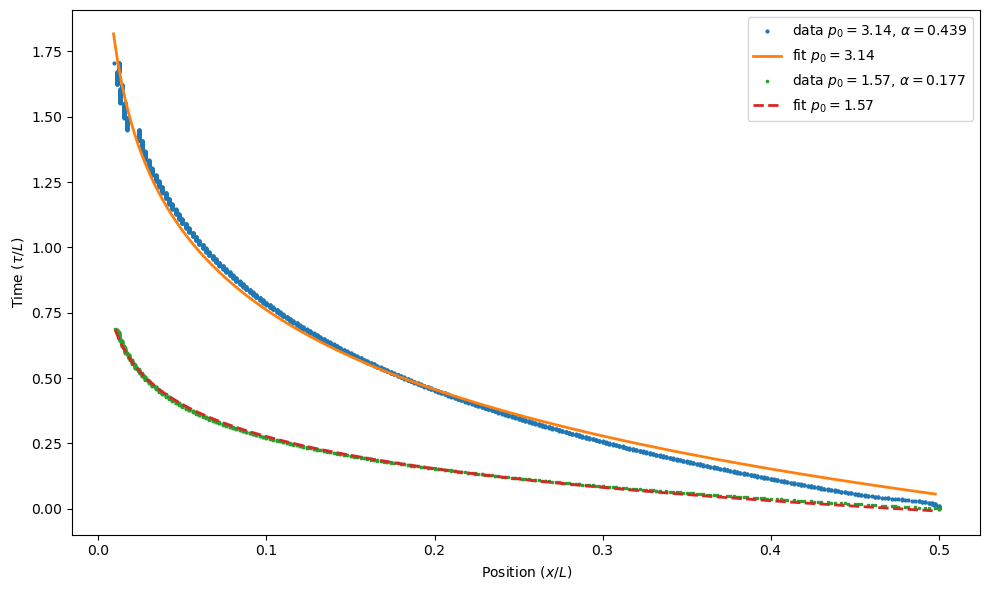

In [5]:
#EXTENDED SSH DQPT exacttttt

#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1
######################################################################################


def build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma,
                             periodic=False, dtype=np.complex128):
    """
    H_ext = sum_n [ t1(n) A_n^† B_n  + t2(n) B_n^† A_{n+1}
                  + t3(n) A_n^† B_{n+1} + t4(n) A_n^† B_{n+2} + h.c. ]
    with
        t1(n)=t1 * ((2n-1)/(2N-1))^sigma
        t2(n)=t2 * ((2n  )/(2N-1))^sigma
        t3(n)=t3 * ((2n-1)/(2N-1))^sigma
        t4(n)=t4 * ((2n  )/(2N-1))^sigma,
    where n = 1..N in the formula, but here we index n=0..N-1.
    """
    dim = 2*N
    H = np.zeros((dim, dim), dtype=dtype)

    denom = 2*N - 1
    for n in range(N):
        # map to paper's n -> (n+1)
        num_odd  = 2*(n+1) - 1   # 2n-1
        num_even = 2*(n+1)       # 2n

        t1n = t_a * (num_odd / denom)**sigma
        t2n = t_b * (num_even / denom)**sigma
        t3n = t_c * (num_odd  / denom)**sigma
        t4n = t_d * (num_even / denom)**sigma

        # 1) intracell:  A_n <-> B_n
        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        # 2) intercell (right, NN):  B_n <-> A_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        # 3) other NN (right):  A_n <-> B_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        # 4) next–next:  B_n <-> A_{n+2}
        if n < N-2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H


######################################################################################
######################################################################################


def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N, L, n0, p0, omega, dt, T, plot_times, x_stop):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    Evolution stops when the rescaled peak position x̃ reaches x_stop
    (or when the maximum time T is reached).
    """
    # 1) Build the Hamiltonians
    H_dqpt=  build_extended_ssh_exact(
        N,
        t_a=1,
        t_b=0.5,
        t_c=-0.5,
        t_d=-1,
        sigma=1,
        periodic=False
    )
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_dqpt* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(L, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the maximum number of time steps
    t_steps = int(np.round(T / dt))
    
    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []

    # Record t=0
    psi_abs = np.abs(psi.copy())
    peak_index = np.argmax(psi_abs)
    peak_positions.append(peak_index)
    rescaled_times.append(0.0)              # τ̃ = t/L
    rescaled_positions.append(peak_index / L)  # x̃ = x/L

    # 5) Evolve the wavefunction in time until x̃ <= x_stop or T is exceeded
    for step in range(1, t_steps + 1):
        psi = U @ psi
        psi_abs = np.abs(psi)
        peak_index = np.argmax(psi_abs)
        peak_positions.append(peak_index)

        t_val = step * dt
        rescaled_times.append(t_val / L)          # τ̃
        rescaled_pos = peak_index / L             # x̃
        rescaled_positions.append(rescaled_pos)

        if rescaled_pos <= x_stop:
            break

    # Convert lists to numpy arrays
    x_data = np.array(rescaled_positions)   # x̃ = x/L
    t_data = np.array(rescaled_times)       # τ̃ = t/L

    # ---------------- FITTING SECTION ----------------
    # We expect τ̃(x̃) ≈ T0 - α ln x̃ (logarithmic divergence as x̃ → 0).
    def tau_model(x, T0, alpha):
        return T0 - alpha * np.log(x)

    # Sort data by position (helps for plotting & masking)
    order = np.argsort(x_data)
    x_sorted = x_data[order]
    t_sorted = t_data[order]

    # Keep only points with x>0 and x<0.5 for near-horizon behavior
    mask = (x_sorted > 0) & (x_sorted < 0.5)
    x_fit = x_sorted[mask]
    t_fit = t_sorted[mask]

    from scipy.optimize import curve_fit
    # Initial guesses for T0 and alpha
    p0_guess = (t_fit.mean(), 0.1)
    popt, pcov = curve_fit(tau_model, x_fit, t_fit, p0=p0_guess)
    T0_fit, alpha_fit = popt

    print(f"p0 = {p0:.6f}")
    print("Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)")
    print(f"Fitted T0   = {T0_fit:.6f}")
    print(f"Fitted alpha = {alpha_fit:.6f}")
    print("--------------------------------------------------")

    # Generate a smooth fitted curve for plotting
    x_fit_plot = np.linspace(x_fit.min(), x_fit.max(), 200)
    t_fit_plot = tau_model(x_fit_plot, T0_fit, alpha_fit)
    # --------------------------------------------------

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # Return all data needed for external plotting
    return (np.array(rescaled_positions), np.array(rescaled_times),
            x_fit_plot, t_fit_plot, alpha_fit, turning_pos, turning_time)


###########################################################################################################################################
if __name__ == "__main__":
    N = 500
    L = 2*N           # Number of lattice sites
    omega = 50        # Gaussian width parameter
    n0 = 500          # Localization site for the Gaussian
    dt = 1            # Time step
    T = 2000          # Maximum evolution time
    plot_times = 10   # Unused now (kept to preserve signature)
    x_stop = 0.01    # Stop when x̃ reaches this value

    # Two different momenta
    p0_1 = np.pi
    p0_2 = np.pi/2

    # Run evolution for both p0 values
    x1, t1, xfit1, tfit1, alpha1, xturn1, tturn1 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_1,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    x2, t2, xfit2, tfit2, alpha2, xturn2, tturn2 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_2,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    # 8) Create a single 2D plot: rescaled peak position vs rescaled time, with fits,
    #    for both momenta, and show α values in the legend.
    plt.figure(figsize=(10, 6))

    # data for p0_1
    plt.plot(x1, t1, 'o', markersize=2,
             label=fr"data $p_0={p0_1:.2f},\,\alpha={alpha1:.3f}$")
    plt.plot(xfit1, tfit1, '-', linewidth=2,
             label=fr"fit $p_0={p0_1:.2f}$")

    # data for p0_2
    plt.plot(x2, t2, 's', markersize=2,
             label=fr"data $p_0={p0_2:.2f},\,\alpha={alpha2:.3f}$")
    plt.plot(xfit2, tfit2, '--', linewidth=2,
             label=fr"fit $p_0={p0_2:.2f}$")

    plt.xlabel(r"Position $(x/L)$")
    plt.ylabel(r"Time $(\tau/L)$")
    # plt.xscale('log')  # optional if you want log-x view

    plt.legend()
    # plt.xlim(0,0.1)   # you can uncomment/tune for near-horizon zoom
    plt.tight_layout()
    plt.show()


p0 = 3.141593
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.250222
Fitted alpha = 0.438947
--------------------------------------------------
p0 = 1.570796
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.132108
Fitted alpha = 0.177218
--------------------------------------------------


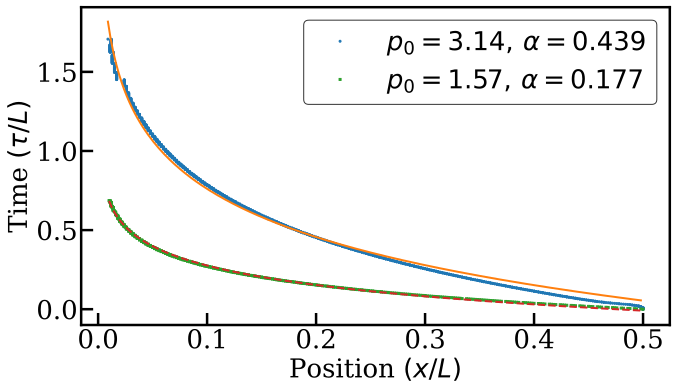

In [36]:
#EXTENDED SSH DQPT exacttttt

#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1
######################################################################################


def build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma,
                             periodic=False, dtype=np.complex128):
    """
    H_ext = sum_n [ t1(n) A_n^† B_n  + t2(n) B_n^† A_{n+1}
                  + t3(n) A_n^† B_{n+1} + t4(n) A_n^† B_{n+2} + h.c. ]
    with
        t1(n)=t1 * ((2n-1)/(2N-1))^sigma
        t2(n)=t2 * ((2n  )/(2N-1))^sigma
        t3(n)=t3 * ((2n-1)/(2N-1))^sigma
        t4(n)=t4 * ((2n  )/(2N-1))^sigma,
    where n = 1..N in the formula, but here we index n=0..N-1.
    """
    dim = 2*N
    H = np.zeros((dim, dim), dtype=dtype)

    denom = 2*N - 1
    for n in range(N):
        # map to paper's n -> (n+1)
        num_odd  = 2*(n+1) - 1   # 2n-1
        num_even = 2*(n+1)       # 2n

        t1n = t_a * (num_odd / denom)**sigma
        t2n = t_b * (num_even / denom)**sigma
        t3n = t_c * (num_odd  / denom)**sigma
        t4n = t_d * (num_even / denom)**sigma

        # 1) intracell:  A_n <-> B_n
        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        # 2) intercell (right, NN):  B_n <-> A_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        # 3) other NN (right):  A_n <-> B_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        # 4) next–next:  B_n <-> A_{n+2}
        if n < N-2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H


######################################################################################
######################################################################################


def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N, L, n0, p0, omega, dt, T, plot_times, x_stop):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    Evolution stops when the rescaled peak position x̃ reaches x_stop
    (or when the maximum time T is reached).
    """
    # 1) Build the Hamiltonians
    H_dqpt=  build_extended_ssh_exact(
        N,
        t_a=1,
        t_b=0.5,
        t_c=-0.5,
        t_d=-1,
        sigma=1,
        periodic=False
    )
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_dqpt* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(L, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the maximum number of time steps
    t_steps = int(np.round(T / dt))
    
    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []

    # Record t=0
    psi_abs = np.abs(psi.copy())
    peak_index = np.argmax(psi_abs)
    peak_positions.append(peak_index)
    rescaled_times.append(0.0)              # τ̃ = t/L
    rescaled_positions.append(peak_index / L)  # x̃ = x/L

    # 5) Evolve the wavefunction in time until x̃ <= x_stop or T is exceeded
    for step in range(1, t_steps + 1):
        psi = U @ psi
        psi_abs = np.abs(psi)
        peak_index = np.argmax(psi_abs)
        peak_positions.append(peak_index)

        t_val = step * dt
        rescaled_times.append(t_val / L)          # τ̃
        rescaled_pos = peak_index / L             # x̃
        rescaled_positions.append(rescaled_pos)

        if rescaled_pos <= x_stop:
            break

    # Convert lists to numpy arrays
    x_data = np.array(rescaled_positions)   # x̃ = x/L
    t_data = np.array(rescaled_times)       # τ̃ = t/L

    # ---------------- FITTING SECTION (LOG-LINEAR) ----------------
    # Fit:  τ̃ = T0 - α ln(x̃)  <=>  τ̃ = a + b * ln(x̃),  where b = -α
    # Sort data by position (helps for plotting & masking)
    order = np.argsort(x_data)
    x_sorted = x_data[order]
    t_sorted = t_data[order]

    # Keep only points with x>0 and x<0.5 for near-horizon behavior
    mask = (x_sorted > 0) & (x_sorted < 0.5)
    x_fit = x_sorted[mask]
    t_fit = t_sorted[mask]

    u_fit = np.log(x_fit)  # u = ln(x)

    # Straight-line fit: t = a + b*u
    b_fit, a_fit = np.polyfit(u_fit, t_fit, 1)
    alpha_fit = -b_fit
    T0_fit = a_fit

    print(f"p0 = {p0:.6f}")
    print("Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)")
    print(f"Fitted T0   = {T0_fit:.6f}")
    print(f"Fitted alpha = {alpha_fit:.6f}")
    print("--------------------------------------------------")

    # Generate a smooth fitted curve for plotting (in x-space)
    x_fit_plot = np.linspace(x_fit.min(), x_fit.max(), 200)
    t_fit_plot = T0_fit - alpha_fit * np.log(x_fit_plot)
    # --------------------------------------------------

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # Return all data needed for external plotting
    return (np.array(rescaled_positions), np.array(rescaled_times),
            x_fit_plot, t_fit_plot, alpha_fit, turning_pos, turning_time)


###########################################################################################################################################
if __name__ == "__main__":
    N = 500
    L = 2*N           # Number of lattice sites
    omega = 50        # Gaussian width parameter
    n0 = 500          # Localization site for the Gaussian
    dt = 1            # Time step
    T = 2000          # Maximum evolution time
    plot_times = 10   # Unused now (kept to preserve signature)
    x_stop = 0.01    # Stop when x̃ reaches this value

    # Two different momenta
    p0_1 = np.pi
    p0_2 = np.pi/2

    # Run evolution for both p0 values
    x1, t1, xfit1, tfit1, alpha1, xturn1, tturn1 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_1,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    x2, t2, xfit2, tfit2, alpha2, xturn2, tturn2 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_2,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    # 8) Create a single 2D plot: rescaled peak position vs rescaled time, with straight-line (log-linear) fits,
    #    for both momenta, and show p0 and α values in the legend.
    plt.figure(figsize=(10, 6))

    # data + fit for p0_1
    plt.plot(x1, t1, 'o', markersize=2,
             label=fr"$p_0={p0_1:.2f},\,\alpha={alpha1:.3f}$")
    plt.plot(xfit1, tfit1, '-', linewidth=2)

    # data + fit for p0_2
    plt.plot(x2, t2, 's', markersize=2,
             label=fr"$p_0={p0_2:.2f},\,\alpha={alpha2:.3f}$")
    plt.plot(xfit2, tfit2, '--', linewidth=2)

    plt.xlabel(r"Position $(x/L)$")
    plt.ylabel(r"Time $(\tau/L)$")
    # plt.xscale('log')  # optional if you want log-x view

    plt.legend()
    plt.tight_layout()
    plt.show()


p0 = 3.141593
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.248249
Fitted alpha = 0.438046
--------------------------------------------------
p0 = 1.570796
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.133019
Fitted alpha = 0.177620
--------------------------------------------------


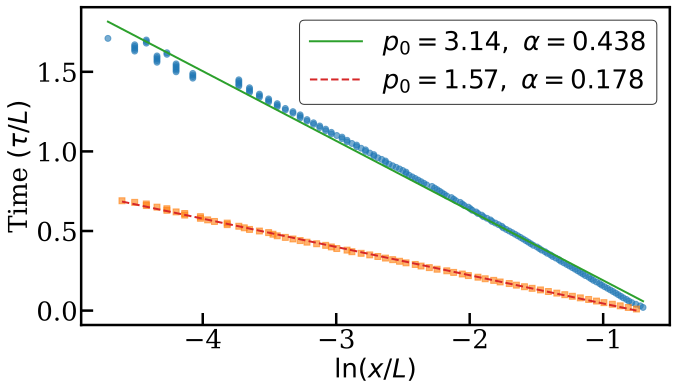

In [35]:
#EXTENDED SSH DQPT exacttttt

#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1
######################################################################################


def build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma,
                             periodic=False, dtype=np.complex128):
    """
    H_ext = sum_n [ t1(n) A_n^† B_n  + t2(n) B_n^† A_{n+1}
                  + t3(n) A_n^† B_{n+1} + t4(n) A_n^† B_{n+2} + h.c. ]
    with
        t1(n)=t1 * ((2n-1)/(2N-1))^sigma
        t2(n)=t2 * ((2n  )/(2N-1))^sigma
        t3(n)=t3 * ((2n-1)/(2N-1))^sigma
        t4(n)=t4 * ((2n  )/(2N-1))^sigma,
    where n = 1..N in the formula, but here we index n=0..N-1.
    """
    dim = 2*N
    H = np.zeros((dim, dim), dtype=dtype)

    denom = 2*N - 1
    for n in range(N):
        # map to paper's n -> (n+1)
        num_odd  = 2*(n+1) - 1   # 2n-1
        num_even = 2*(n+1)       # 2n

        t1n = t_a * (num_odd / denom)**sigma
        t2n = t_b * (num_even / denom)**sigma
        t3n = t_c * (num_odd  / denom)**sigma
        t4n = t_d * (num_even / denom)**sigma

        # 1) intracell:  A_n <-> B_n
        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        # 2) intercell (right, NN):  B_n <-> A_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        # 3) other NN (right):  A_n <-> B_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        # 4) next–next:  B_n <-> A_{n+2}
        if n < N-2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H


######################################################################################
######################################################################################


def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N, L, n0, p0, omega, dt, T, plot_times, x_stop):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    Evolution stops when the rescaled peak position x̃ reaches x_stop
    (or when the maximum time T is reached).
    """
    # 1) Build the Hamiltonians
    H_dqpt=  build_extended_ssh_exact(
        N,
        t_a=1,
        t_b=0.5,
        t_c=-0.5,
        t_d=-1,
        sigma=1,
        periodic=False
    )
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_dqpt* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(L, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the maximum number of time steps
    t_steps = int(np.round(T / dt))
    
    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []

    # Record t=0
    psi_abs = np.abs(psi.copy())
    peak_index = np.argmax(psi_abs)
    peak_positions.append(peak_index)
    rescaled_times.append(0.0)                 # τ̃ = t/L
    rescaled_positions.append(peak_index / L)  # x̃ = x/L

    # 5) Evolve the wavefunction in time until x̃ <= x_stop or T is exceeded
    for step in range(1, t_steps + 1):
        psi = U @ psi
        psi_abs = np.abs(psi)
        peak_index = np.argmax(psi_abs)
        peak_positions.append(peak_index)

        t_val = step * dt
        rescaled_times.append(t_val / L)          # τ̃
        rescaled_pos = peak_index / L             # x̃
        rescaled_positions.append(rescaled_pos)

        if rescaled_pos <= x_stop:
            break

    # Convert lists to numpy arrays
    x_data = np.array(rescaled_positions)   # x̃ = x/L
    t_data = np.array(rescaled_times)       # τ̃ = t/L

    # ---------------- FITTING SECTION (LOG-LINEAR) ----------------
    # Model: τ̃(x̃) = T0 - α ln(x̃)
    # Let u = ln(x̃) => τ̃ = b + m u with m = -α and b = T0

    # Sort data by position (helps for masking and for a clean straight-line plot)
    order = np.argsort(x_data)
    x_sorted = x_data[order]
    t_sorted = t_data[order]

    # Keep only points with x>0 and x<0.5 for near-horizon behavior
    mask = (x_sorted > 0) & (x_sorted < 0.5)
    x_fit = x_sorted[mask]
    t_fit = t_sorted[mask]

    u_fit = np.log(x_fit)

    # Straight-line fit: t_fit ≈ b + m*u_fit
    m_fit, b_fit = np.polyfit(u_fit, t_fit, 1)

    alpha_fit = -m_fit
    T0_fit = b_fit

    print(f"p0 = {p0:.6f}")
    print("Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)")
    print(f"Fitted T0   = {T0_fit:.6f}")
    print(f"Fitted alpha = {alpha_fit:.6f}")
    print("--------------------------------------------------")

    # Straight line for plotting in (u, t)
    u_fit_plot = np.linspace(u_fit.min(), u_fit.max(), 200)
    t_fit_plot = b_fit + m_fit * u_fit_plot
    # ------------------------------------------------------------

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # Return: ONLY what we need to see straight-line fit clearly
    # (use the masked, sorted fit-window points for plotting as well)
    return (u_fit, t_fit, u_fit_plot, t_fit_plot, alpha_fit, turning_pos, turning_time)


###########################################################################################################################################
if __name__ == "__main__":
    N = 500
    L = 2*N           # Number of lattice sites
    omega = 50        # Gaussian width parameter
    n0 = 500          # Localization site for the Gaussian
    dt = 10            # Time step
    T = 2000          # Maximum evolution time
    plot_times = 10   # Unused now (kept to preserve signature)
    x_stop = 0.01     # Stop when x̃ reaches this value

    # Two different momenta
    p0_1 = np.pi
    p0_2 = np.pi/2

    # Run evolution for both p0 values
    u1, t1, ufit1, tfit1, alpha1, xturn1, tturn1 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_1,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    u2, t2, ufit2, tfit2, alpha2, xturn2, tturn2 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_2,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    # 8) Plot in log-linear coordinates so the fit is a straight line
    plt.figure(figsize=(10, 6))

    # Plot the (masked) data points in (ln x, t) so you SEE they lie on a line
    plt.plot(u1, t1, 'o', markersize=6, alpha=0.6)
    plt.plot(u2, t2, 's', markersize=6, alpha=0.6)

    # Plot the straight-line fits (two lines) with legends containing p0 and alpha
    plt.plot(ufit1, tfit1, '-', linewidth=2,
             label=fr"$p_0={p0_1:.2f},\ \alpha={alpha1:.3f}$")
    plt.plot(ufit2, tfit2, '--', linewidth=2,
             label=fr"$p_0={p0_2:.2f},\ \alpha={alpha2:.3f}$")

    plt.xlabel(r"$\ln(x/L)$")
    plt.ylabel(r"Time $(\tau/L)$")
    plt.legend()
    plt.tight_layout()
    plt.show()


p0 = 3.141593
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.248249
Fitted alpha = 0.438046
--------------------------------------------------
p0 = 1.570796
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.133019
Fitted alpha = 0.177620
--------------------------------------------------


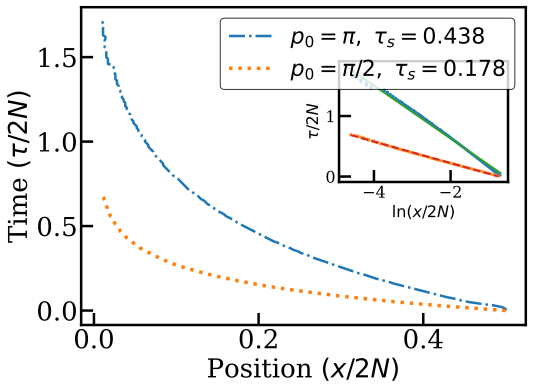

In [41]:
#EXTENDED SSH DQPT exacttttt

#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1
######################################################################################


def build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma,
                             periodic=False, dtype=np.complex128):
    """
    H_ext = sum_n [ t1(n) A_n^† B_n  + t2(n) B_n^† A_{n+1}
                  + t3(n) A_n^† B_{n+1} + t4(n) A_n^† B_{n+2} + h.c. ]
    with
        t1(n)=t1 * ((2n-1)/(2N-1))^sigma
        t2(n)=t2 * ((2n  )/(2N-1))^sigma
        t3(n)=t3 * ((2n-1)/(2N-1))^sigma
        t4(n)=t4 * ((2n  )/(2N-1))^sigma,
    where n = 1..N in the formula, but here we index n=0..N-1.
    """
    dim = 2*N
    H = np.zeros((dim, dim), dtype=dtype)

    denom = 2*N - 1
    for n in range(N):
        # map to paper's n -> (n+1)
        num_odd  = 2*(n+1) - 1   # 2n-1
        num_even = 2*(n+1)       # 2n

        t1n = t_a * (num_odd / denom)**sigma
        t2n = t_b * (num_even / denom)**sigma
        t3n = t_c * (num_odd  / denom)**sigma
        t4n = t_d * (num_even / denom)**sigma

        # 1) intracell:  A_n <-> B_n
        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        # 2) intercell (right, NN):  B_n <-> A_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        # 3) other NN (right):  A_n <-> B_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        # 4) next–next:  B_n <-> A_{n+2}
        if n < N-2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H


######################################################################################
######################################################################################


def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N, L, n0, p0, omega, dt, T, plot_times, x_stop):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    Evolution stops when the rescaled peak position x̃ reaches x_stop
    (or when the maximum time T is reached).
    """
    # 1) Build the Hamiltonians
    H_dqpt=  build_extended_ssh_exact(
        N,
        t_a=1,
        t_b=0.5,
        t_c=-0.5,
        t_d=-1,
        sigma=1,
        periodic=False
    )
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_dqpt* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(L, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the maximum number of time steps
    t_steps = int(np.round(T / dt))
    
    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []

    # Record t=0
    psi_abs = np.abs(psi.copy())
    peak_index = np.argmax(psi_abs)
    peak_positions.append(peak_index)
    rescaled_times.append(0.0)                 # τ̃ = t/L
    rescaled_positions.append(peak_index / L)  # x̃ = x/L

    # 5) Evolve the wavefunction in time until x̃ <= x_stop or T is exceeded
    for step in range(1, t_steps + 1):
        psi = U @ psi
        psi_abs = np.abs(psi)
        peak_index = np.argmax(psi_abs)
        peak_positions.append(peak_index)

        t_val = step * dt
        rescaled_times.append(t_val / L)          # τ̃
        rescaled_pos = peak_index / L             # x̃
        rescaled_positions.append(rescaled_pos)

        if rescaled_pos <= x_stop:
            break

    # Convert lists to numpy arrays
    x_data = np.array(rescaled_positions)   # x̃ = x/L
    t_data = np.array(rescaled_times)       # τ̃ = t/L

    # ---------------- FITTING SECTION (LOG-LINEAR) ----------------
    # Model: τ̃(x̃) = T0 - α ln(x̃)
    # Let u = ln(x̃) => τ̃ = b + m u with m = -α and b = T0

    # Sort data by position (helps for masking and for clean plotting)
    order = np.argsort(x_data)
    x_sorted = x_data[order]
    t_sorted = t_data[order]

    # Keep only points with x>0 and x<0.5 for near-horizon behavior
    mask = (x_sorted > 0) & (x_sorted < 0.5)
    x_fit = x_sorted[mask]
    t_fit = t_sorted[mask]

    u_fit = np.log(x_fit)

    # Straight-line fit: t_fit ≈ b + m*u_fit
    m_fit, b_fit = np.polyfit(u_fit, t_fit, 1)

    alpha_fit = -m_fit
    T0_fit = b_fit

    print(f"p0 = {p0:.6f}")
    print("Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)")
    print(f"Fitted T0   = {T0_fit:.6f}")
    print(f"Fitted alpha = {alpha_fit:.6f}")
    print("--------------------------------------------------")

    # Straight line for plotting in (u, t)
    u_fit_plot = np.linspace(u_fit.min(), u_fit.max(), 200)
    t_fit_plot = b_fit + m_fit * u_fit_plot
    # ------------------------------------------------------------

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # Return what we need for main plot + inset
    return (x_data, t_data, u_fit, t_fit, u_fit_plot, t_fit_plot, alpha_fit, turning_pos, turning_time)


###########################################################################################################################################
if __name__ == "__main__":
    N = 500
    L = 2*N           # Number of lattice sites
    omega = 50        # Gaussian width parameter
    n0 = 500          # Localization site for the Gaussian
    dt = 10            # Time step
    T = 2000          # Maximum evolution time
    plot_times = 33   # Unused now (kept to preserve signature)
    x_stop = 0.01     # Stop when x̃ reaches this value

    # Two different momenta
    p0_1 = np.pi
    p0_2 = np.pi/2

    # Run evolution for both p0 values
    x1, t1, u1_fit, t1_fit, u1_line, t1_line, tau_s1, xturn1, tturn1 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_1,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    x2, t2, u2_fit, t2_fit, u2_line, t2_line, tau_s2, xturn2, tturn2 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_2,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    # ---------------- MAIN PLOT (curved slowdown) ----------------
    fig, ax = plt.subplots(figsize=(8, 6))

    ax.plot(x1, t1, '-.', linewidth=2.5,
            label=fr"$p_0=\pi,\ \tau_s={tau_s1:.3f}$")
    ax.plot(x2, t2, ':', linewidth=3.5,
            label=fr"$p_0=\pi/2,\ \tau_s={tau_s2:.3f}$")

    ax.set_xlabel(r"Position $(x/2N)$")
    ax.set_ylabel(r"Time $(\tau/2N)$")
    ax.legend(loc="upper right", frameon=True,fontsize=22)
    # ax.set_xlim(left=max(min(x1.min(), x2.min()), 1e-6), right=max(x1.max(), x2.max()))

    # ---------------- INSET (top-right: log-linear straight lines) ----------------
    # Inset axes placement: [left, bottom, width, height] in axes fraction
    axins = ax.inset_axes([0.58, 0.45, 0.38, 0.38])

    # Plot only the masked fit-window points so the straight-line behavior is clear
    axins.plot(u1_fit, t1_fit, 'o', markersize=2, alpha=0.7)
    axins.plot(u2_fit, t2_fit, 's', markersize=2, alpha=0.7)

    # Plot the fitted straight lines
    axins.plot(u1_line, t1_line, '-', linewidth=2.0)
    axins.plot(u2_line, t2_line, '--', linewidth=2.0)

    axins.set_xlabel(r"$\ln(x/2N)$", fontsize=16)
    axins.set_ylabel(r"$\tau/2N$", fontsize=16)
    axins.tick_params(axis='both', which='major', labelsize=16)

    plt.tight_layout()
    plt.show()


p0 = 3.141593
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.250222
Fitted alpha = 0.438947
--------------------------------------------------
p0 = 1.570796
Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)
Fitted T0   = -0.132108
Fitted alpha = 0.177218
--------------------------------------------------


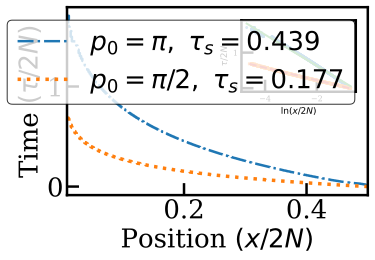

In [34]:
#EXTENDED SSH DQPT exacttttt

#SSH Time evolution


import numpy as np 
import matplotlib.pyplot as plt
from scipy.linalg import expm
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit

def idx_A(n):
    return 2 * n

def idx_B(n):
    return 2 * n + 1
######################################################################################


def build_extended_ssh_exact(N, t_a, t_b, t_c, t_d, sigma,
                             periodic=False, dtype=np.complex128):
    """
    H_ext = sum_n [ t1(n) A_n^† B_n  + t2(n) B_n^† A_{n+1}
                  + t3(n) A_n^† B_{n+1} + t4(n) A_n^† B_{n+2} + h.c. ]
    with
        t1(n)=t1 * ((2n-1)/(2N-1))^sigma
        t2(n)=t2 * ((2n  )/(2N-1))^sigma
        t3(n)=t3 * ((2n-1)/(2N-1))^sigma
        t4(n)=t4 * ((2n  )/(2N-1))^sigma,
    where n = 1..N in the formula, but here we index n=0..N-1.
    """
    dim = 2*N
    H = np.zeros((dim, dim), dtype=dtype)

    denom = 2*N - 1
    for n in range(N):
        # map to paper's n -> (n+1)
        num_odd  = 2*(n+1) - 1   # 2n-1
        num_even = 2*(n+1)       # 2n

        t1n = t_a * (num_odd / denom)**sigma
        t2n = t_b * (num_even / denom)**sigma
        t3n = t_c * (num_odd  / denom)**sigma
        t4n = t_d * (num_even / denom)**sigma

        # 1) intracell:  A_n <-> B_n
        H[idx_A(n), idx_B(n)] = t1n
        H[idx_B(n), idx_A(n)] = np.conj(t1n)

        # 2) intercell (right, NN):  B_n <-> A_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_B(n), idx_A(m)] = t2n
            H[idx_A(m), idx_B(n)] = np.conj(t2n)

        # 3) other NN (right):  A_n <-> B_{n+1}
        if n < N-1 or periodic:
            m = (n + 1) % N
            H[idx_A(n), idx_B(m)] = t3n
            H[idx_B(m), idx_A(n)] = np.conj(t3n)

        # 4) next–next:  B_n <-> A_{n+2}
        if n < N-2 or periodic:
            m = (n + 2) % N
            H[idx_B(n), idx_A(m)] = t4n
            H[idx_A(m), idx_B(n)] = np.conj(t4n)

    return H


######################################################################################
######################################################################################


def gaussian_wave_packet(L, n0, p0, omega):
    """
    Create a Gaussian wave packet.
    """
    n = np.arange(L)
    psi = (np.pi*omega**2)**(-0.25)*np.exp(-0.5*((n-n0)/omega)**2) * np.exp(1j*p0*n)
    #psi = np.exp(-0.5 * ((n - n0) / omega)**2) * np.exp(1j * p0 * n)
    psi /= np.linalg.norm(psi)
    return psi

def run_time_evolution(N, L, n0, p0, omega, dt, T, plot_times, x_stop):
    """
    Evolve an initial wave packet under the SSH Hamiltonian.
    Evolution stops when the rescaled peak position x̃ reaches x_stop
    (or when the maximum time T is reached).
    """
    # 1) Build the Hamiltonians
    H_dqpt=  build_extended_ssh_exact(
        N,
        t_a=1,
        t_b=0.5,
        t_c=-0.5,
        t_d=-1,
        sigma=1,
        periodic=False
    )
    
    # 2) Build the time evolution operator U = exp(-i H dt)
    U = expm(-1j * H_dqpt* dt)
    
    # 3) Create the initial wavefunction (using a Gaussian)
    psi = gaussian_wave_packet(L, n0, p0, omega)
    #psi= boosted_dirac_delta(N,n0,p0)
    
    # 4) Determine the maximum number of time steps
    t_steps = int(np.round(T / dt))
    
    # 7) Compute the peak positions and rescaled values for the 2D plot.
    peak_positions = []
    rescaled_times = []
    rescaled_positions = []

    # Record t=0
    psi_abs = np.abs(psi.copy())
    peak_index = np.argmax(psi_abs)
    peak_positions.append(peak_index)
    rescaled_times.append(0.0)                 # τ̃ = t/L
    rescaled_positions.append(peak_index / L)  # x̃ = x/L

    # 5) Evolve the wavefunction in time until x̃ <= x_stop or T is exceeded
    for step in range(1, t_steps + 1):
        psi = U @ psi
        psi_abs = np.abs(psi)
        peak_index = np.argmax(psi_abs)
        peak_positions.append(peak_index)

        t_val = step * dt
        rescaled_times.append(t_val / L)          # τ̃
        rescaled_pos = peak_index / L             # x̃
        rescaled_positions.append(rescaled_pos)

        if rescaled_pos <= x_stop:
            break

    # Convert lists to numpy arrays
    x_data = np.array(rescaled_positions)   # x̃ = x/L
    t_data = np.array(rescaled_times)       # τ̃ = t/L

    # ---------------- FITTING SECTION (LOG-LINEAR) ----------------
    # Model: τ̃(x̃) = T0 - α ln(x̃)
    # Let u = ln(x̃) => τ̃ = b + m u with m = -α and b = T0

    # Sort data by position (helps for masking and for clean plotting)
    order = np.argsort(x_data)
    x_sorted = x_data[order]
    t_sorted = t_data[order]

    # Keep only points with x>0 and x<0.5 for near-horizon behavior
    mask = (x_sorted > 0) & (x_sorted < 0.5)
    x_fit = x_sorted[mask]
    t_fit = t_sorted[mask]

    u_fit = np.log(x_fit)

    # Straight-line fit: t_fit ≈ b + m*u_fit
    m_fit, b_fit = np.polyfit(u_fit, t_fit, 1)

    alpha_fit = -m_fit
    T0_fit = b_fit

    print(f"p0 = {p0:.6f}")
    print("Fitting equation:  τ̃(x̃) = T0 - α ln(x̃)")
    print(f"Fitted T0   = {T0_fit:.6f}")
    print(f"Fitted alpha = {alpha_fit:.6f}")
    print("--------------------------------------------------")

    # Straight line for plotting in (u, t)
    u_fit_plot = np.linspace(u_fit.min(), u_fit.max(), 200)
    t_fit_plot = b_fit + m_fit * u_fit_plot
    # ------------------------------------------------------------

    # Determine the turning point (the minimum of the rescaled positions)
    turning_index = np.argmin(rescaled_positions)
    turning_time = rescaled_times[turning_index]
    turning_pos = rescaled_positions[turning_index]

    # Return what we need for main plot + inset
    return (x_data, t_data, u_fit, t_fit, u_fit_plot, t_fit_plot, alpha_fit, turning_pos, turning_time)


###########################################################################################################################################
if __name__ == "__main__":
    N = 500
    L = 2*N           # Number of lattice sites
    omega = 50        # Gaussian width parameter
    n0 = 500          # Localization site for the Gaussian
    dt = 1            # Time step
    T = 2000          # Maximum evolution time
    plot_times = 10   # Unused now (kept to preserve signature)
    x_stop = 0.01     # Stop when x̃ reaches this value

    # Two different momenta
    p0_1 = np.pi
    p0_2 = np.pi/2

    # Run evolution for both p0 values
    x1, t1, u1_fit, t1_fit, u1_line, t1_line, tau_s1, xturn1, tturn1 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_1,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    x2, t2, u2_fit, t2_fit, u2_line, t2_line, tau_s2, xturn2, tturn2 = run_time_evolution(
        N=N,
        L=L,
        n0=n0,
        p0=p0_2,
        omega=omega,
        dt=dt,
        T=T,
        plot_times=plot_times,
        x_stop=x_stop
    )

    # ---------------- MAIN PLOT (curved slowdown) ----------------
    fig, ax = plt.subplots(figsize=(6.0, 4.2))

    ax.plot(x1, t1, '-.', linewidth=2.5,
            label=fr"$p_0=\pi,\ \tau_s={tau_s1:.3f}$")
    ax.plot(x2, t2, ':', linewidth=3.5,
            label=fr"$p_0=\pi/2,\ \tau_s={tau_s2:.3f}$")

    ax.set_xlabel(r"Position $(x/2N)$")
    ax.set_ylabel(r"Time $(\tau/2N)$")
    ax.legend(loc="upper right", frameon=True)
    ax.set_xlim(left=max(min(x1.min(), x2.min()), 1e-6), right=max(x1.max(), x2.max()))

    # ---------------- INSET (top-right: log-linear straight lines) ----------------
    # Inset axes placement: [left, bottom, width, height] in axes fraction
    axins = ax.inset_axes([0.58, 0.55, 0.38, 0.38])

    # Plot only the masked fit-window points so the straight-line behavior is clear
    axins.plot(u1_fit, t1_fit, 'o', markersize=2, alpha=0.7)
    axins.plot(u2_fit, t2_fit, 's', markersize=2, alpha=0.7)

    # Plot the fitted straight lines
    axins.plot(u1_line, t1_line, '-', linewidth=2.0)
    axins.plot(u2_line, t2_line, '--', linewidth=2.0)

    axins.set_xlabel(r"$\ln(x/2N)$", fontsize=9)
    axins.set_ylabel(r"$\tau/2N$", fontsize=9)
    axins.tick_params(axis='both', which='major', labelsize=8)

    plt.tight_layout()
    plt.show()
